<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/ML_Auto_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ToDo
letölteni a pythont és ott futtatni a kódot

huzzon egy nyomot a becslésre is, hogy lássam, hogy hova a faszomba becsüli az első modell
a mit is? ja igen a középtől való eltérést.

csinálni egy második modelt illetve kettőt

az egyik legyen a régi, de hagyjuk a faszba a fel-le becslést, az egész before aftert
és csak egyszerűen kössünk rá a becslésre valamilyen szabályt. Ha nagyobb mint x akkor +3

a másik verzió amit gyorsan ki kéne próbálni, hogy a linreg helyett beteszek egy mlp-t

**ToDo:**

Megnézni, hogy normalizálom-e az adatokat a neruális háló előtt, mert lehet hogy ez viszi félre a becslést.

**Gondolat:**

Nyilvánvaló, hogy egy idő után se a before after adatokra nem képes jó becslést adni
```
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[2.13709439]]
-------- 1 y up ->  center =  [[1.94404015]]
-------- 1 y up ->  right  =  [[1.85292015]]
```
Ezért arra gondoltam, hogy beeresztem azokat az adatokat is, amelyeket az action körben lép meg.
Ha úgy se megy akkor át kell gondolni a képletet! A becslés képleétt, before after.

A másik, hogy csinálni kéne egy ábrát arra nézve, hogy mi a kapcsolat a tényleges before after között és nem csinálni rá semmilyen becslét.
Egyszerűen minden metrikára megnézni, hogy mi a lépés elötti adata és mi a lépés utáni adata. Ezt meg lehet csinálni úgy, hogy egy ploton vízszintesen van before, fűggőlegesen az after, és színnel van kódolva az action (kék +1, piros -1)

Amúgy most jutott eszembe, hogy egyébként a 0 actionre nem is becsülünk lehet, hogy ez is hiba.

Vagy úgy is lehet ábrázolni, hogy egy ploton van a +1 és külön egy másik ploton a -1. A lényeg, hogy nem becslés, hanem a before after közötti kapcsolat szenzoronként.

A fenti viszgálatot azért végzem el, hogy lássam, hol kap olyan adatokat ** milyen helyzetben kap olyan adatokat ** a before after adatsor amitől ilyen mértékben elromlik az előre jelző képessége.

2. Teljesen nyilvánvaló, hogy a szenzoros adatok és a tengelytől mért távolság közötti kapcsolatot a lineáris regresszió képtelen megragadni.

3. Utána ki kell próbálni, hogy a szenzorok nem előre néznek, hanem oldalra. Igen ez teljes egészében az amit a célváltozó is mér. De csak ellenőrzés végett.



# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Empty](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Szintetikus adatok generálása](#szintetikus_adatok)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


## Bevezető gondolat

Összességében az egésszel kapcsolatban van egy hatalmas kérdőjel.

Tulajdonképpen két paradigma van.

Az egyik - nem az enyém - így néz ki:

Egyszerűen becsüjük meg azt, hogy az adott szenzoros adatok alapján mi legyen a döntés kimenetele (fel, le, semmi). Akkor hoztunk jó döntést, ha valamilyen metrika alapján valamilyen költséget minimalizáltunk, vagy maximalizáltunk. Például, ha egy döntéssel sikerült közelebb kerülni a záróvonalhoz, vagyis az út közepére. Vagy az az autó a lehető legmeszebb jutott el anélkül, hogy érintette volna a falat és lehetőleg a leggyorsabban is.

A másik - amin én dolgozom - viszont egy plusz lépéssel egészül ki és ettől sokkal bonyolultabb. Hogy van-e létjogosultsága az ennek a kisérletnek a lényege.

Vannak szenzoros adataink, ami alapján hozunk egy döntést. Eddig olyan mint a máisik, de az érdemi különbség a módszerben és a tanulás folyamatában van.

A szenzoros adatokból megbecsüljük azt, hogy mennyire vagyunk jók és nem azt becsüljük, hogy mit kéne tenni!

Ha nem vagyunk jók akkor egy második modell segítségével csinálunk valamilyen lépést, amitől azt várjuk, hogy jók leszünk.

És itt jogosan merül fel a kérdés, hogy de miért nem az első módszert alkalmazzuk és erre most még én sem tudom a választ pontosan megadni. De röviden erről szól ez a kutatás.

In [50]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression

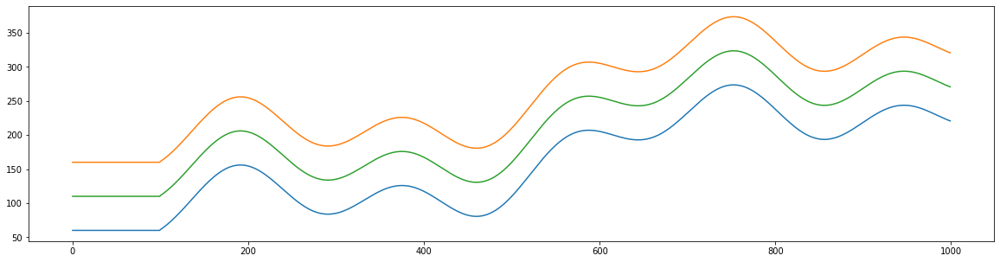

In [51]:
distance    = np.arange(0, 1000, 1)
road        = 100
wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
wall_left[0:100] = 60
wall_right  = wall_left + road
wall_center = ( wall_left + wall_right ) / 2


plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [52]:
class Road():
  def __init__(self, wide):
    self.distance    = np.arange(0, 1000, 1)
    self.wide        = wide
    self.wall_right  = 30*(np.sin(self.distance/180)) + self.distance * 0.3 + 30 * np.cos(self.distance/30) + 50 * np.sin(self.distance/90)
    self.wall_right[0:100] = 60
    self.wall_left   = self.wall_right + self.wide
    self.wall_center = ( self.wall_left + self.wall_right ) / 2

  def show(self):
    fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 300); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
    return fig, ax


In [53]:
class Car():
  def __init__(self, road):
    self.road = road
    self.x = 0
    self.y = self.road.wall_center[0]
    self.sight = 154           # ennyit lát előre 300, 54
    self.sight_center = 150

    self.y_history  = []
    self.x_history  = []
    self.y_center   = []; self.y_center = self.road.wall_center
    self.y_distance = []
    self.y_distance_real = []
    self.y_distance_predicted = []
    self.regression = LinearRegression(fit_intercept=False)
    self.regression_right = LinearRegression()
    self.regression_center = LinearRegression()
    self.regression_left = LinearRegression()
# most
    self.sensor_center = []
    self.sensor_left   = []
    self.sensor_right  = []
    self.before  = []
    self.after   = []

    self.mesterseges_coutner = 0


  def calculate_distances(self):
    # ha bármikor kevesebb a faltól mért távolsága bármelyik szenzoron akkor a szenzorokon mért távolság is ennyi lesz
    
    k = self.x; d = 0
    while(k < self.x + self.sight_center):
      k += 1; d += 1
      self.distance_center_from_wall = d
      if(int(self.road.wall_left[k]) < self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break
      if(int(self.road.wall_right[k]) > self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1;  d += 1
      self.distance_left_from_wall = d
      if(int(self.road.wall_left[k]) < self.y + d):
        print('Sensor from left wall = ', self.distance_left_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1; d += 1
      self.distance_right_from_wall = d
      if(int(self.road.wall_right[k]) > self.y - d):
        print('Sensor from right wall = ', self.distance_right_from_wall)
        break

    #ki kell kalkulálni a tényleges távolságot a ball és a jobb faltól
    # mert ezekre fogom tanítani a neurális hálót, ahol ezeket becsüljük
    # és a bemeneti változó a 3 szenzorból érkező adat lesz.
    # valójában azt mérjük, hogy milyen távolságra van az út közepétől

    self.distance_from_top     = abs(self.road.wall_left[self.x] - self.y)
    self.distance_from_bottom  = abs(self.road.wall_right[self.x] - self.y)
    print('most távolsagra van a felső faltól = ', self.distance_from_top)
    print('most távolsagra van az alsó faltól = ', self.distance_from_bottom)


    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')
    print('self.x                       = ', self.x)
    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')

    # mi lenne, ha mégis inkább a kettő hányadosát becsülném (1 ha egyenlő távolságra van)
    # self.vertical_distance_from_middle = self.road.wall_center[self.x] - self.y
    # self.vertical_distance_from_middle = self.distance_from_top / self.distance_from_bottom

    self.vertical_distance_from_middle = self.y - self.road.wall_center[self.x]

    print('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')
    print('self.vertical_distance_from_middle = ', self.vertical_distance_from_middle)
    print('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')




    print('ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa = ', self.vertical_distance_from_middle)


    # de elötte szeretnék még valamit leellenőrizni
    # ezeknek a hossza nem fog megeggyezni a tényleges futások számával, hanem több lesz (milyen jó lett volna erre egy teszt esetet írni és akkor test driven development lenne)

    print('\t\t\t ---------------- Teszt ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Teszt End --------------')


  def append(self):
    self.y_distance.append(self.vertical_distance_from_middle)

    self.sensor_left.append(self.distance_left_from_wall)
    self.sensor_center.append(self.distance_center_from_wall)
    self.sensor_right.append(self.distance_right_from_wall)

    print('\t\t\t ---------------- Append ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Append End --------------')


  def run(self):
    for i in range(0, 1000, 1):
      print('# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------')
      _summary_mlp_prediction_was_taken = 0
      _summary_mlp_fit_was_taken = 0
      _summary_mesterseges_mozgatas = 0
      _summary_action_was_taken = 0

      self.x = i
      self.calculate_distances()
      # !!!
      self.append()
      # !!!
      if( i % 1 == 0 ):
        if ( i % 20 == 0 ):
          self.plot()
          print(' --- plot --- ')

      if( i >= 0 ):

        if( i % 3 == 0 and i >= 12 ):

          print('------------------------------ IF i % 3 == 0 ------------------------------')
          print('# i = ', i)
          print('# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          y = np.array([self.y_distance]).T
          print('X.shape = ', X.shape)
          print('y.shape = ', y.shape)
          # print('X       = ', X)
          # print('y       = ', y)
          print('i       = ', i)
          self.regression.fit(X, y)
          _summary_mlp_fit_was_taken = 1

        if( i % 3 == 1 and i >= 22 ):

          print('------------------------------ IF i % 3 == 1 ------------------------------')
          print('# i = ', i)
          print('# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja')
          X_test = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          _X_test = np.array([X_test[-1,:].reshape(-1,1)])
          _X_test = np.array([X_test[-1,:]])
          print('actual _X_test = ', _X_test)
          predicted_test = self.regression.predict(_X_test)
          _summary_mlp_prediction_was_taken = 1
          self.y_distance_real.append(self.y_distance[-1])
          self.y_distance_predicted.append(predicted_test)
          print('actual predicted = ', predicted_test)
          # print('actual predicted = {:.5f}'.format(predicted_test[0,0]))
          print('actual self.y_distance[-1] = ', self.y_distance[-1])
#          print('actual self.y_distance     = ', self.y_distance)
          print('len(self.y_distance_real)      = ', len(self.y_distance_real))
          print('len(self.y_distance_predicted) = ', len(self.y_distance_predicted))

          if( i % 4 == 0 ):
            # olyan szar a becslés, hogy az hihetetlen
            plt.figure(figsize=(12, 5)); plt.scatter(self.y_distance_real, self.y_distance_predicted); plt.show()

            # korábban csak azokat az adatokat plottoltam amik a tanulás után lettek visszamérve,
            # de nézzük meg a teljes adatsoron
            X_test_full = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
            _X_test_full = X_test_full
            predicted_test_full = self.regression.predict(_X_test_full)
            _y_test_full = np.array([self.y_distance]).T
            print(_y_test_full.shape)
            print(predicted_test_full.shape)
            plt.figure(figsize=(12, 5)); plt.scatter(_y_test_full, predicted_test_full, c='r'); plt.show()

            plt.figure(figsize=(12, 5)); ax = plt.axes(); ax.scatter(_y_test_full, predicted_test_full, c='r')
            ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10]); plt.show()


        # most jön az, hogy véletlenszerűen kell egyet ugrania fel, vagy le
        # ez felel meg a before after dologonak
        # az így létrejött adatokat is el kell tárolni úgy mint
        # mi volt a szezoros adat before
        # mi lett a szenzoros adat after
        # mi volt az y before, mi lett az y after
        # mivel mindíg egyet fogunk csak lépni, ezért a dif mindíg egy lesz
        # de ezt számítani kell, mivel a későbbiek folyamán lehet, hogy többet is fog lépni

        if( i % 3 == 2 ):

          print('------------------------------ IF i % 3 == 2 ------------------------------')
          print('# i = ', i)
          print('# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok')

          _summary_mesterseges_mozgatas = 1
          
          if( self.mesterseges_coutner == 0 ):                             # Első lépésben fel
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up first')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 1

          elif( self.mesterseges_coutner == 1 ):                           # Második lépésben le
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down first')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 2

          elif( self.mesterseges_coutner == 2 ):                           # Harmadik lépésben le
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down second')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 3

          elif( self.mesterseges_coutner == 3 ):                           # Negyedik lépésben fel
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up second')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 0

          else:
            print('semmi\n\n\n\n')

          print('self.y = ', self.y)



# itt van egy érdekesség amit csak magamnak írok fel
# ezen a ponton lépünk ki a három if ágból - if( i % 3 == _ )

# ez azért fontos, mert ami itt következik az mindíg lefut
# akár volt neurális háló tanítás
# akár volt neurális háló predikció visszamérése
# akár volt mesterséges mozgatás


# felmerül a kérdés de csak felmerül, hogy nem lehet-e az, hogy ezt csak akkor kéne elvégezni amikor nincs neurális háló tanítás és nincs mesterséges mozgatás sem
# ezt csak egy kísérlet ereéig ki kéne próbálni (if i % 3 == 1) -> vagyis amikor az nn predikció mérése történik

        action = 0
        if( i % 3 == 0 ):

          if( len(self.before) > 9 ):           # ha már van néhány before after adatunk, akkor

            print('------------------------------ IF len(self.before) > 9 ------------------------------')
            print('\n')
            print('# i = ', i)
            print('  Ha már van elég before after adatunk')
            print('# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára')
            # minden egyes szezor adatára el kell készítenünk azt a lineráis regressziós modelt ami megmondja, hogy mi lenne a szenzor értéke, ha 1, 2, 3, ... n lépéssel elvinnénk a kocsit

            # oké megvan a before és megvan az after (self.y, left, center, right)
            before_array = np.array(self.before)
            after_array  = np.array(self.after)
            y_delta = after_array[:,0] - before_array[:,0]
            delta_array = after_array - before_array
#            print('--------------------------------------')
#            print(y_delta)
#            print(before_array.shape)
#            print(after_array.shape)
#            print(self.before)
#            print(self.after)
#            print(delta_array)
#            print('--------------------------------------')

            # képlet szerint senzor' = w0 + w1 * senzor + w2 * delta_y
            # valójában ez a képlet nem jó és nem így kéne számolni, mert ez figyelembe veszi a szenzor aktuális értékét is, de most így hagyom
            # ------- fenti sort nem tudom miért írtam, hogy baj az ha figyelembe veszük az aktuális értéket is, hm.

            print('# Linear Regression Learning --------------------------------------------------------------------------------------')
            print('\t\t # Linear Regression Training Results -------------------------------------------------------------------------')

            _X_left = np.array([before_array[:,1], delta_array[:,0]]).T # left és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_left = delta_array[:,1].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_left = after = after_array[:,1].reshape(-1, 1)
#            regression_left = LinearRegression()
            regression_left = self.regression_left
            regression_left.fit(_X_left, _y_left)
            # print('\t\t _X_left = \n', _X_left)
            # print('\t\t _y_left = \n', _y_left)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_left.coef_ = ', regression_left.coef_)
            print('\t\t regression_left.intercept_ = ', regression_left.intercept_)
            _predicted_left = regression_left.predict(_X_left)
#            plt.scatter(_y_left, _predicted_left)
#            plt.ylabel('_predicted_left')
#            plt.xlabel('_true_y_left')
#            plt.show()
            # kiplottolom a before after adatokat egy konkrét szenzor értékeire
#            plt.scatter(before_array[:,1], after_array[:,1], c='black')
#            plt.ylabel('after')
#            plt.xlabel('before')
#            plt.show()

            _X_center = np.array([before_array[:,2], delta_array[:,0]]).T # center és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_center = delta_array[:,2].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_center = after_array[:,2].reshape(-1, 1)
#            regression_center = LinearRegression()
            regression_center = self.regression_center
            regression_center.fit(_X_center, _y_center)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_center.coef_ = ', regression_center.coef_)
            print('\t\t regression_center.intercept_', regression_center.intercept_)
            _predicted_center = regression_center.predict(_X_center)
#            plt.scatter(_y_center, _predicted_center)
#            plt.ylabel('_predicted_center')
#            plt.xlabel('_true_y_center')
#            plt.show()
            # kiplottolom a before after adatokat egy konkrét szenzor értékeire
#            plt.scatter(before_array[:,2], after_array[:,2], c='black')
#            plt.ylabel('after')
#            plt.xlabel('before')
#            plt.show()

            _X_right = np.array([before_array[:,3], delta_array[:,0]]).T # right és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_right = delta_array[:,3].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_right = after_array[:,3].reshape(-1, 1)
#            regression_right = LinearRegression()
            regression_right = self.regression_right
            regression_right.fit(_X_right, _y_right)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_right.coef_ = ', regression_right.coef_)
            print('\t\t regression_right.intercept_ = ', regression_right.intercept_)
            _predicted_right = regression_right.predict(_X_right)
#            plt.scatter(_y_right, _predicted_right)
#            plt.ylabel('_predicted_right')
#            plt.xlabel('_true_y_right')
#            plt.show()
            # kiplottolom a before after adatokat egy konkrét szenzor értékeire
#            plt.scatter(before_array[:,3], after_array[:,3], c='black')
#            plt.ylabel('after')
#            plt.xlabel('before')
#            plt.show()


            # most ki kell számolni, hogy mennyi lenne a szenzorok értéke, ha fel le lépkednénk

            # mondjuk maximalizáljuk a fel le lépkedés mértékét 5-ben

            move = np.array([-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5])

            move = np.array([-2, -1, 0, 1, 2])

            move = np.array([-3, -2, -1, 0, 1, 2, 3])

  # most


            print('\t # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------')

            print('\t\t # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke')
            proba_X_metrika   = np.array([1,1]).reshape(1, -1)
            print('proba_X_metrika   = ', proba_X_metrika)
            predicted_proba_left = regression_left.predict(proba_X_metrika)
            predicted_proba_center = regression_center.predict(proba_X_metrika)
            predicted_proba_right = regression_right.predict(proba_X_metrika)
            print('-------- 1 y up ->  left   = ', predicted_proba_left)
            print('-------- 1 y up ->  center = ', predicted_proba_center)
            print('-------- 1 y up ->  right  = ', predicted_proba_right)
            print('\n')

            # EGY KURVA NAGY ELMÉLETI DILLEMMÁHOZ ÉRKEZTEM.

            # HÁROM MEGOLDÁS VAN

            # EBBŐL SZERINTEM MOST A LEGROSSZABBAT VÁLASZOTTAM

            # 1, MINDENKÉPPEN VÁLASZT EGYET, A LEGJOBBAT

            # 2, CSAK AKKOR MODOSÍT HA KÖZELEBB TUDJA VINNI A KÖZÉPPONTHOZ MINT AHOL MOST VAN
            
            action = 0; tmp = 999999990

            for j in move:
              print('\n')
              print('\t\t minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba')
              print('\t\t j = ', j)
              # ide be kell helyettesítenem az éppen aktuális értéket, olyan mintha egy új X változót csinálnék amiben csak egy sor van és arra kérnék egy becslést a korábbi modell alapján
              # a bement az éppen aktuális szenzoros érték és az új lépés

              # na majd ezt a bemenetet kell ellenőrizni, hogy stimmel-e a tanítás során használt bemenettel
              _X_left   = np.array([[self.distance_left_from_wall, j]])
              _X_center = np.array([[self.distance_center_from_wall, j]])
              _X_right  = np.array([[self.distance_right_from_wall, j]])

              print('\t\t ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------')
              print('\t\t _X_left   = ', _X_left)
              print('\t\t _X_center = ', _X_center)
              print('\t\t _X_right  = ', _X_right)

              # a fenti értékek valószínűleg jók, de mindíg minden lépésnél ellenőrizni kell

              predicted_left   = regression_left.predict(_X_left)
              predicted_center = regression_center.predict(_X_center)
              predicted_right  = regression_right.predict(_X_right)

              print('\t\t predicted_left   = ', predicted_left)
              print('\t\t predicted_center = ', predicted_center)
              print('\t\t predicted_right  = ', predicted_right)

              print('\t\t --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------')
              print('\t\t regression_left.coef_   = ', regression_left.coef_)
              print('\t\t regression_center.coef_ = ', regression_center.coef_)
              print('\t\t regression_right.coef_  = ', regression_right.coef_)
              print('\t\t regression_left.intercept_   = ', regression_left.intercept_)
              print('\t\t regression_center.intercept_ = ', regression_center.intercept_)
              print('\t\t regression_right.intercept_  = ', regression_right.intercept_)

              # nekünk majd azt az értéket kell választanunk amelyik segítségével a legközelebb jutunk a 1 értékhez

              _X = np.array([predicted_left.ravel(), predicted_center.ravel(), predicted_right.ravel()]).T    # figyelni kell rá, hogy eredetileg is ez volt-e a változók sorrendje

              print('\t\t # Ez lesz a bemenete a neurális hálónak')
              print('\t\t -------------------------X-------------------------')
              print('\t\t ', _X)
              print('\t\t ---------------Brutálisan hülye dolgot jelez előre ezért ellenőrizni kell, hogy mi a gond. Esetleg a bemeneti adatok?-----------------')

              predicted_position = self.regression.predict(_X)

              print('\t\t predicted_position = ', predicted_position)
              print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')

              # legyünk bátrak és módosítsuk az autó self.y pozicióját

              # azzal az értékkel amely abszolút értékben a legkissebb, helyett
              # mivel a célváltozónk akkor jó ha 1. mivel a felső/alsótól mért távolság hányadosa
              # ezért itt azt az értéket kell kiválasztani ami a legközelebb van +1-hez (és nem azt amelyik 0-hoz)

              # természetesen ezen változtatni kell ha ismét az középvonaltól való eltérés mértékét akarjuk becsülni
              # de ahhoz fenti is át kell állítani az adatokat

              if( abs(0 - predicted_position) < tmp):       # rossz - javítva - tesztelés alatt
                action = j
                tmp = abs(0 - predicted_position)
                print('\t\t ---------------------')
                print('\t\t  action = ', action)
                print('\t\t  predicted_position = ', predicted_position)
                print('\t\t  distance from 0 (tmp)= ', tmp)
                print('\t\t ---------------------')

              print('\t\t adott j-re {0} kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------'.format(j))
              print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')
            
            print('\t minden j-re kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------\n')

# igazság szerint ez a kör ahogy mondtam minden lépésben lefut ha már van elég before after adatunk


# a döntés azonban csak akkor fut le ha az alábbi feltétel teljesül

          if( i % 3 == 0 ):                                                       # ugyan ez a feltétel amikor tanítom az út közepének a becslésére
            print('------------------------------ IF i % 3 == 0 ------------------------------')
            _summary_action_was_taken = 1
            print('=================== TAKE ACTION ===================')
            print('-------- ennyivel módosítom self.y értékét --------')
            print('self.y régi értéke = ', self.y)
            self.y = self.y + action
            print('self.y új értéke   = ', self.y)
            print('action             = ', action)
            print('----------------- módosítás vége -----------------')

          # újra kell gondolni az egészet, ugyanis akkor is ki kell számolni a before after értéket amikor modosítom a pozicióját,
          # vagyis végig kell gondolni ezt az egészet.
          # az első elképzelésem az volt, hogy a poziciót csak bizonyos esetben modosíthatom, csak akkor amikor nincs tanítás, és nincs szimulált emelés, vagy csökkentés sem
          # utóbbit az if( i % 3 == 2) feltétellel szűrtem


      # adjuk hozzá az értéket a self.y_history-hoz
      print('# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------')
      print('#   itt adom hozzás a self.y a self.y_history-hoz')
      self.y_history.append(self.y)
      print('#    self.y :')
      print(self.y)
#      print('#   self.y_history after append :')
#      print(self.y_history)
      print('# \t\t ----------------- Summary -----------------')
      print('# \t\t\t _summary_mlp_fit_was_taken         = ', _summary_mlp_fit_was_taken)
      print('# \t\t\t _summary_mlp_prediction_was_taken  = ', _summary_mlp_prediction_was_taken)
      print('# \t\t\t _summary_mesterseges_mozgatas      = ', _summary_mesterseges_mozgatas)
      print('# \t\t\t _summary_action_were_taken         = ', _summary_action_was_taken)
      print('# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
          



  def plot(self):
    fig, ax = self.road.show()
    circle = plt.Circle((self.x, self.y), 5, color='black')
    ax.add_patch(circle)
    ax.plot(range(int(self.x), int(self.x+self.distance_center_from_wall)), np.repeat(self.y, self.distance_center_from_wall))
    ax.plot(range(int(self.x), int(self.x+self.distance_left_from_wall)), range(int(self.y), int(self.y+self.distance_left_from_wall)))
    ax.plot(range(int(self.x), int(self.x+self.distance_right_from_wall)), range(int(self.y), int(self.y-self.distance_right_from_wall), -1))
    if( len(self.y_history) > 0 ):
      ax.plot(self.y_history)
    plt.show()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


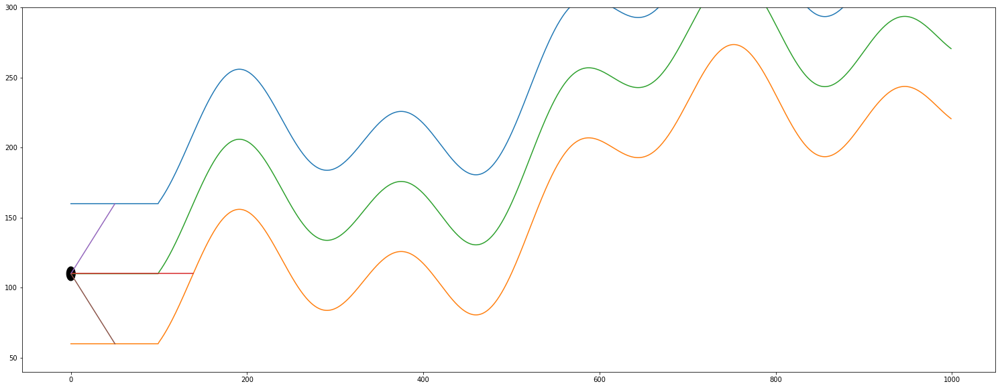

In [54]:
road = Road(wide = 100)
auto = Car(road)

auto.calculate_distances()
auto.plot()

In [55]:
auto.calculate_distances()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------
			 ---------------- 

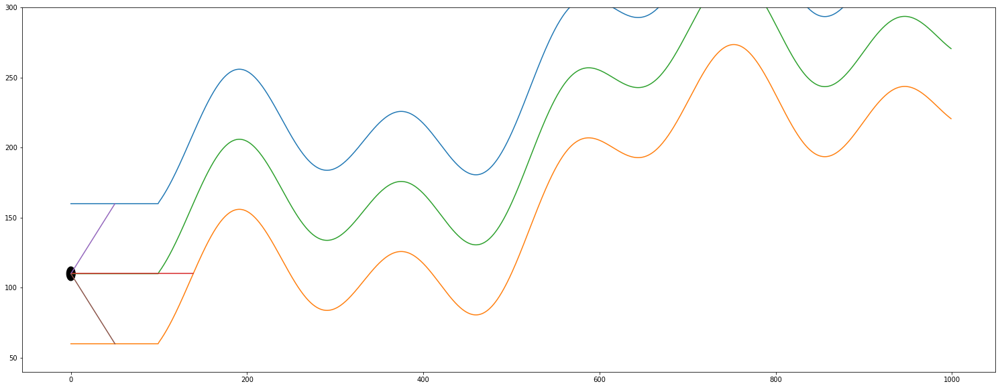

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  1
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje --------------------------------

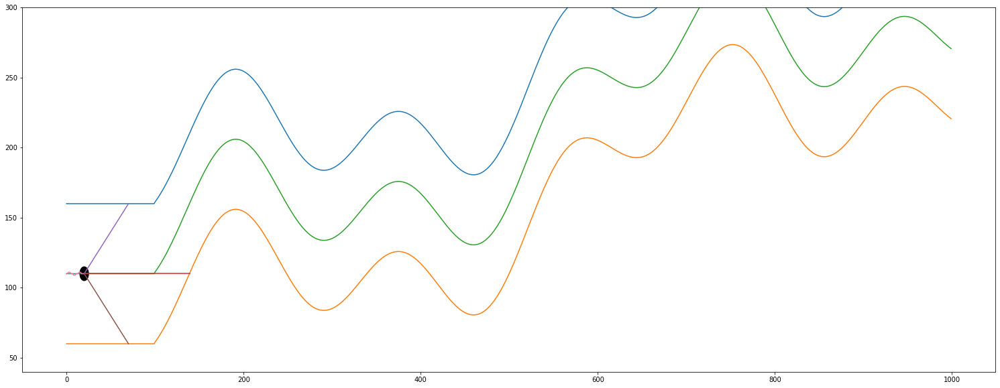

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  20
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  119
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  20
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  21
			 len(self.sensor_left)   =  21
			 len(self.sensor_center) =  21
			 len(self.sensor_right)  =  21
			 self.x              

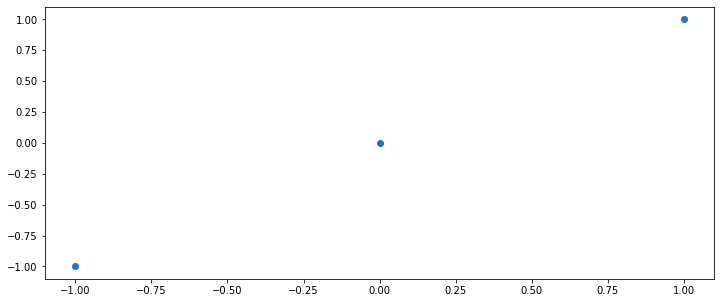

(29, 1)
(29, 1)


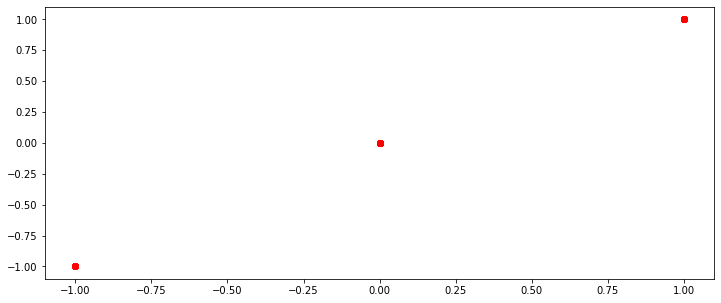

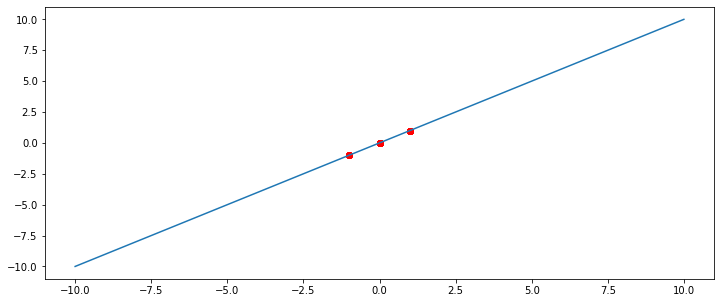

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  112
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccc

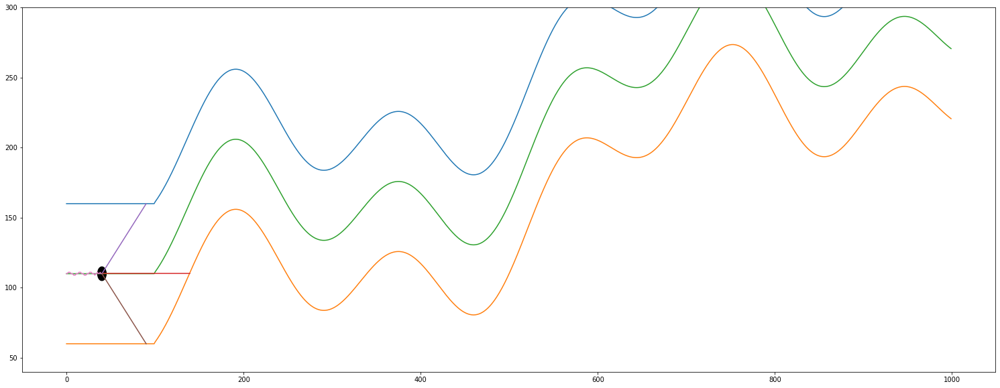

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  40
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 51 100  51]]
actual predicted =  [[9.2148511e-15]]
actual self.y_distance[-1] =  0.0
len(self.y_distance_real)      =  7
len(self.y_distance_predicted) =  7


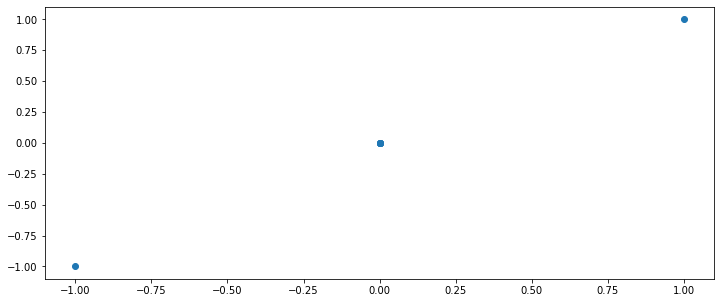

(41, 1)
(41, 1)


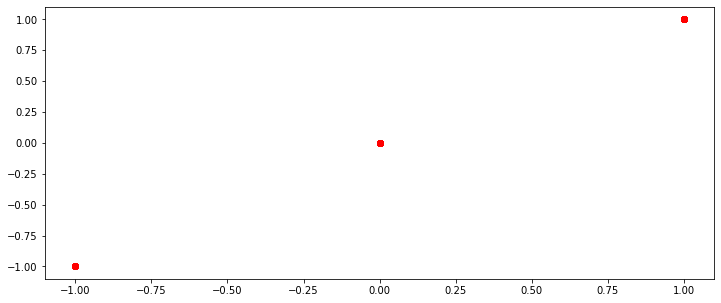

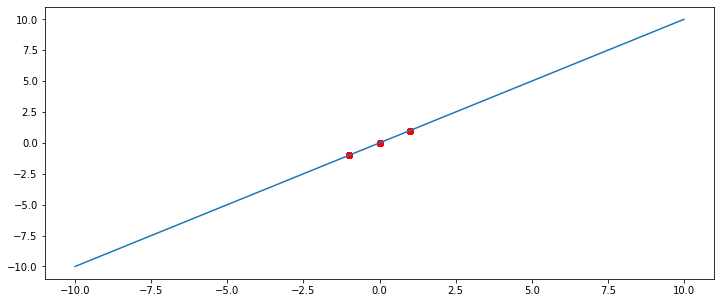

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  99
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

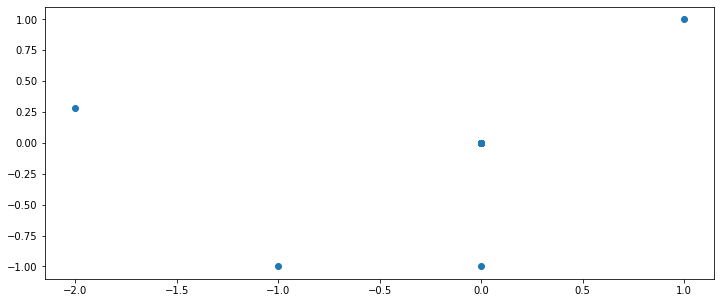

(53, 1)
(53, 1)


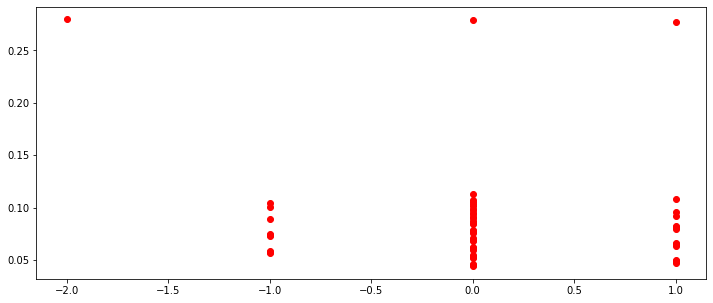

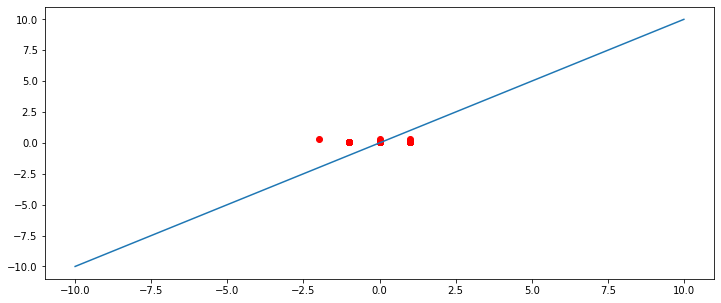

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
108.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  86
Sensor from left wall =  147
Sensor from right wall =  48
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccc

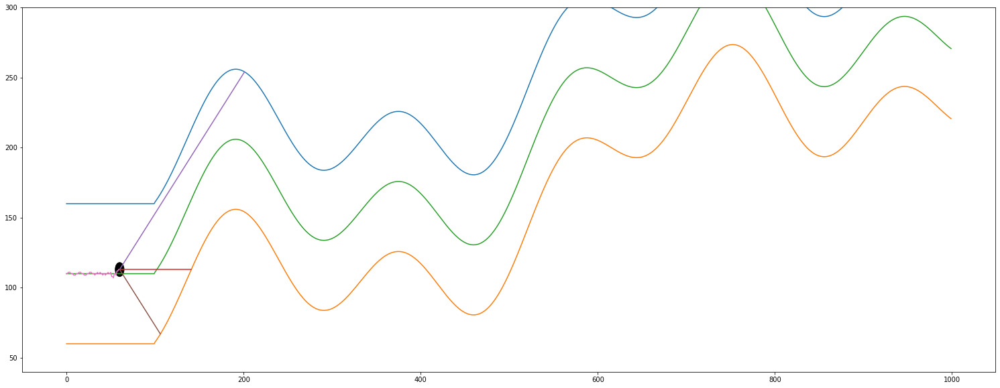

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  60
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (61, 3)
y.shape =  (61, 1)
i       =  60
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  60
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.75147312 -5.62514731]]
		 regression_left.intercept_ =  [12.69717632]
		 ------------------------------- valyon mennyire jó enne

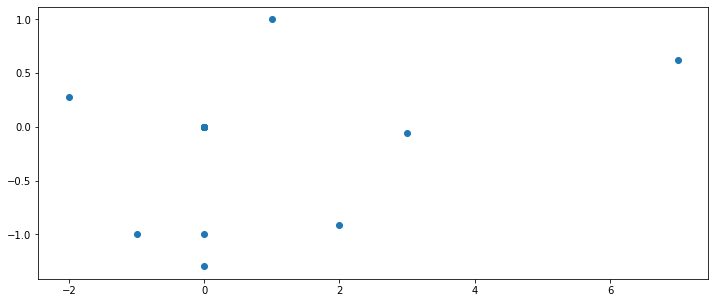

(65, 1)
(65, 1)


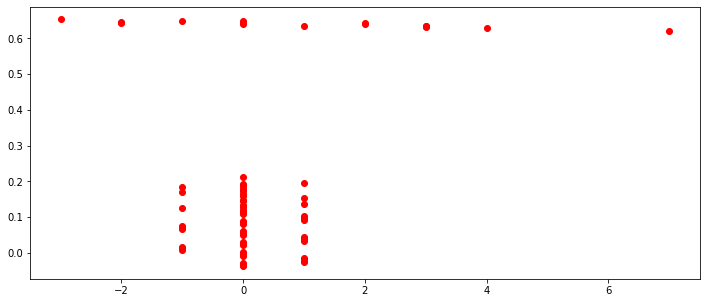

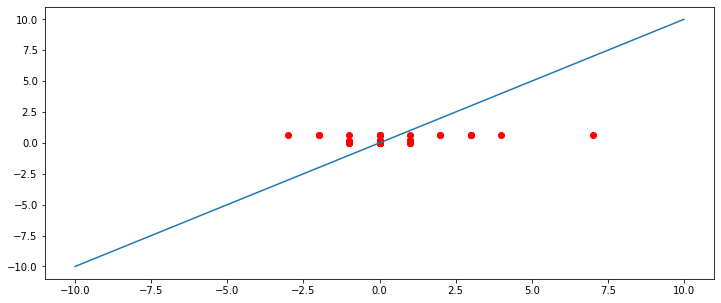

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
117.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  80
Sensor from left wall =  137
Sensor from right wall =  46
most távolsagra van a felső faltól =  43.0
most távolsagra van az alsó faltól =  57.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccc

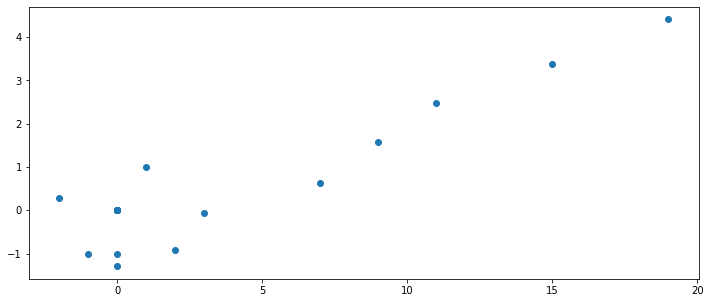

(77, 1)
(77, 1)


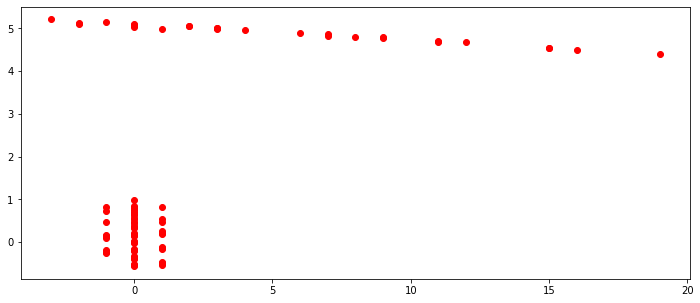

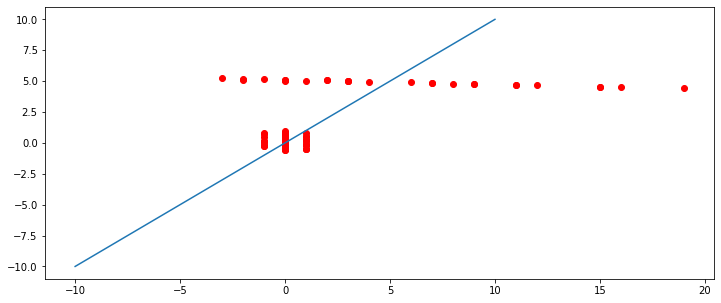

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
129.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  77
Sensor from left wall =  125
Sensor from right wall =  45
most távolsagra van a felső faltól =  31.0
most távolsagra van az alsó faltól =  69.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccc

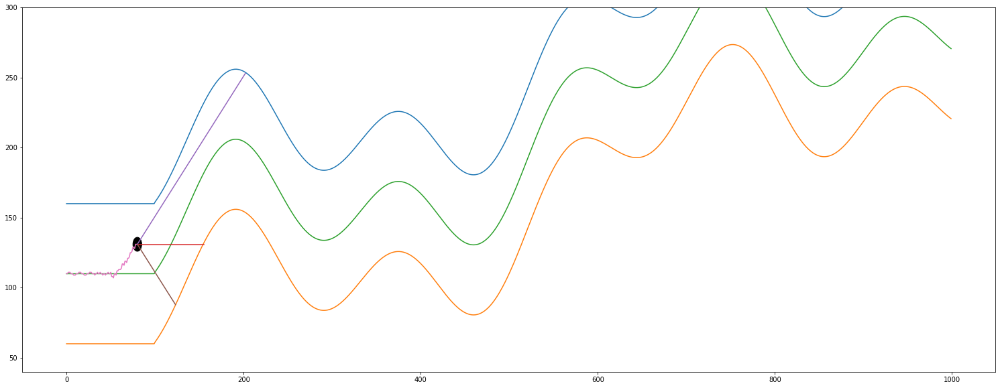

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  80
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  75
Sensor from left wall =  124
Sensor from right wall =  44
most távolsagra van a felső faltól =  30.0
most távolsagra van az alsó faltól =  70.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  80
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  20.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  20.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  81
			 len(self.sensor_left)   =  81
			 len(self.sensor_center) =  81
			 len(self.sensor_right)  =  81
			 self.x              

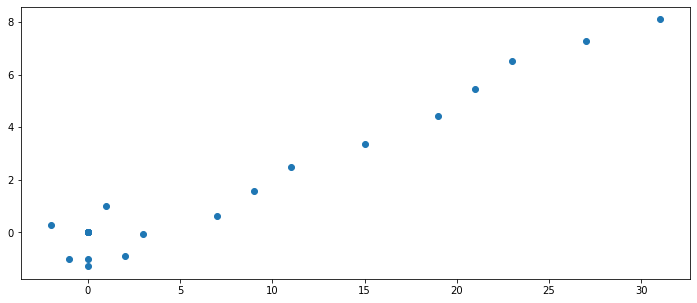

(89, 1)
(89, 1)


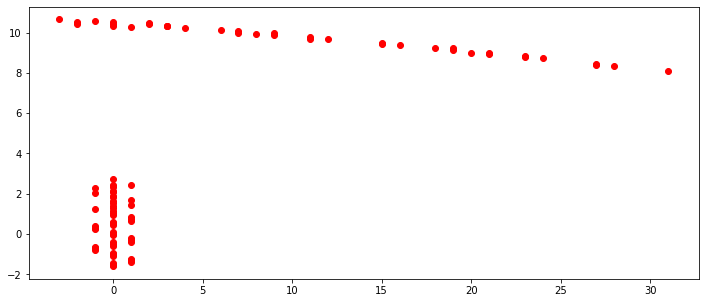

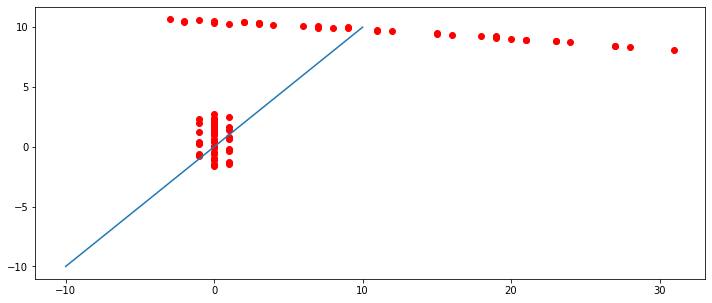

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
141.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  76
Sensor from left wall =  113
Sensor from right wall =  43
most távolsagra van a felső faltól =  19.0
most távolsagra van az alsó faltól =  81.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccc

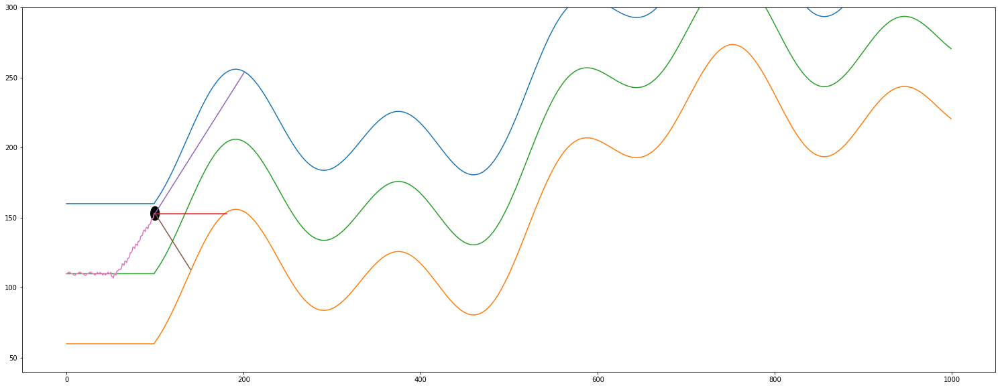

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  100
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[102  82  41]]
actual predicted =  [[10.08069094]]
actual self.y_distance[-1] =  41.818148516678605
len(self.y_distance_real)      =  27
len(self.y_distance_predicted) =  27


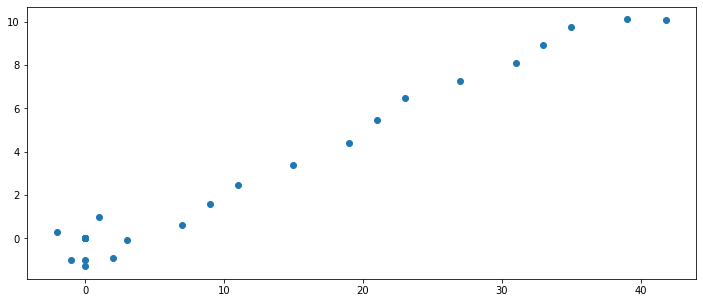

(101, 1)
(101, 1)


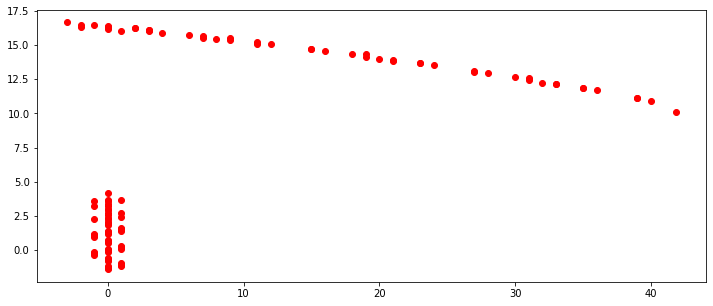

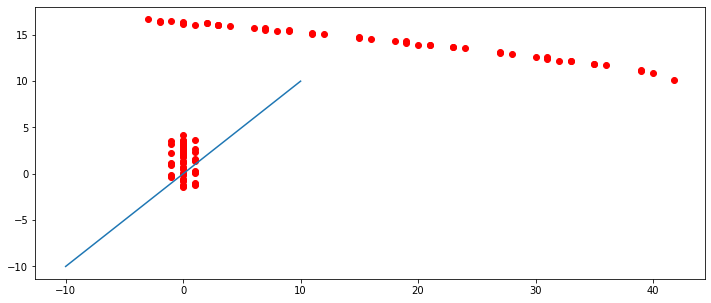

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
153.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  81
Sensor from left wall =  101
Sensor from right wall =  41
most távolsagra van a felső faltól =  9.073810289961955
most távolsagra van az alsó faltól =  90.92618971003806
cccccccccccccccccccccccccccccc

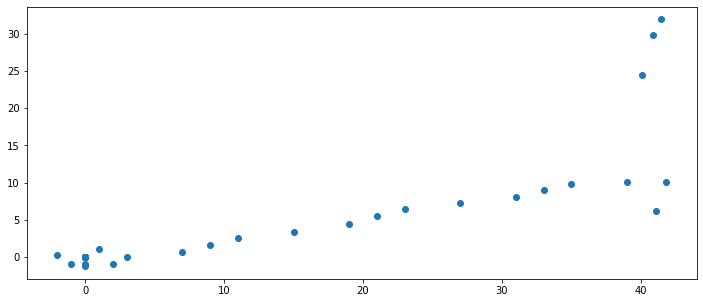

(113, 1)
(113, 1)


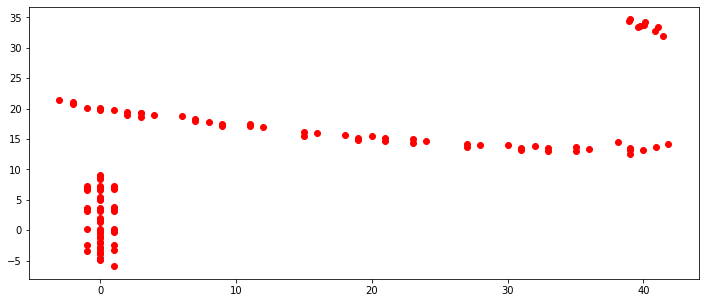

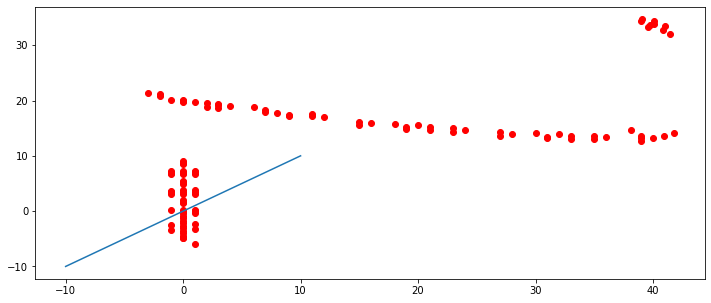

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
165.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  89
Sensor from right wall =  39
most távolsagra van a felső faltól =  9.728924091668205
most távolsagra van az alsó faltól =  90.2710759083318
cccccccccccccccccccccccccccccccccccccccccccccccccccc

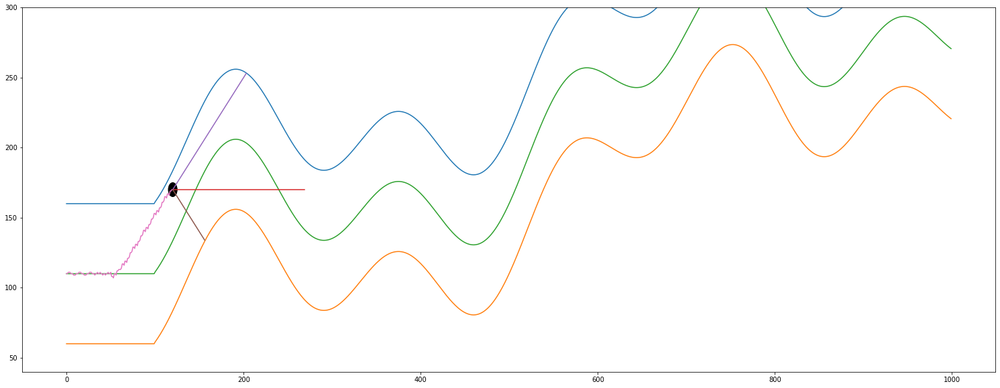

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  120
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (121, 3)
y.shape =  (121, 1)
i       =  120
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  120
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.90362832 -3.29608849]]
		 regression_left.intercept_ =  [6.45927899]
		 ------------------------------- valyon mennyire jó 

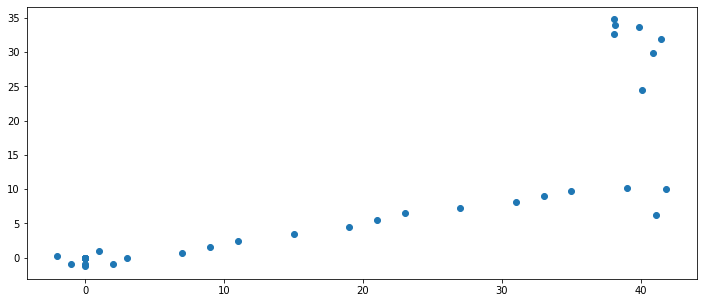

(125, 1)
(125, 1)


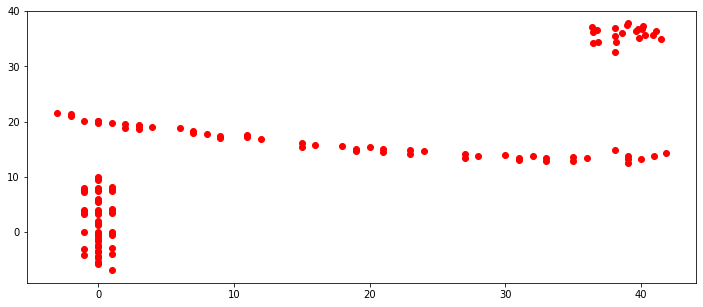

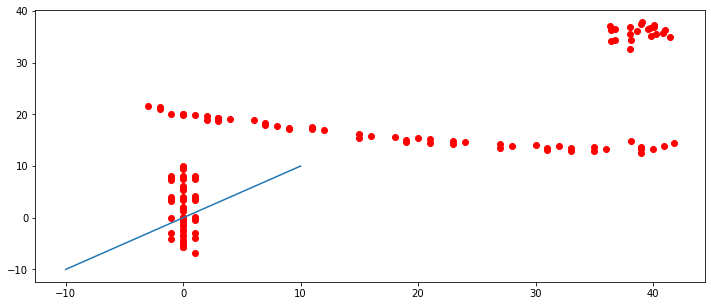

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
177.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  77
Sensor from right wall =  38
most távolsagra van a felső faltól =  13.302711336892486
most távolsagra van az alsó faltól =  86.69728866310751
cccccccccccccccccccccccccccccccccccccccccccccccccc

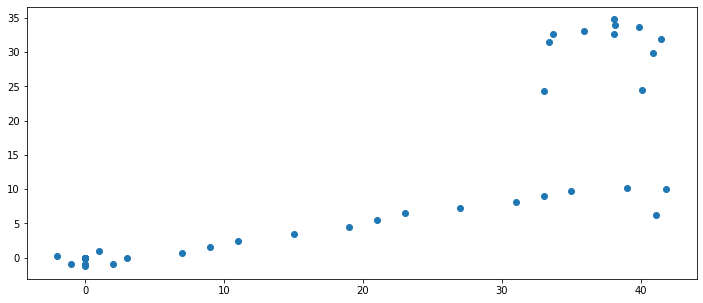

(137, 1)
(137, 1)


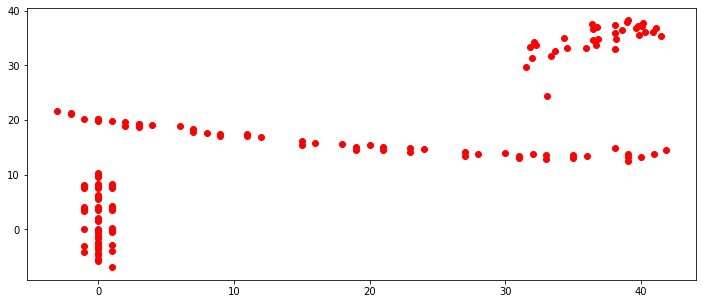

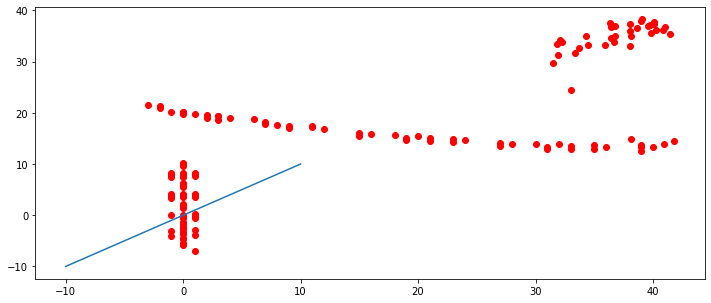

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
189.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  136
Sensor from left wall =  65
Sensor from right wall =  39
most távolsagra van a felső faltól =  18.376603527633222
most távolsagra van az alsó faltól =  81.62339647236678
ccccccccccccccccccccccccccccc

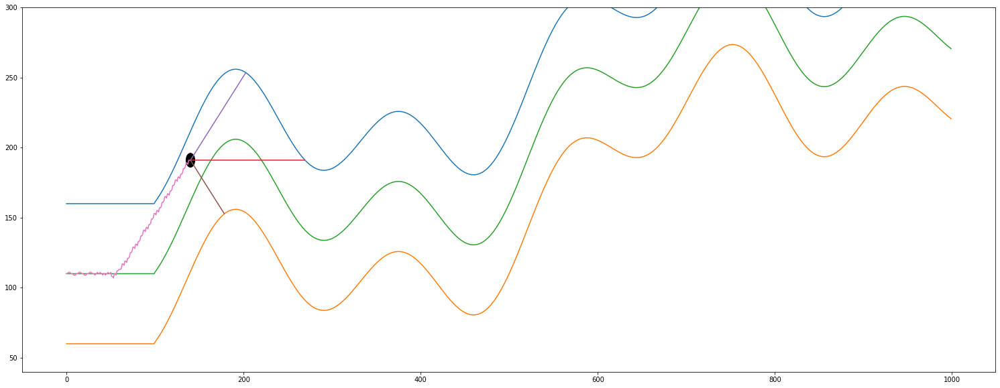

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  140
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  132
Sensor from left wall =  64
Sensor from right wall =  39
most távolsagra van a felső faltól =  21.673937826949754
most távolsagra van az alsó faltól =  78.32606217305025
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  140
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  28.326062173050246
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  28.326062173050246
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  141
			 len(self.sensor_left)   =  141
			 len(self.sensor_center) =  14

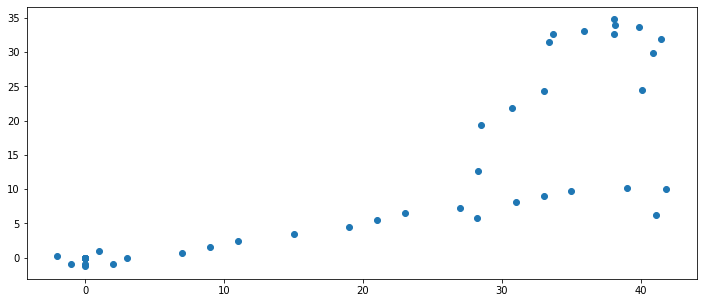

(149, 1)
(149, 1)


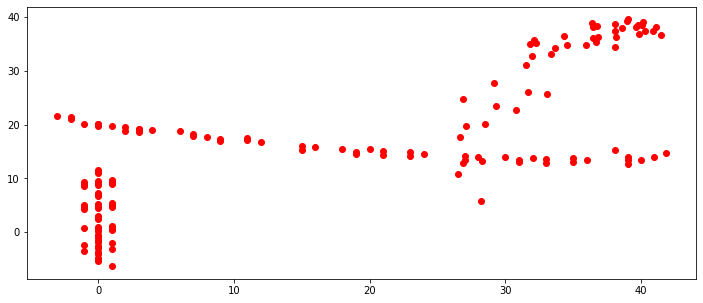

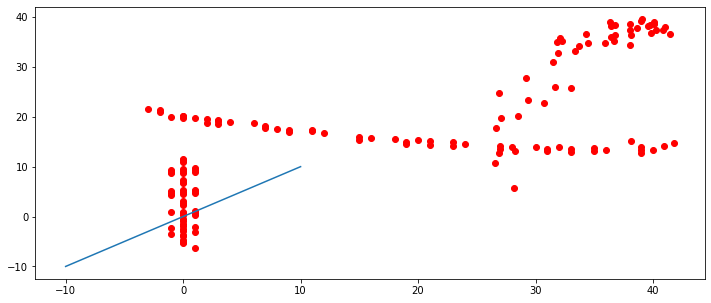

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
201.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  109
Sensor from left wall =  53
Sensor from right wall =  47
most távolsagra van a felső faltól =  23.15979071109382
most távolsagra van az alsó faltól =  76.84020928890618
cccccccccccccccccccccccccccccc

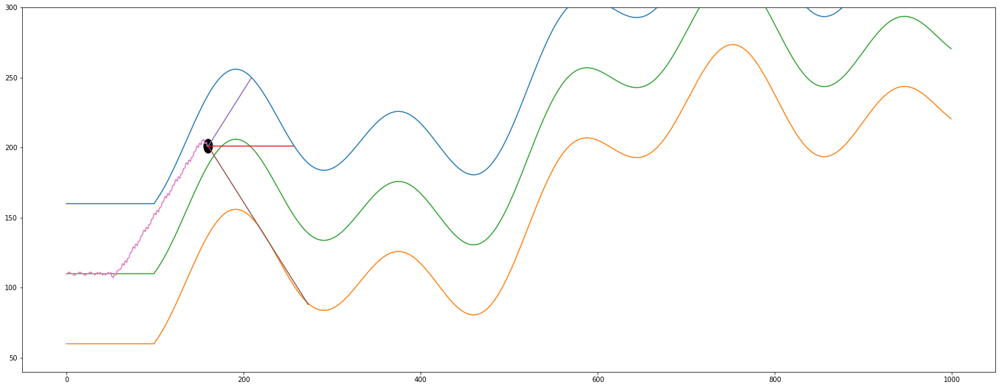

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  160
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50  98 114]]
actual predicted =  [[-12.30931004]]
actual self.y_distance[-1] =  13.321952441913226
len(self.y_distance_real)      =  47
len(self.y_distance_predicted) =  47


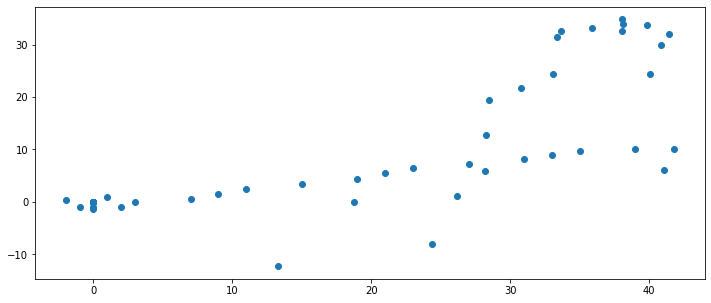

(161, 1)
(161, 1)


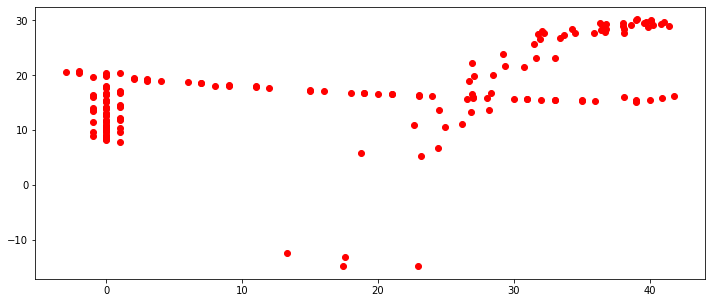

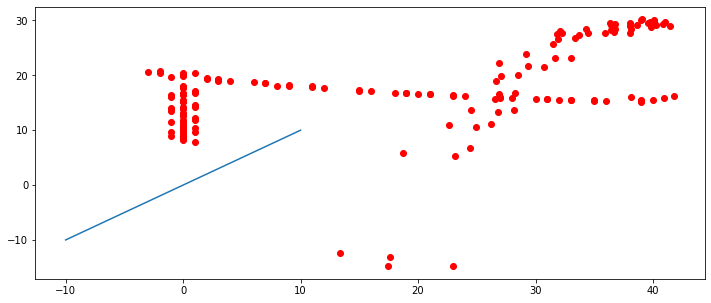

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
201.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  97
Sensor from left wall =  49
Sensor from right wall =  115
most távolsagra van a felső faltól =  37.76902782313368
most távolsagra van az alsó faltól =  62.23097217686632
cccccccccccccccccccccccccccccc

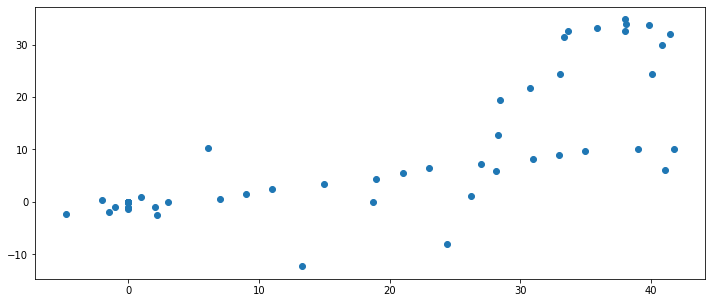

(173, 1)
(173, 1)


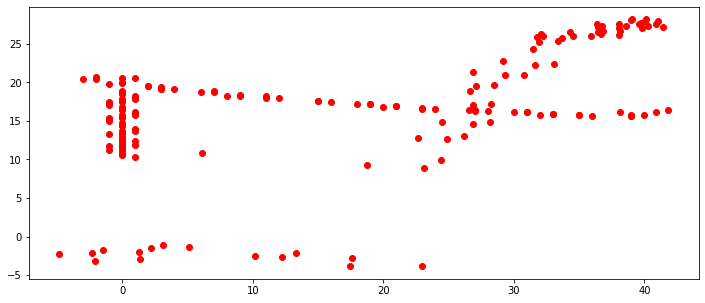

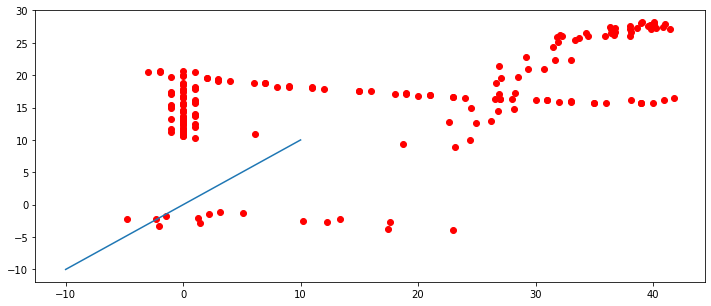

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
194.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  93
Sensor from left wall =  48
Sensor from right wall =  111
most távolsagra van a felső faltól =  55.525302359199316
most távolsagra van az alsó faltól =  44.474697640800684
cccccccccccccccccccccccccccc

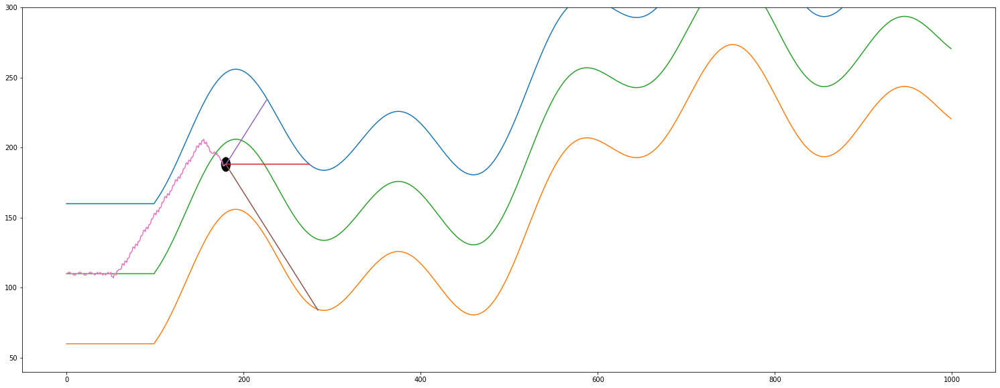

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  180
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (181, 3)
y.shape =  (181, 1)
i       =  180
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  180
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.91238941 -2.45705016]]
		 regression_left.intercept_ =  [5.47344888]
		 ------------------------------- valyon mennyire jó 

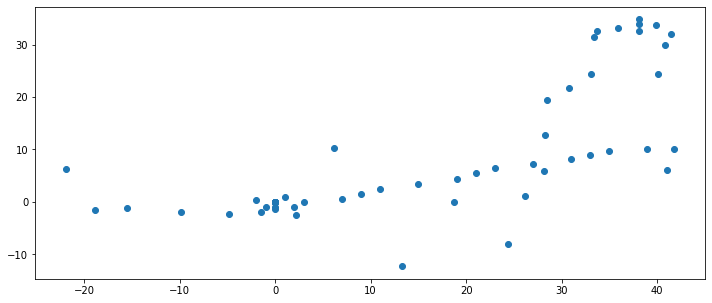

(185, 1)
(185, 1)


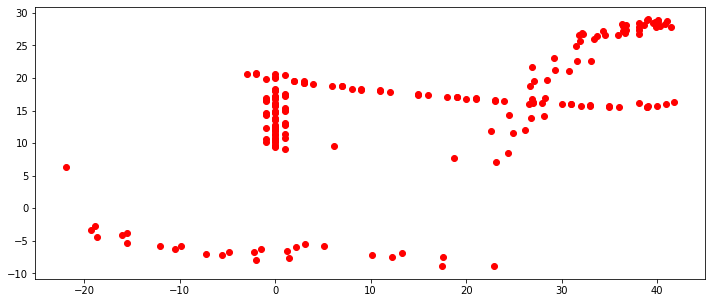

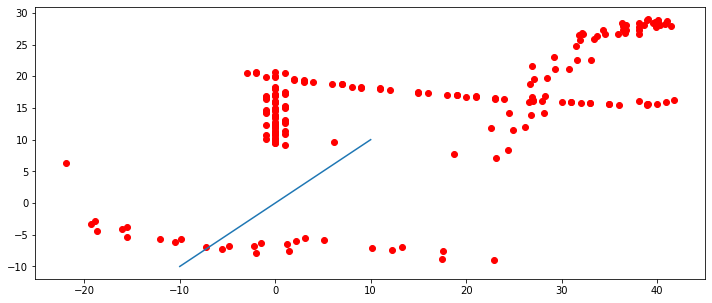

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
183.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  47
Sensor from right wall =  100
most távolsagra van a felső faltól =  72.22052499225327
most távolsagra van az alsó faltól =  27.779475007746726
ccccccccccccccccccccccccccccccccccccccccccccccccc

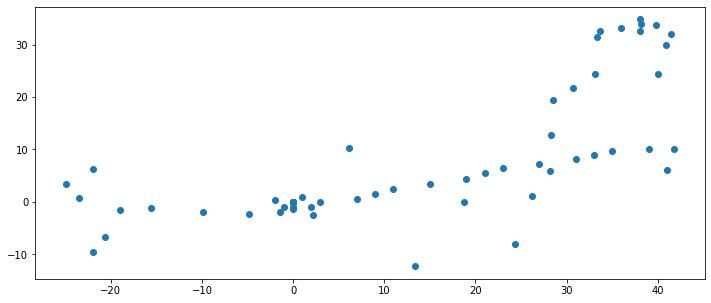

(197, 1)
(197, 1)


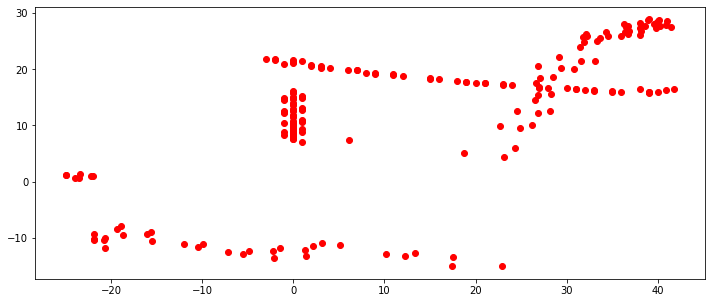

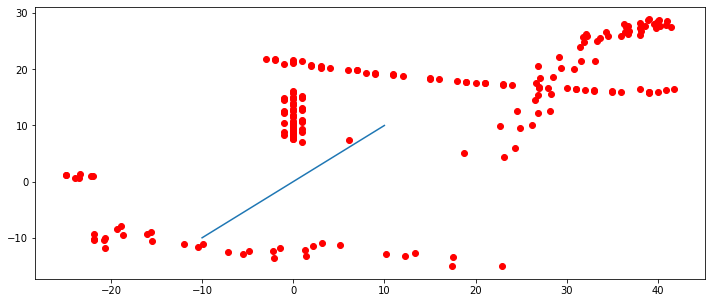

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
182.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  41
Sensor from right wall =  99
most távolsagra van a felső faltól =  73.312098126635
most távolsagra van az alsó faltól =  26.687901873365007
cccccccccccccccccccccccccccccccccccccccccccccccccccc

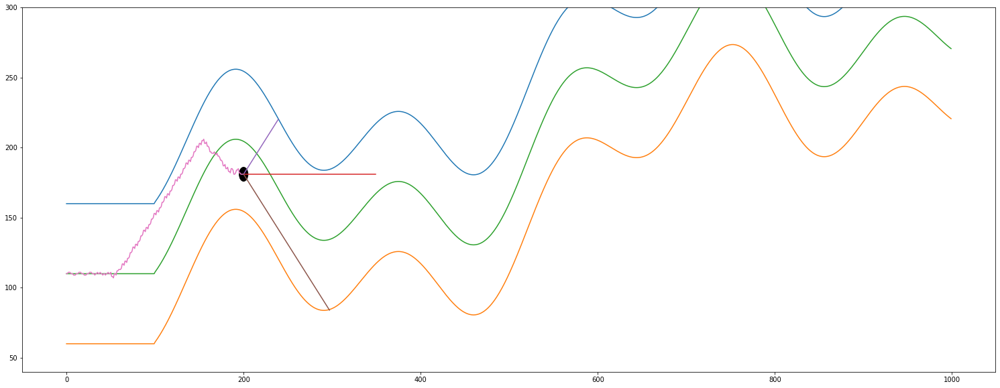

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  200
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  40
Sensor from right wall =  97
most távolsagra van a felső faltól =  74.46779997358041
most távolsagra van az alsó faltól =  25.532200026419588
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  200
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -24.467799973580412
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -24.467799973580412
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  201
			 len(self.sensor_left)   =  201
			 len(self.sensor_center) =  201
			 len(self.sens

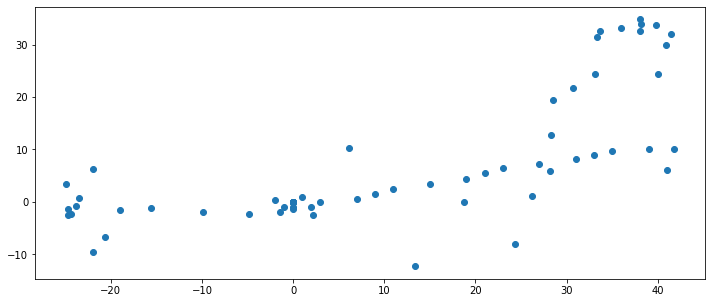

(209, 1)
(209, 1)


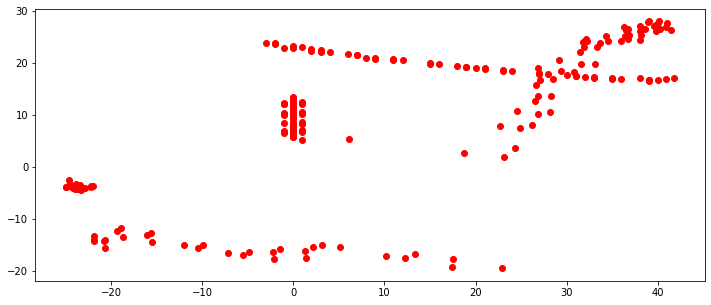

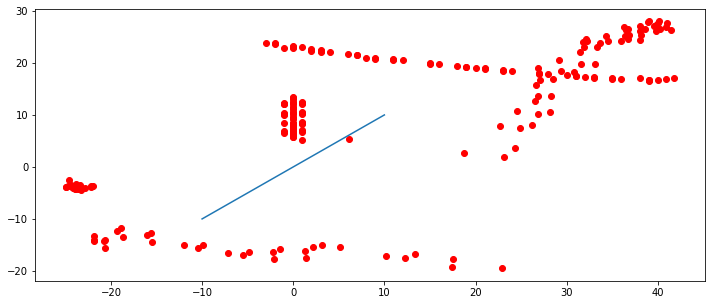

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
176.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  37
Sensor from right wall =  92
most távolsagra van a felső faltól =  74.01456528690949
most távolsagra van az alsó faltól =  25.985434713090513
cccccccccccccccccccccccccccccccccccccccccccccccccc

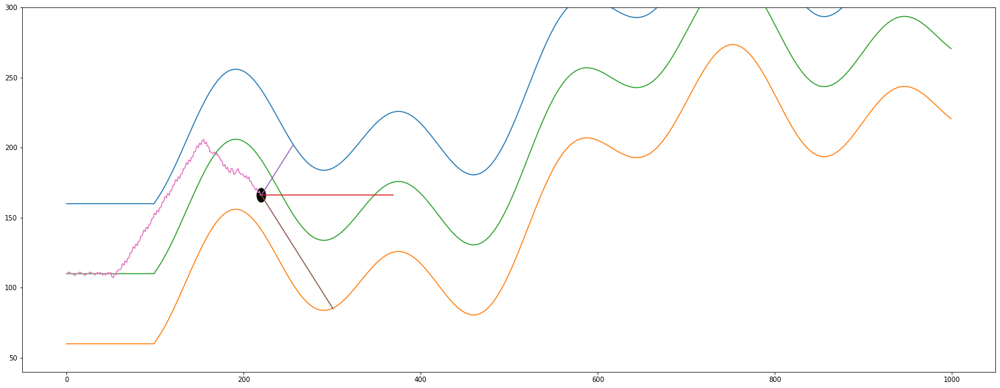

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  220
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 37 150  82]]
actual predicted =  [[-2.69416564]]
actual self.y_distance[-1] =  -25.220795088905504
len(self.y_distance_real)      =  67
len(self.y_distance_predicted) =  67


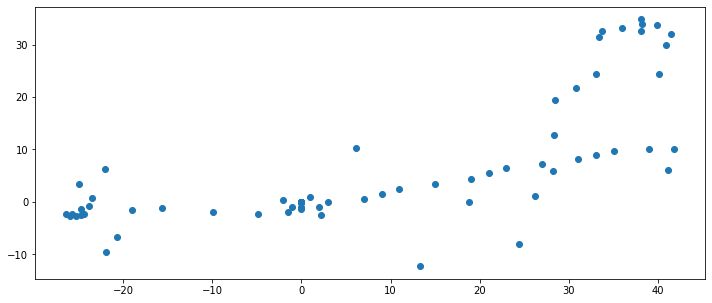

(221, 1)
(221, 1)


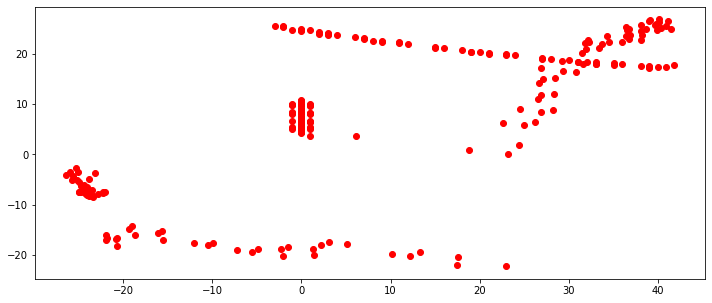

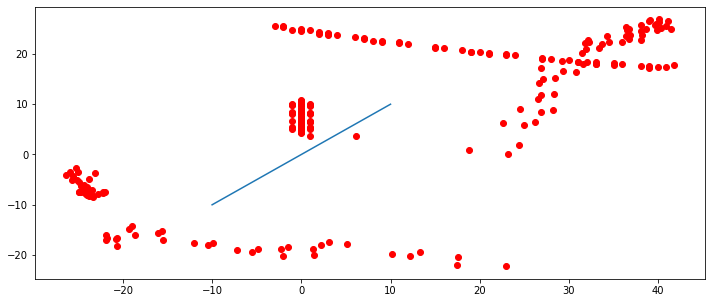

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
166.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  36
Sensor from right wall =  82
most távolsagra van a felső faltól =  74.27375578672863
most távolsagra van az alsó faltól =  25.72624421327137
ccccccccccccccccccccccccccccccccccccccccccccccccccc

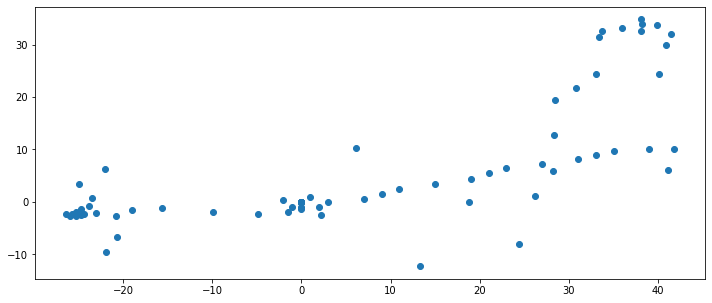

(233, 1)
(233, 1)


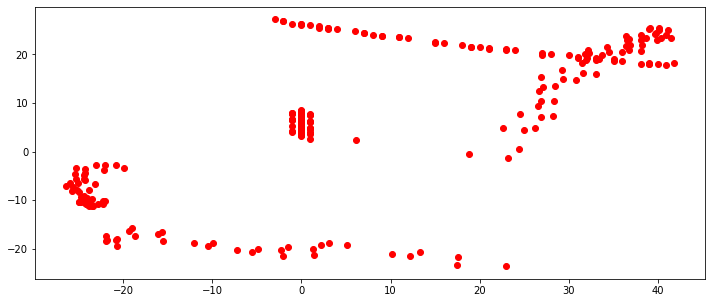

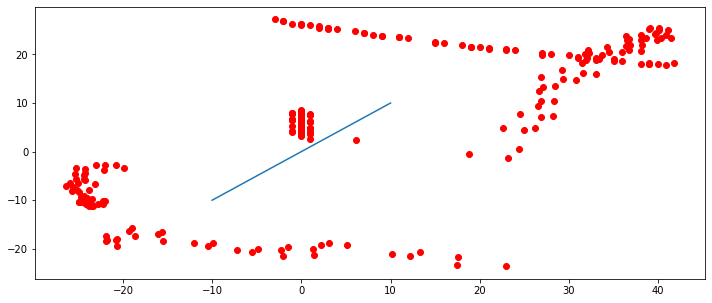

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
158.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  35
Sensor from right wall =  73
most távolsagra van a felső faltól =  69.62735551254764
most távolsagra van az alsó faltól =  30.372644487452348
cccccccccccccccccccccccccccccccccccccccccccccccccc

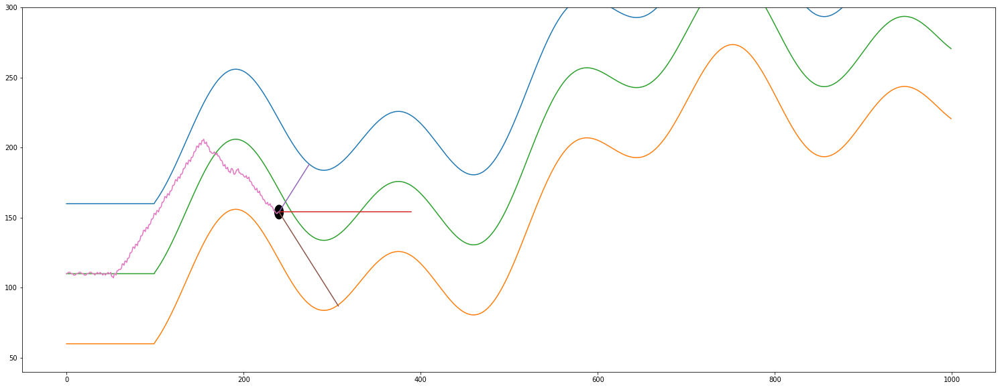

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  240
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (241, 3)
y.shape =  (241, 1)
i       =  240
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  240
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.92570692 -1.99114074]]
		 regression_left.intercept_ =  [4.0315153]
		 ------------------------------- valyon mennyire jó e

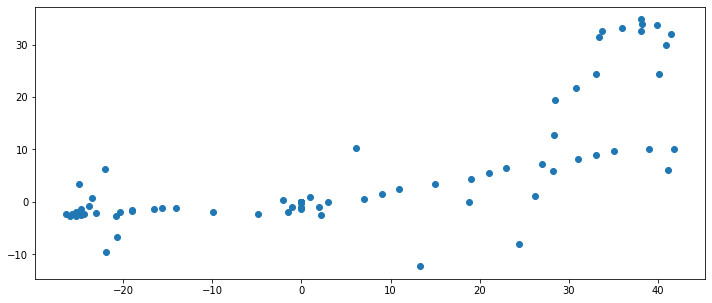

(245, 1)
(245, 1)


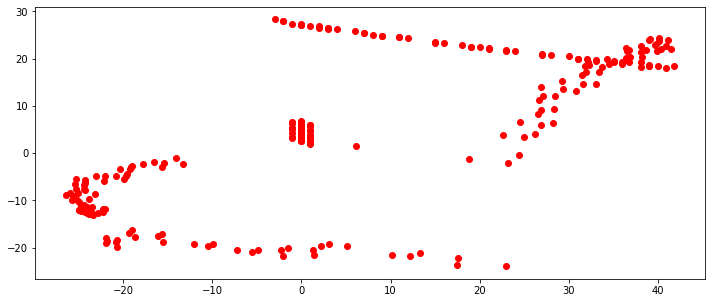

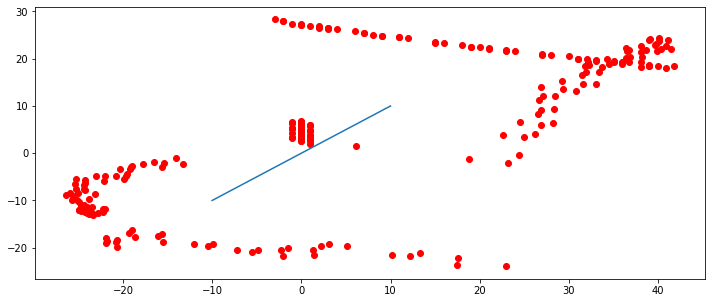

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
151.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  35
Sensor from right wall =  64
most távolsagra van a felső faltól =  62.97373317698907
most távolsagra van az alsó faltól =  37.02626682301093
ccccccccccccccccccccccccccccccccccccccccccccccccccc

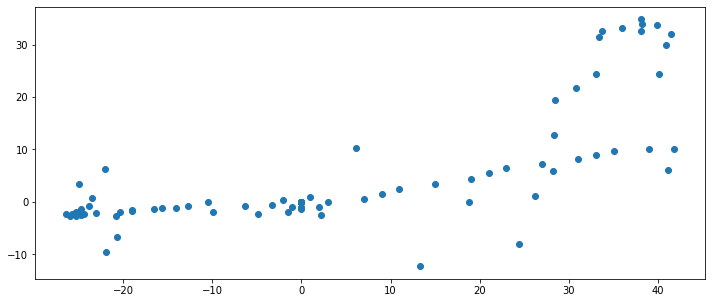

(257, 1)
(257, 1)


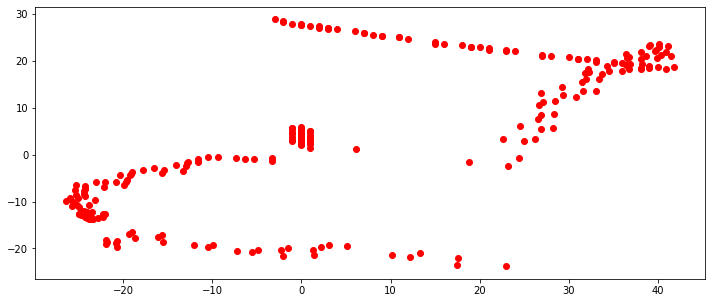

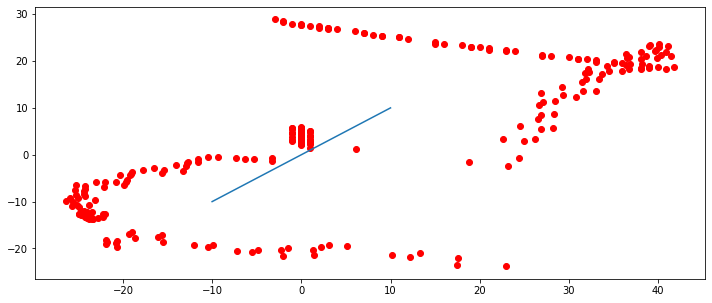

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
149.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  35
Sensor from right wall =  58
most távolsagra van a felső faltól =  52.28530683255414
most távolsagra van az alsó faltól =  47.71469316744586
ccccccccccccccccccccccccccccccccccccccccccccccccccc

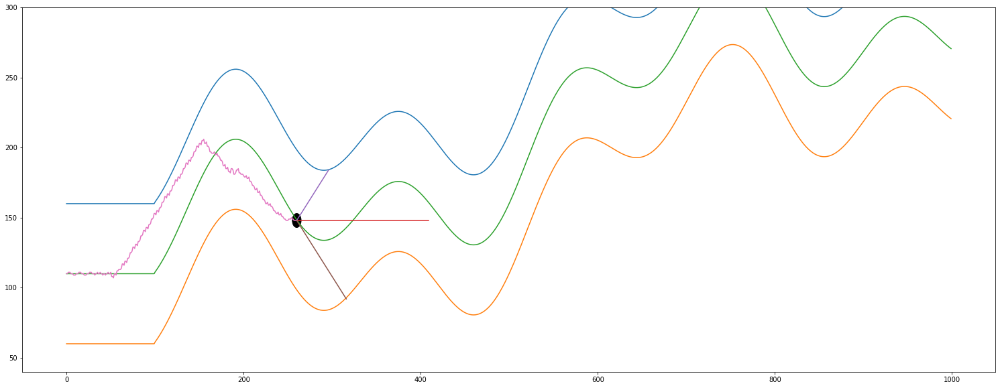

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  260
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  38
Sensor from right wall =  56
most távolsagra van a felső faltól =  51.477907985265404
most távolsagra van az alsó faltól =  48.52209201473461
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  260
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.4779079852654036
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.4779079852654036
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  261
			 len(self.sensor_left)   =  261
			 len(self.sensor_center) =  261
			 len(self.sens

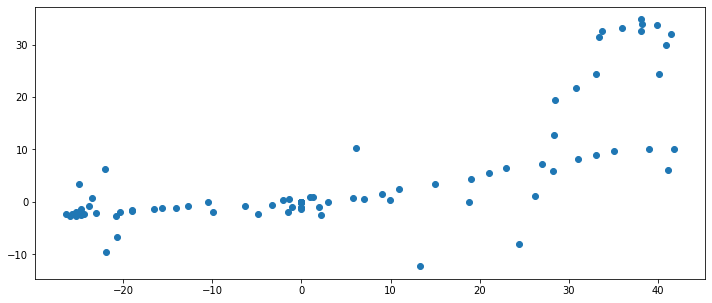

(269, 1)
(269, 1)


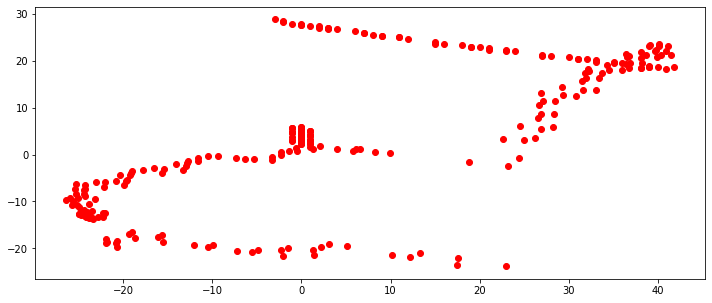

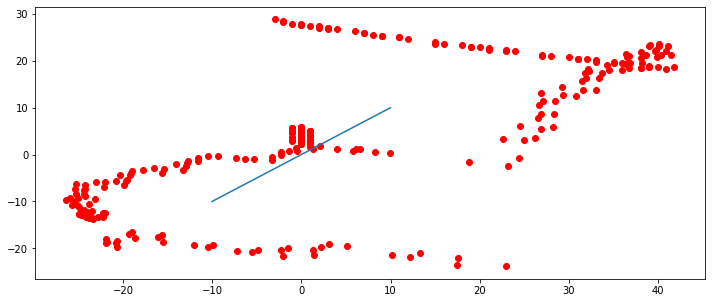

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
152.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  35
Sensor from right wall =  55
most távolsagra van a felső faltól =  39.311466102785914
most távolsagra van az alsó faltól =  60.6885338972141
ccccccccccccccccccccccccccccccccccccccccccccccccccc

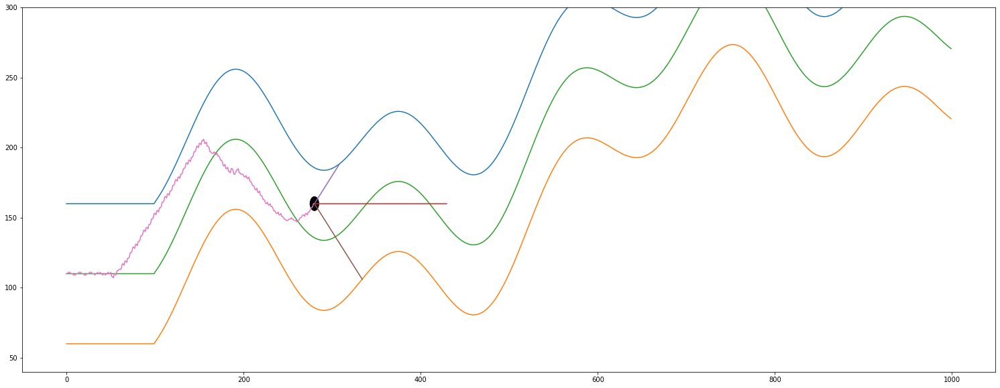

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  280
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 29 150  55]]
actual predicted =  [[0.91556532]]
actual self.y_distance[-1] =  24.354298607475357
len(self.y_distance_real)      =  87
len(self.y_distance_predicted) =  87


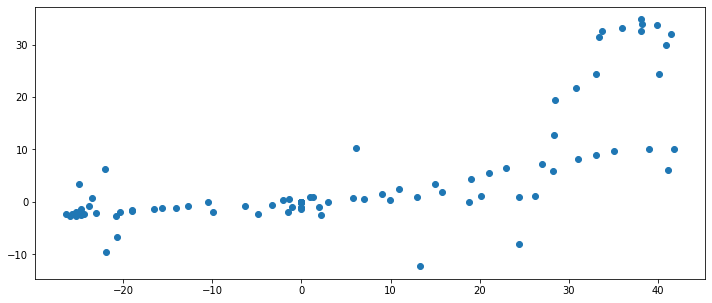

(281, 1)
(281, 1)


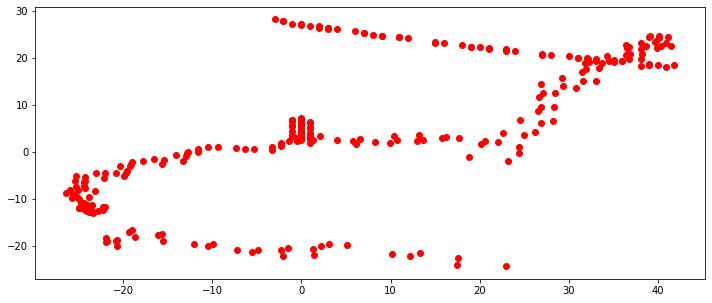

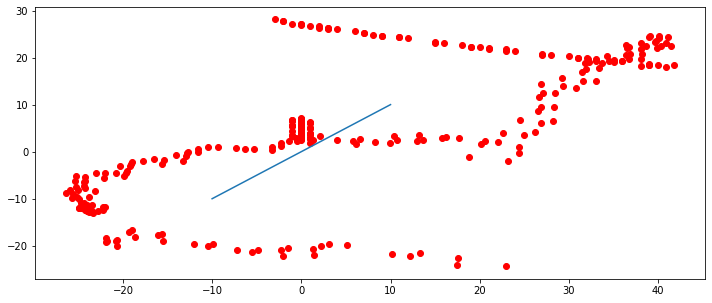

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
160.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  30
Sensor from right wall =  55
most távolsagra van a felső faltól =  25.317693547023623
most távolsagra van az alsó faltól =  74.68230645297638
cccccccccccccccccccccccccccccccccccccccccccccccccc

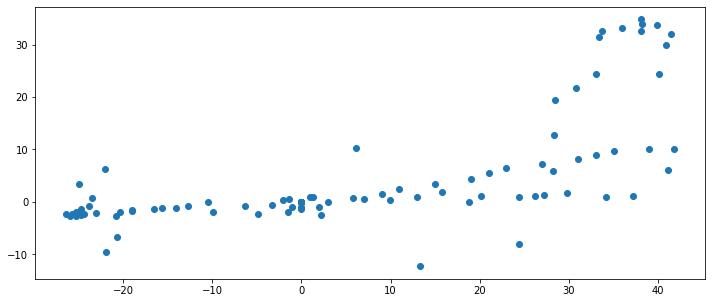

(293, 1)
(293, 1)


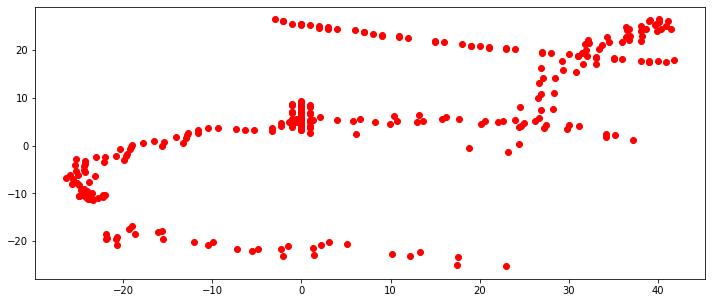

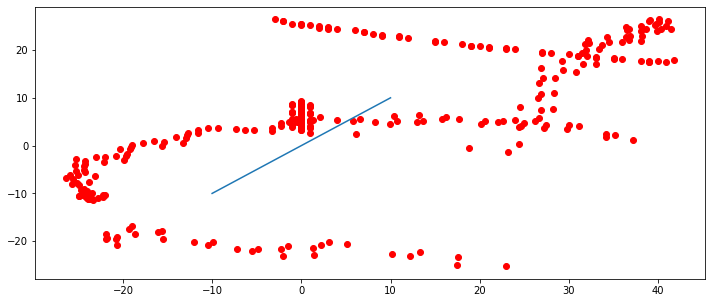

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
171.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  20
Sensor from right wall =  56
most távolsagra van a felső faltól =  12.901797174595004
most távolsagra van az alsó faltól =  87.098202825405
cccccccccccccccccccccccccccccccccccccccccccccccccccc

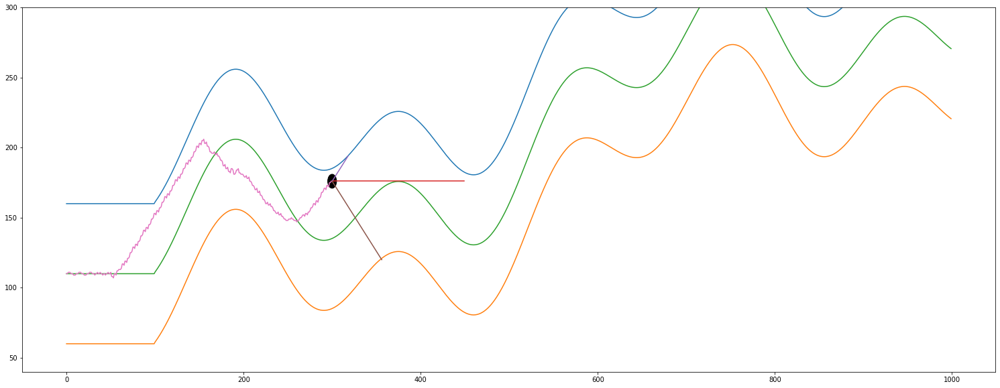

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  300
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (301, 3)
y.shape =  (301, 1)
i       =  300
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  300
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.93438579 -1.93834731]]
		 regression_left.intercept_ =  [3.16579672]
		 ------------------------------- valyon mennyire jó 

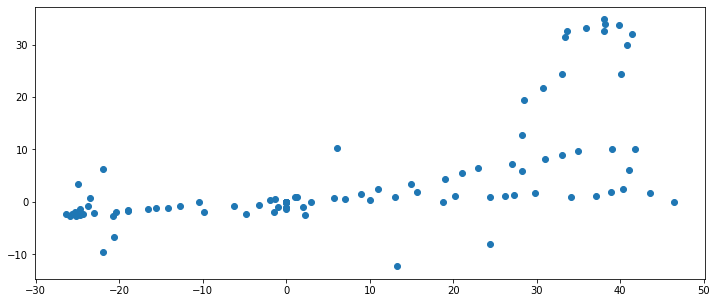

(305, 1)
(305, 1)


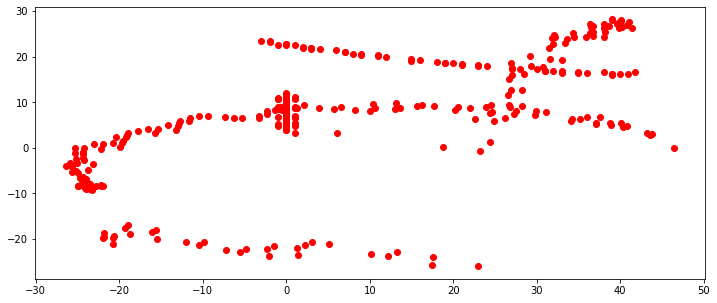

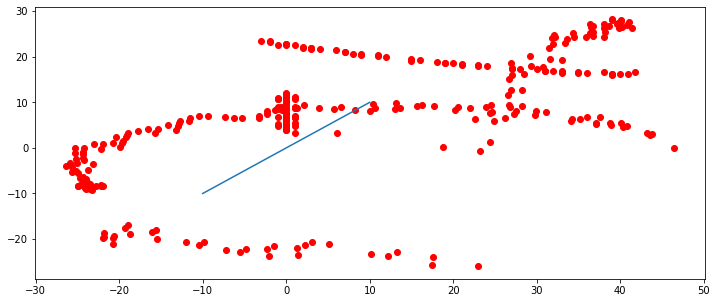

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
183.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  143
Sensor from left wall =  8
Sensor from right wall =  60
most távolsagra van a felső faltól =  3.9159805117797646
most távolsagra van az alsó faltól =  96.08401948822022
cccccccccccccccccccccccccccccc

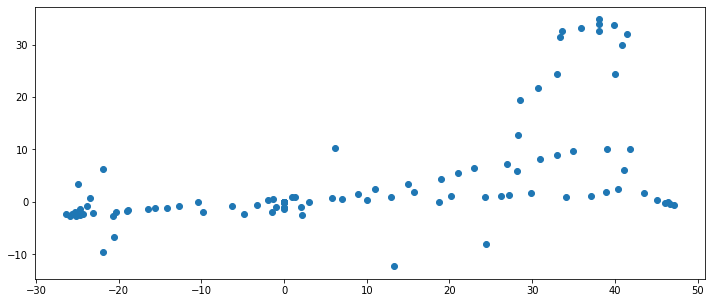

(317, 1)
(317, 1)


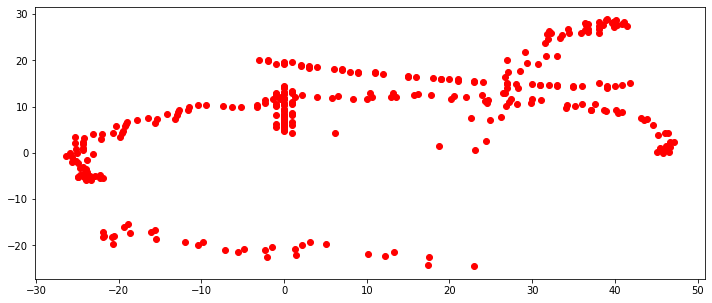

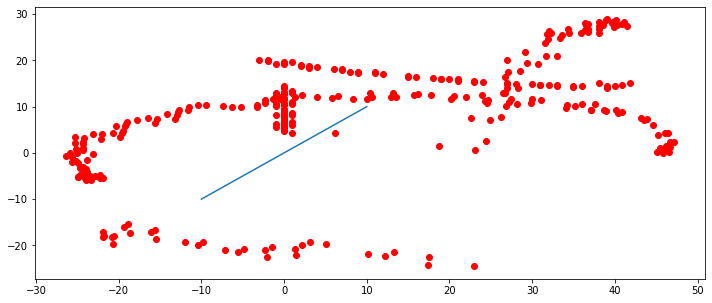

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
188.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  122
Sensor from left wall =  22
Sensor from right wall =  64
most távolsagra van a felső faltól =  5.506760838506125
most távolsagra van az alsó faltól =  94.49323916149386
cccccccccccccccccccccccccccccc

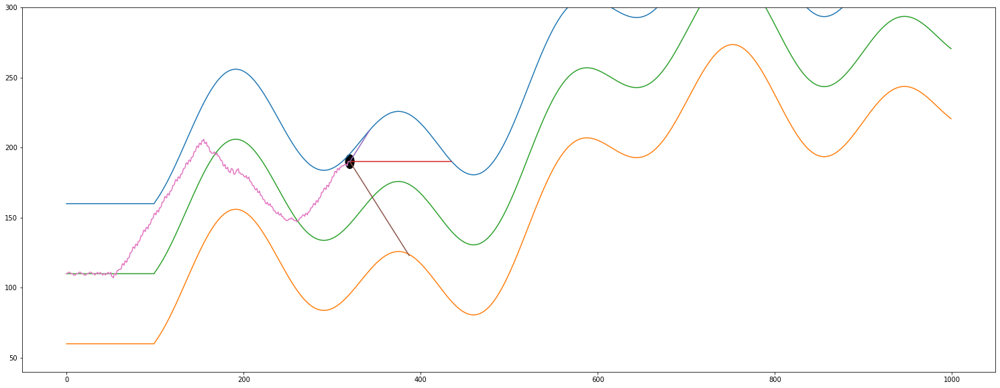

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  320
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  117
Sensor from left wall =  27
Sensor from right wall =  66
most távolsagra van a felső faltól =  6.557356763277397
most távolsagra van az alsó faltól =  93.4426432367226
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  320
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  43.4426432367226
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  43.4426432367226
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  321
			 len(self.sensor_left)   =  321
			 len(self.sensor_center) =  321
			 

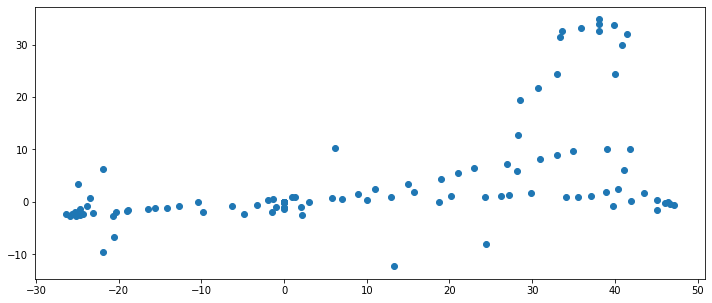

(329, 1)
(329, 1)


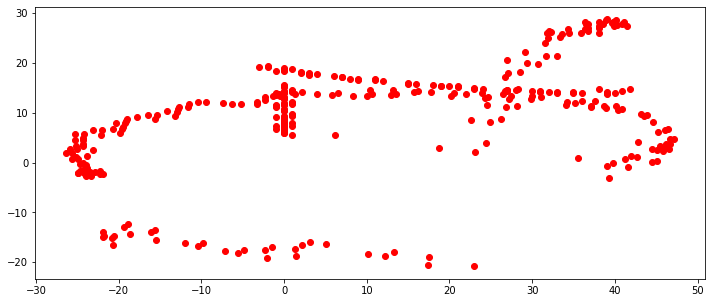

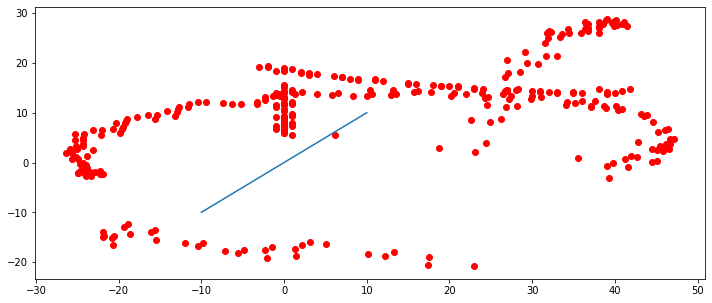

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
187.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  111
Sensor from left wall =  38
Sensor from right wall =  71
most távolsagra van a felső faltól =  15.266139414233294
most távolsagra van az alsó faltól =  84.7338605857667
cccccccccccccccccccccccccccccc

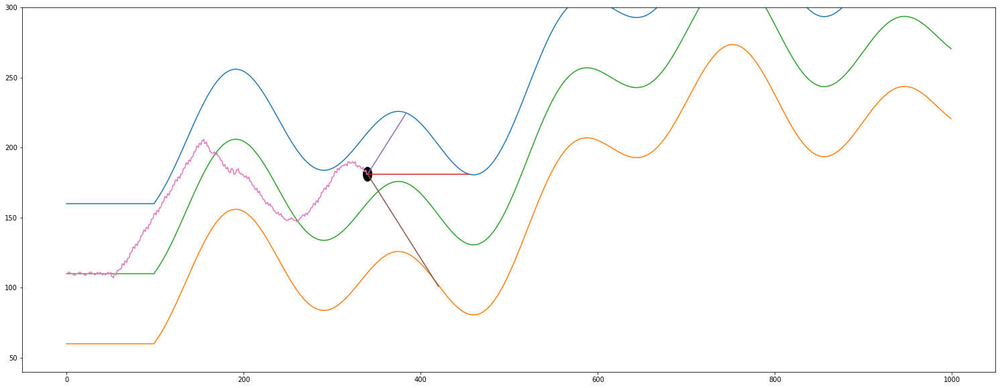

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  340
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 44 115  81]]
actual predicted =  [[-0.19583684]]
actual self.y_distance[-1] =  20.270341568093755
len(self.y_distance_real)      =  107
len(self.y_distance_predicted) =  107


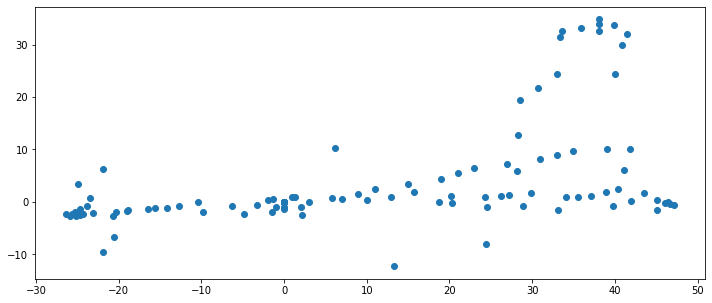

(341, 1)
(341, 1)


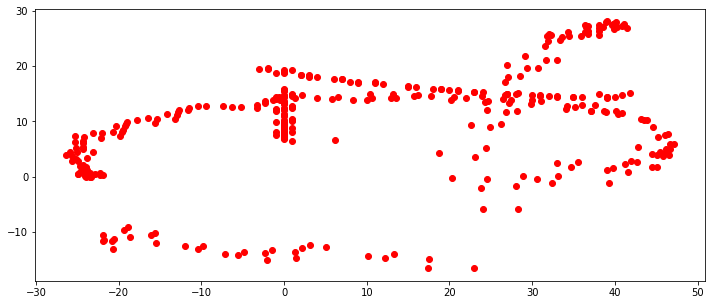

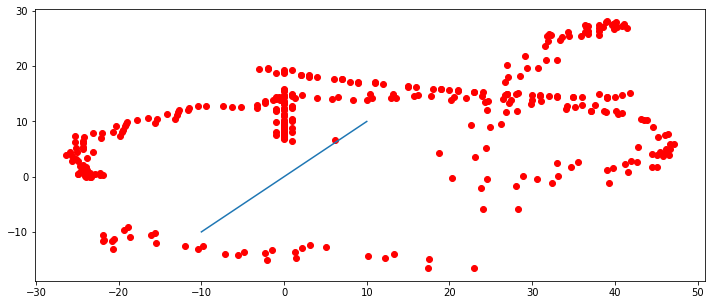

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  114
Sensor from left wall =  44
Sensor from right wall =  86
most távolsagra van a felső faltól =  30.46986732330754
most távolsagra van az alsó faltól =  69.53013267669246
cccccccccccccccccccccccccccccc

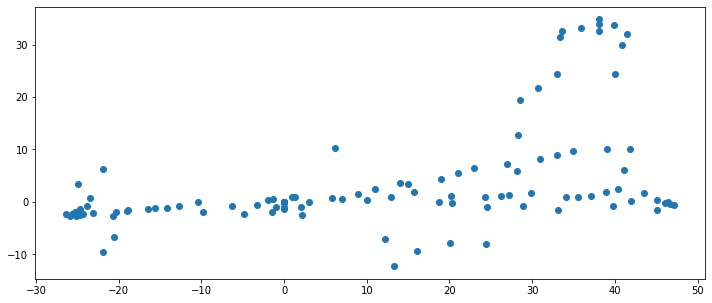

(353, 1)
(353, 1)


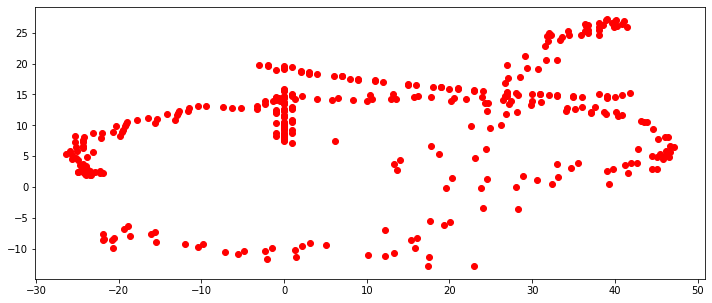

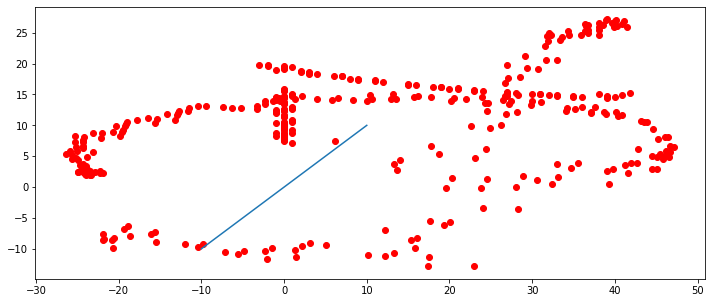

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  102
Sensor from left wall =  41
Sensor from right wall =  101
most távolsagra van a felső faltól =  38.36490927968126
most távolsagra van az alsó faltól =  61.63509072031874
ccccccccccccccccccccccccccccc

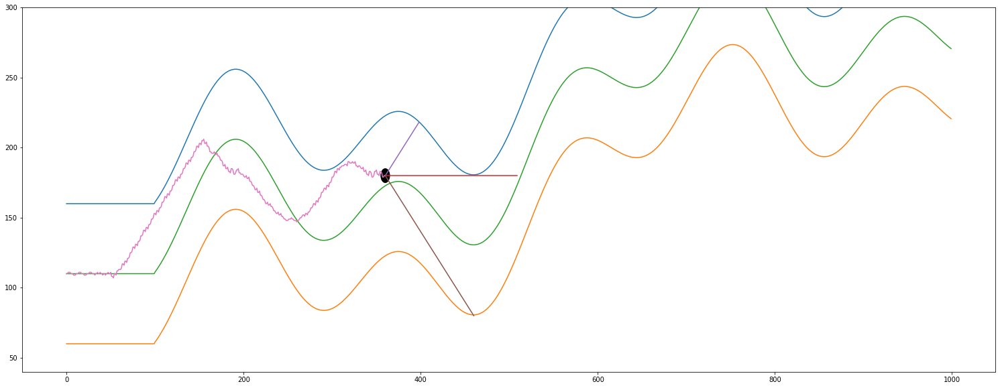

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  360
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (361, 3)
y.shape =  (361, 1)
i       =  360
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  360
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.94001723 -1.93583979]]
		 regression_left.intercept_ =  [2.66318384]
		 ------------------------------- valyon mennyire jó 

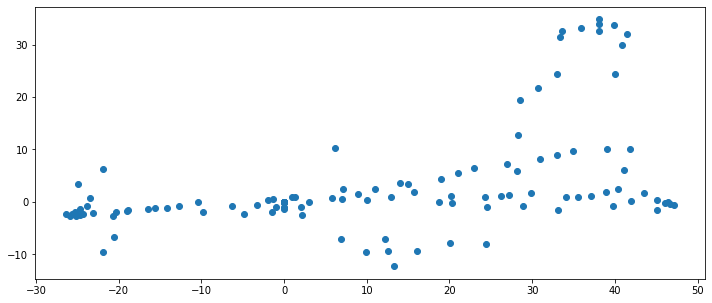

(365, 1)
(365, 1)


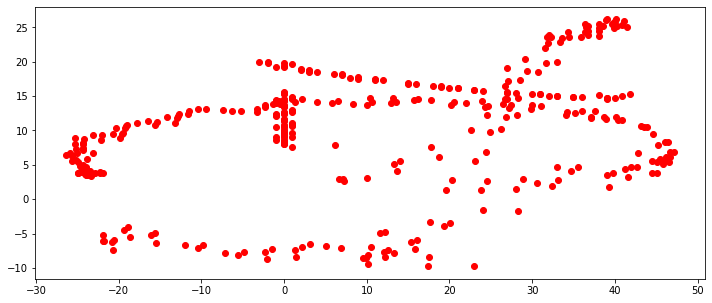

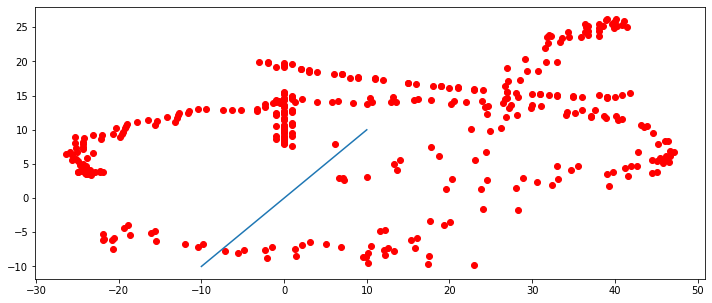

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  90
Sensor from left wall =  36
Sensor from right wall =  101
most távolsagra van a felső faltól =  43.46045461835135
most távolsagra van az alsó faltól =  56.53954538164865
cccccccccccccccccccccccccccccc

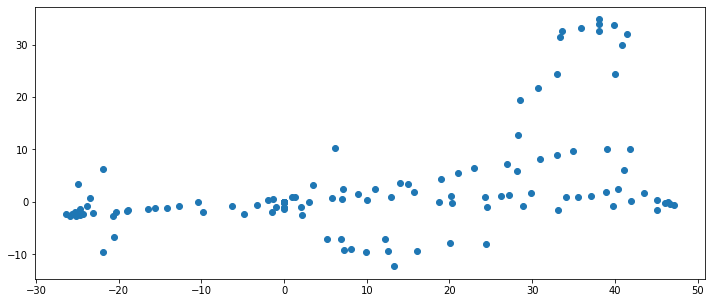

(377, 1)
(377, 1)


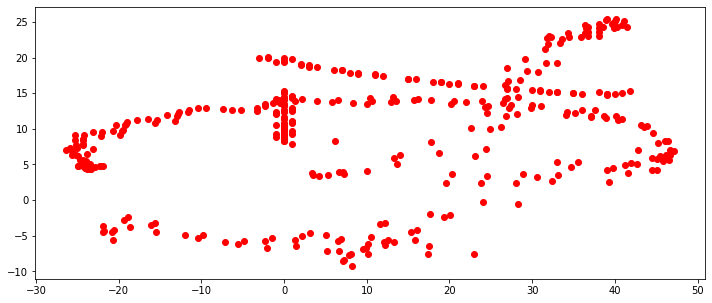

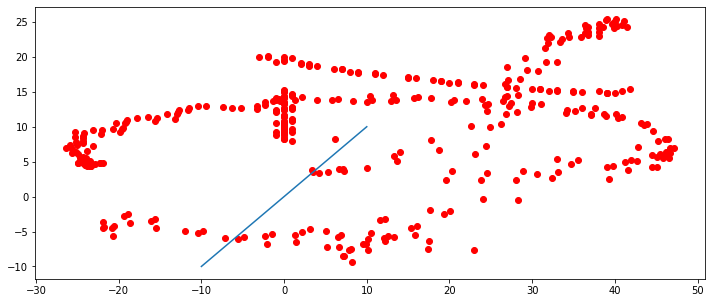

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  78
Sensor from left wall =  31
Sensor from right wall =  98
most távolsagra van a felső faltól =  44.776283555498765
most távolsagra van az alsó faltól =  55.223716444501235
ccccccccccccccccccccccccccccc

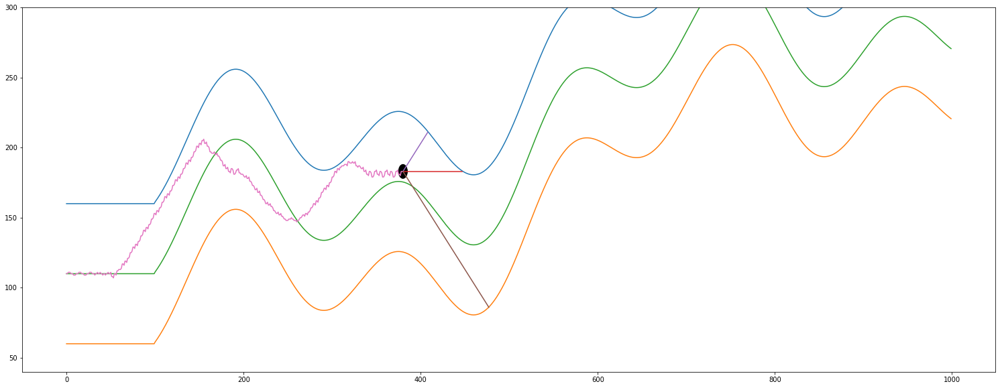

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  380
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  71
Sensor from left wall =  29
Sensor from right wall =  97
most távolsagra van a felső faltól =  43.46292259886536
most távolsagra van az alsó faltól =  56.53707740113464
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  380
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  6.537077401134638
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  6.537077401134638
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  381
			 len(self.sensor_left)   =  381
			 len(self.sensor_center) =  381
		

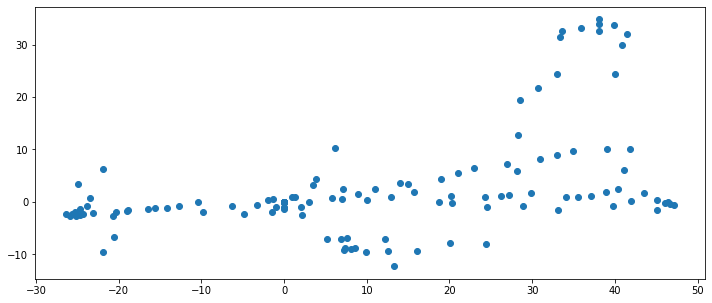

(389, 1)
(389, 1)


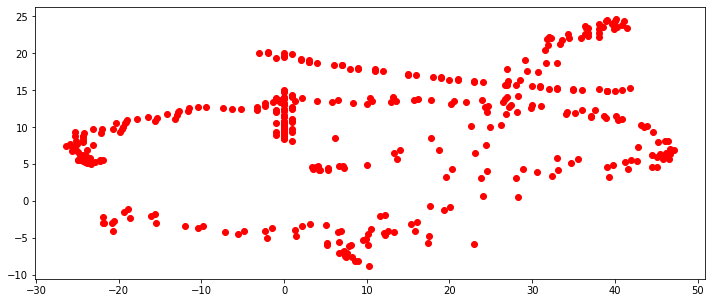

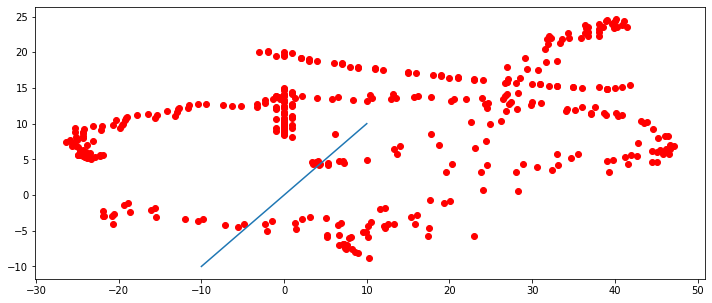

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  66
Sensor from left wall =  26
Sensor from right wall =  93
most távolsagra van a felső faltól =  42.0090527157557
most távolsagra van az alsó faltól =  57.9909472842443
ccccccccccccccccccccccccccccccccc

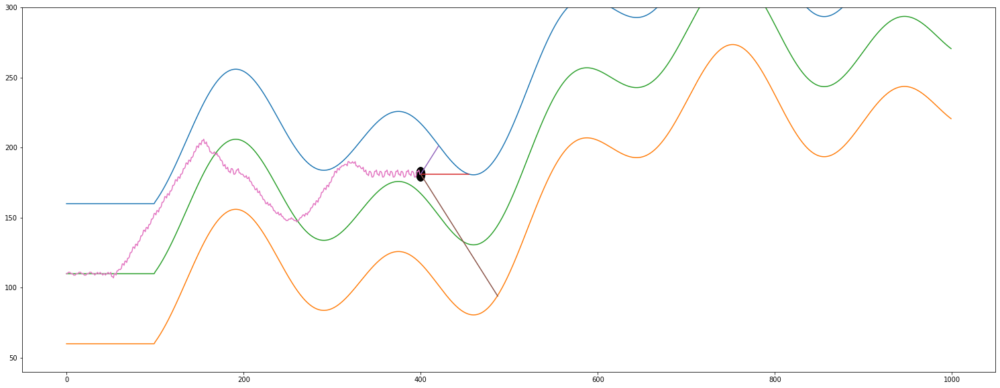

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  400
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[21 55 88]]
actual predicted =  [[-6.38663412]]
actual self.y_distance[-1] =  13.758602736024898
len(self.y_distance_real)      =  127
len(self.y_distance_predicted) =  127


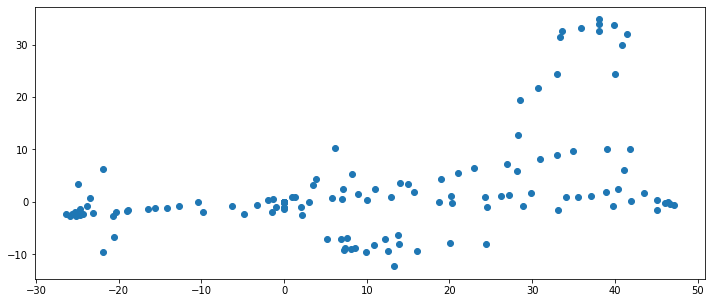

(401, 1)
(401, 1)


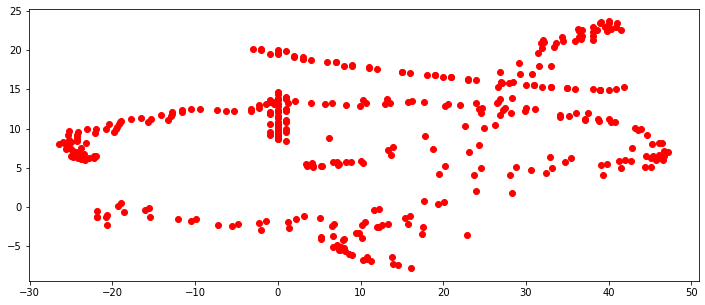

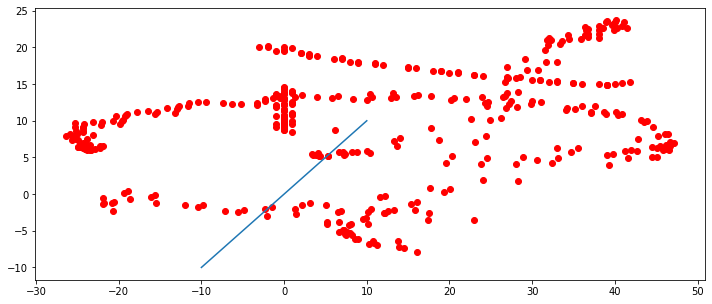

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  54
Sensor from left wall =  21
Sensor from right wall =  87
most távolsagra van a felső faltól =  35.59004987479568
most távolsagra van az alsó faltól =  64.40995012520432
ccccccccccccccccccccccccccccccc

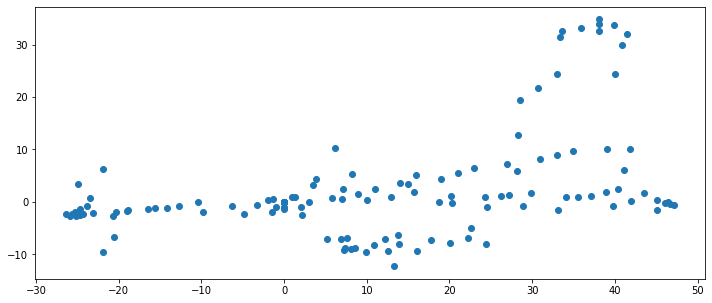

(413, 1)
(413, 1)


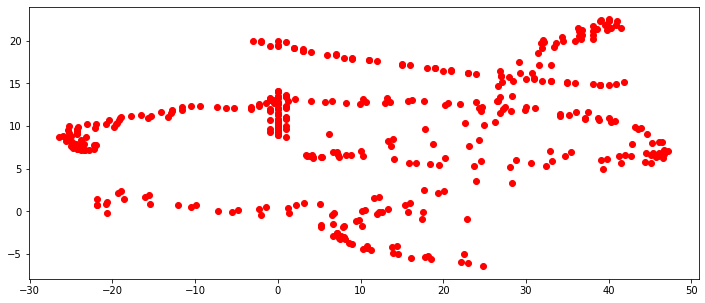

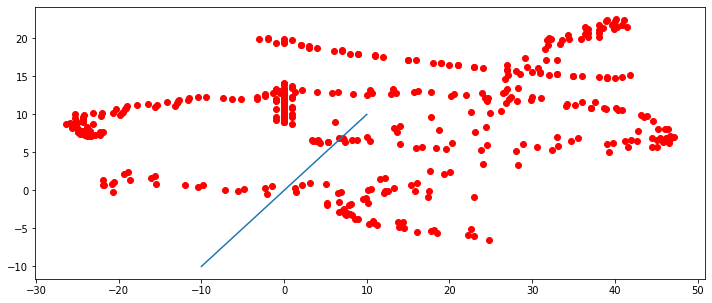

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  42
Sensor from left wall =  15
Sensor from right wall =  81
most távolsagra van a felső faltól =  26.625133164679823
most távolsagra van az alsó faltól =  73.37486683532018
cccccccccccccccccccccccccccccc

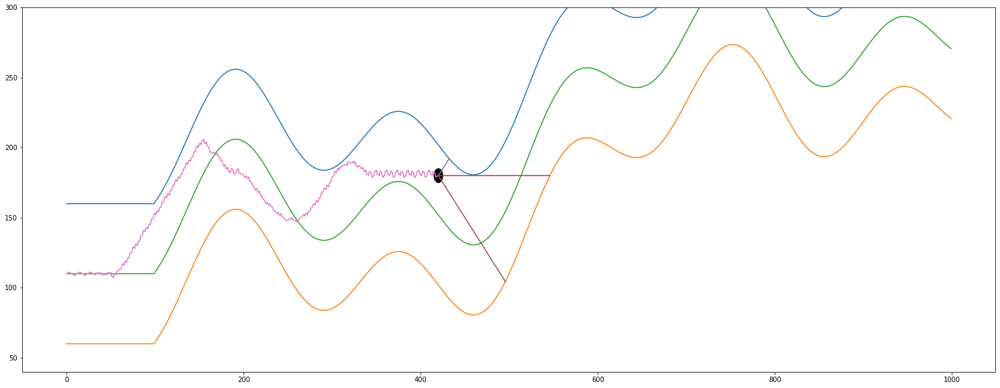

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  420
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (421, 3)
y.shape =  (421, 1)
i       =  420
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  420
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.94456954 -1.73020341]]
		 regression_left.intercept_ =  [2.25693175]
		 ------------------------------- valyon mennyire jó 

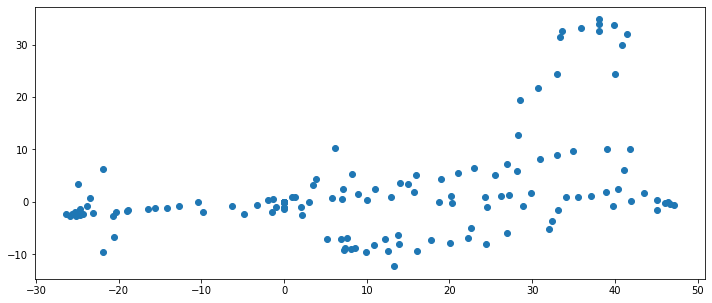

(425, 1)
(425, 1)


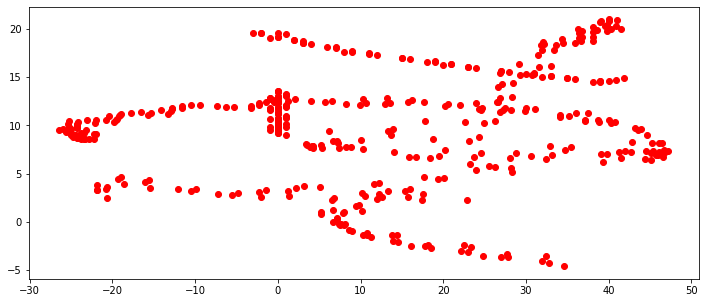

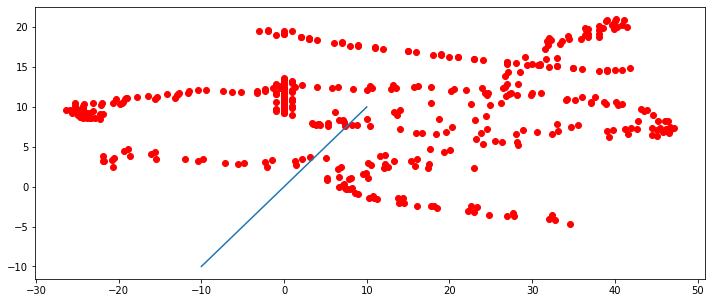

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  30
Sensor from left wall =  10
Sensor from right wall =  74
most távolsagra van a felső faltól =  16.72620406542933
most távolsagra van az alsó faltól =  83.27379593457069
ccccccccccccccccccccccccccccccc

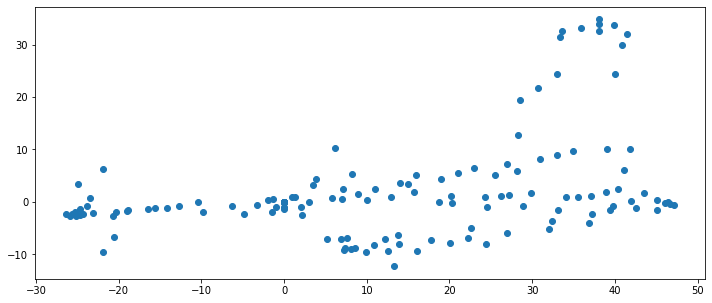

(437, 1)
(437, 1)


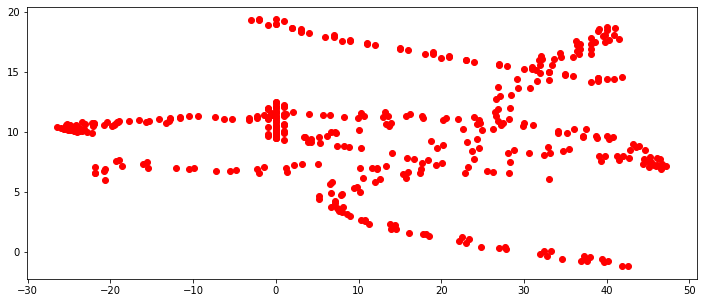

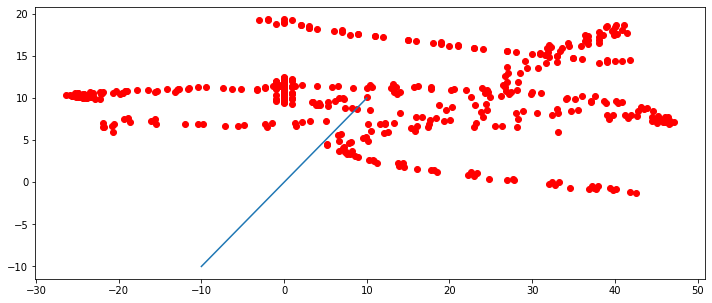

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
182.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  14
Sensor from left wall =  5
Sensor from right wall =  68
most távolsagra van a felső faltól =  6.760723847278115
most távolsagra van az alsó faltól =  93.23927615272189
cccccccccccccccccccccccccccccccc

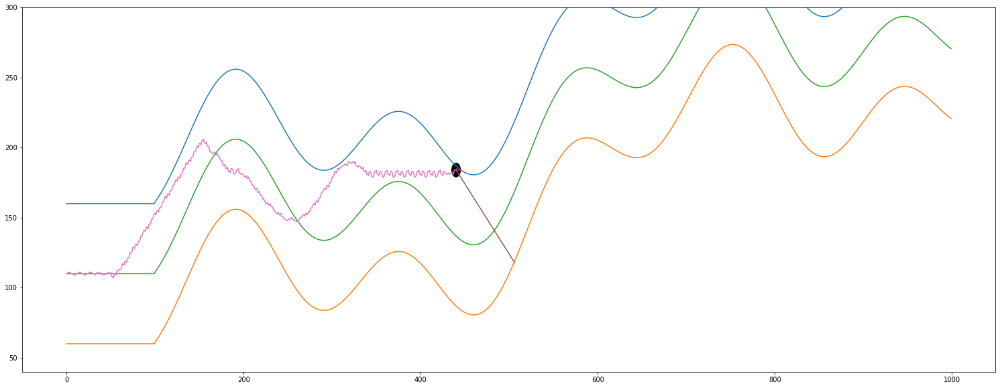

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  440
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  8
Sensor from left wall =  3
Sensor from right wall =  66
most távolsagra van a felső faltól =  3.8847536385481476
most távolsagra van az alsó faltól =  96.11524636145187
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  440
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  46.11524636145185
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  46.11524636145185
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  441
			 len(self.sensor_left)   =  441
			 len(self.sensor_center) =  441
			

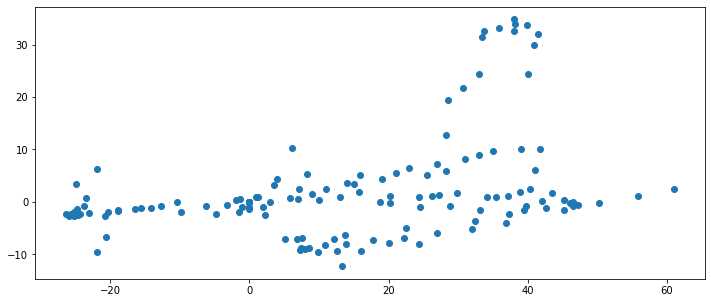

(449, 1)
(449, 1)


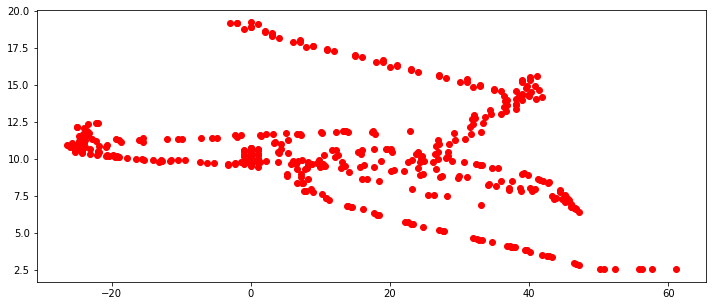

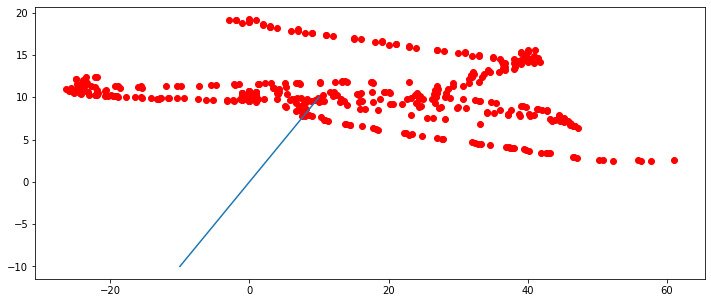

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
194.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from left wall =  1
Sensor from right wall =  65
most távolsagra van a felső faltól =  11.441240148466704
most távolsagra van az alsó faltól =  111.44124014846669
ccccccccccccccccccccccccccccccc

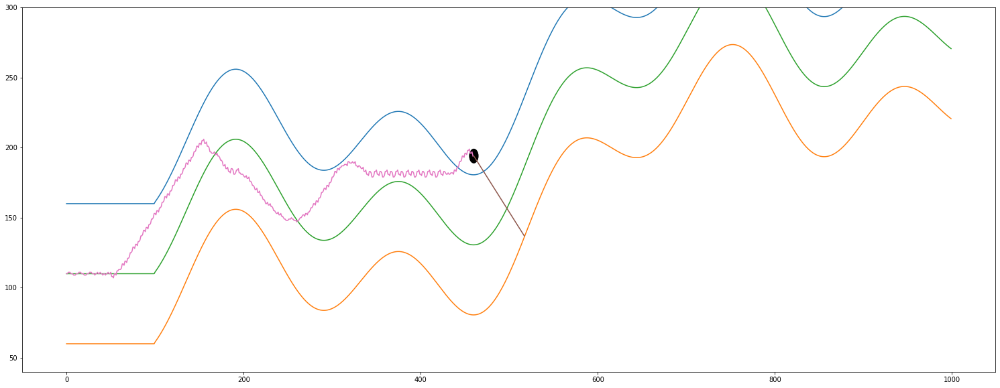

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  460
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 1  1 58]]
actual predicted =  [[7.0841658]]
actual self.y_distance[-1] =  63.405274676994736
len(self.y_distance_real)      =  147
len(self.y_distance_predicted) =  147


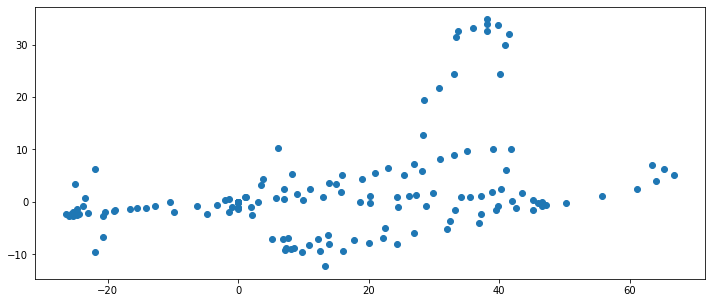

(461, 1)
(461, 1)


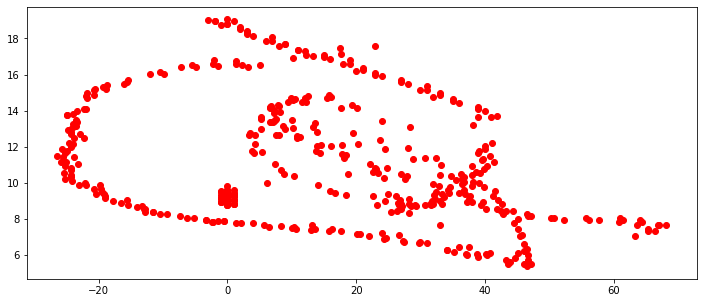

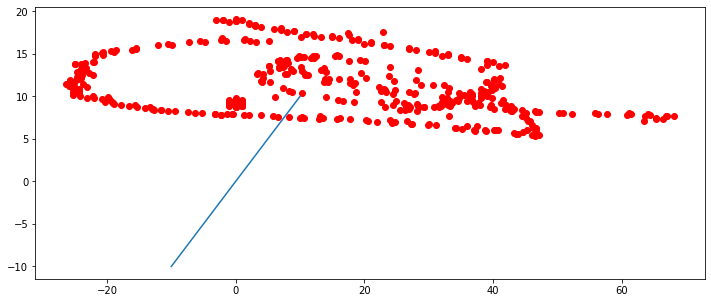

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
194.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from left wall =  1
Sensor from right wall =  58
most távolsagra van a felső faltól =  13.376208306837839
most távolsagra van az alsó faltól =  113.37620830683784
ccccccccccccccccccccccccccccccc

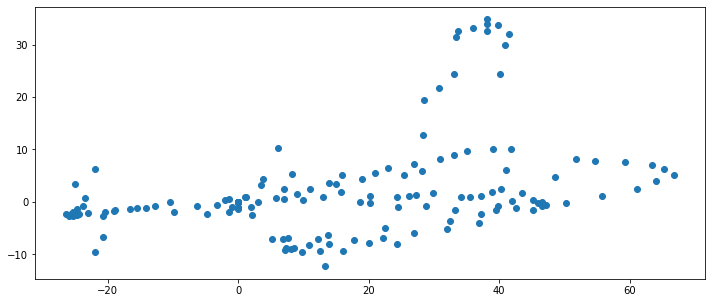

(473, 1)
(473, 1)


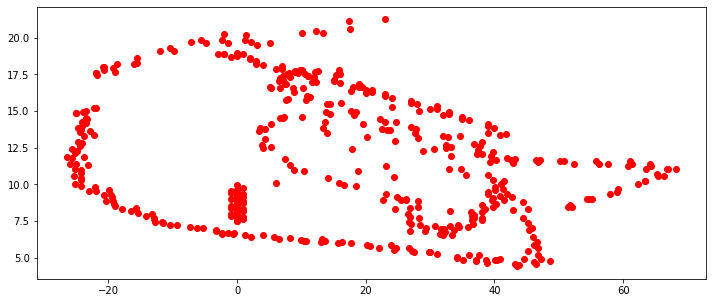

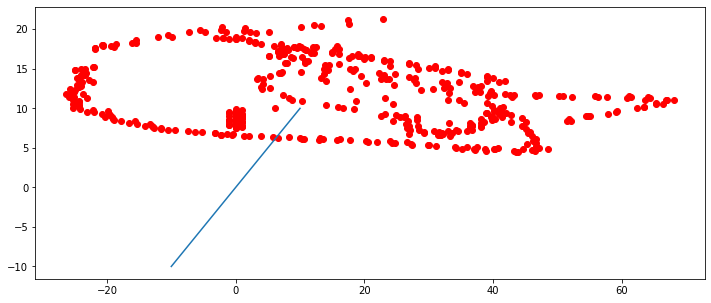

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
182.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  76
Sensor from left wall =  5
Sensor from right wall =  46
most távolsagra van a felső faltól =  1.8929527648866724
most távolsagra van az alsó faltól =  98.10704723511333
ccccccccccccccccccccccccccccccc

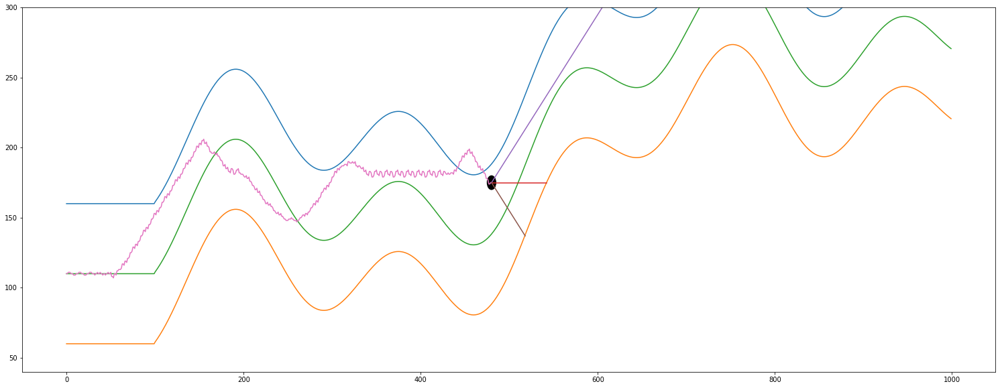

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  480
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (481, 3)
y.shape =  (481, 1)
i       =  480
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  480
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.95548904 -1.56789671]]
		 regression_left.intercept_ =  [1.60026872]
		 ------------------------------- valyon mennyire jó 

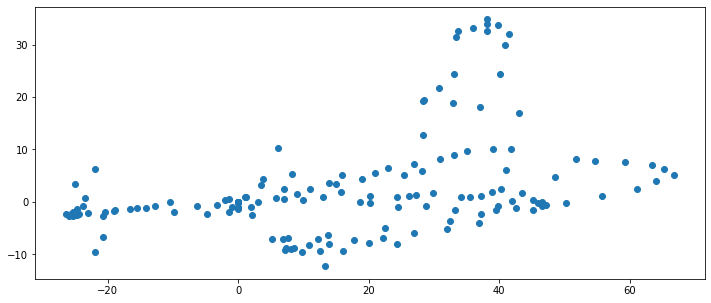

(485, 1)
(485, 1)


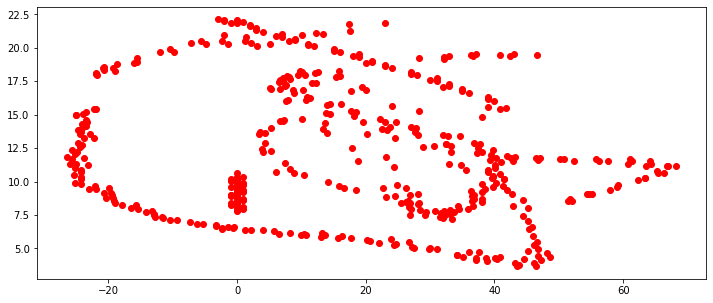

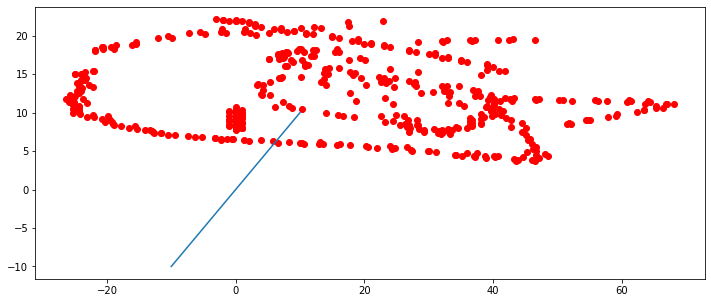

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
170.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  55
Sensor from left wall =  131
Sensor from right wall =  34
most távolsagra van a felső faltól =  22.58461620173719
most távolsagra van az alsó faltól =  77.41538379826281
cccccccccccccccccccccccccccccc

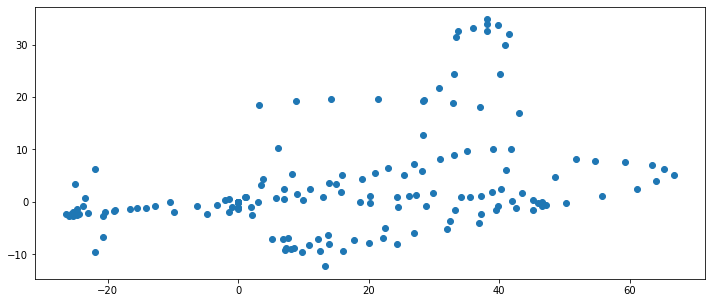

(497, 1)
(497, 1)


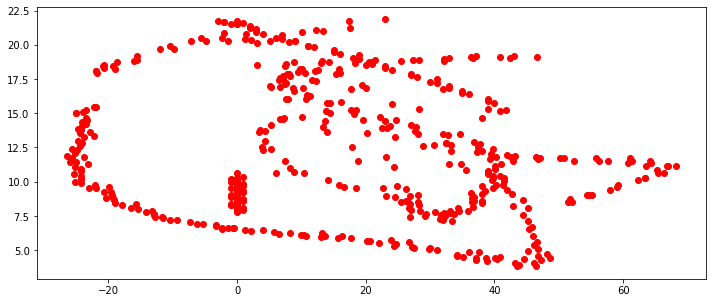

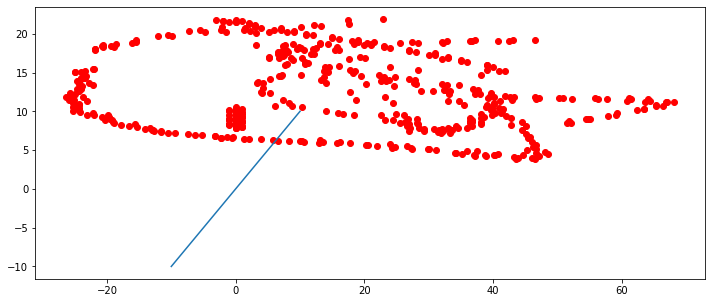

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
158.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  35
Sensor from left wall =  137
Sensor from right wall =  22
most távolsagra van a felső faltól =  48.15748215479553
most távolsagra van az alsó faltól =  51.84251784520447
cccccccccccccccccccccccccccccc

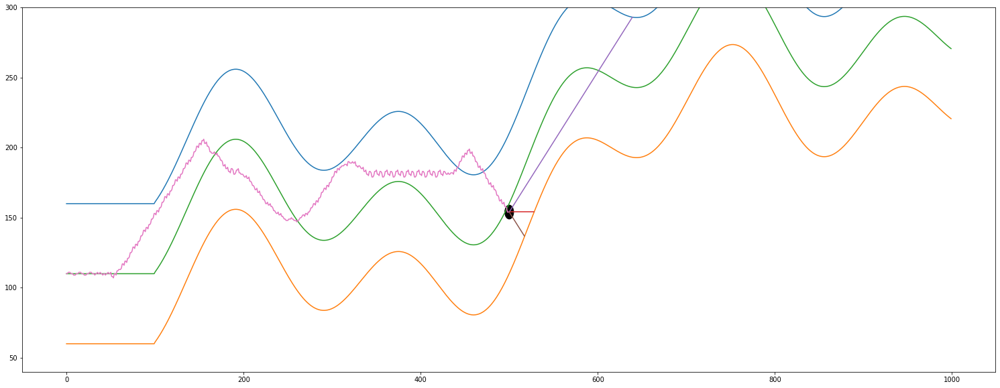

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  500
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  29
Sensor from left wall =  141
Sensor from right wall =  18
most távolsagra van a felső faltól =  57.1827339375173
most távolsagra van az alsó faltól =  42.8172660624827
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  500
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -7.182733937517298
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -7.182733937517298
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  501
			 len(self.sensor_left)   =  501
			 len(self.sensor_center) =  501
	

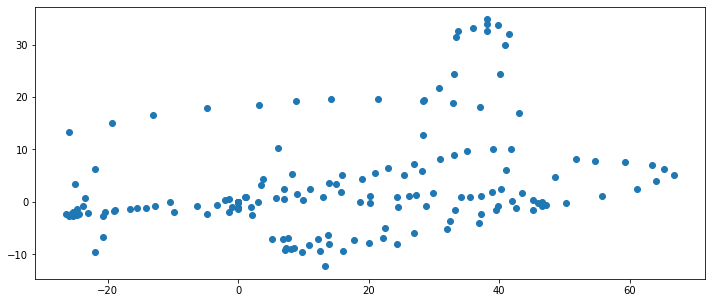

(509, 1)
(509, 1)


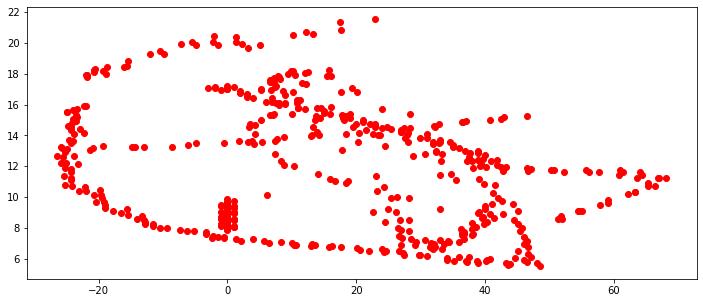

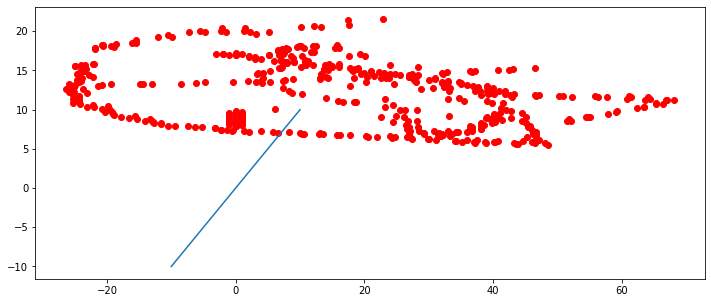

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
146.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  15
Sensor from left wall =  150
Sensor from right wall =  10
most távolsagra van a felső faltól =  77.38775534243672
most távolsagra van az alsó faltól =  22.61224465756328
cccccccccccccccccccccccccccccc

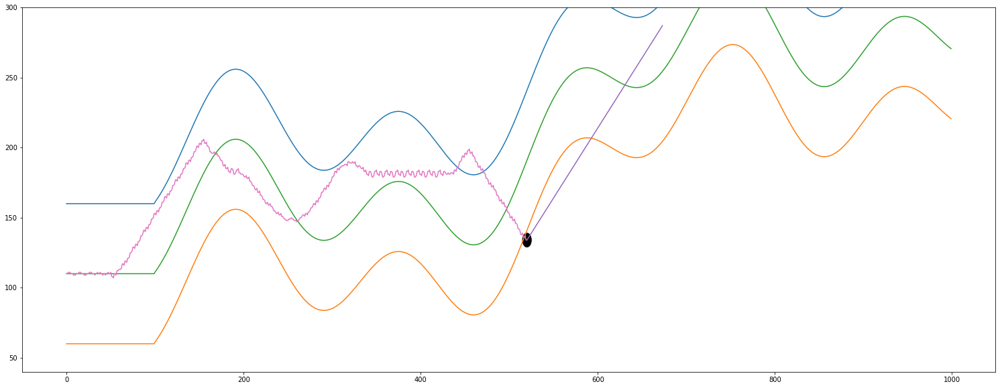

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  520
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[154   1   1]]
actual predicted =  [[1.9733098]]
actual self.y_distance[-1] =  -56.9288795112586
len(self.y_distance_real)      =  167
len(self.y_distance_predicted) =  167


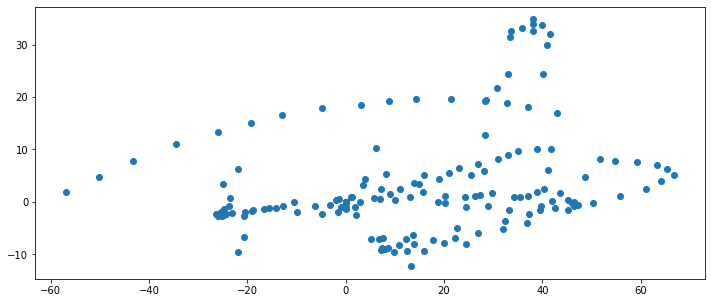

(521, 1)
(521, 1)


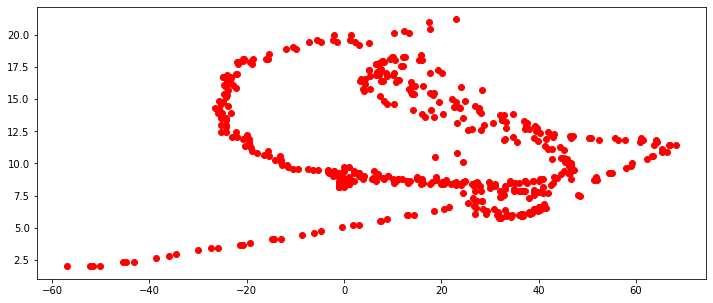

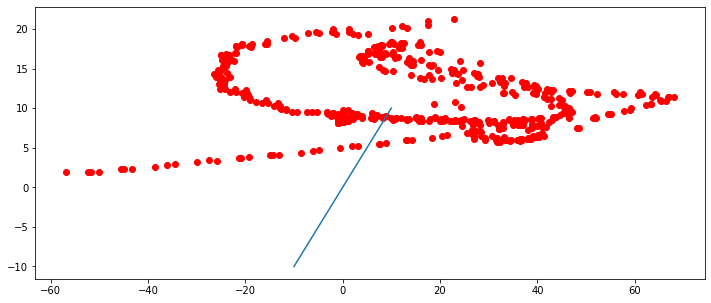

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
134.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  108.55239134168505
most távolsagra van az alsó faltól =  8.552391341685052
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

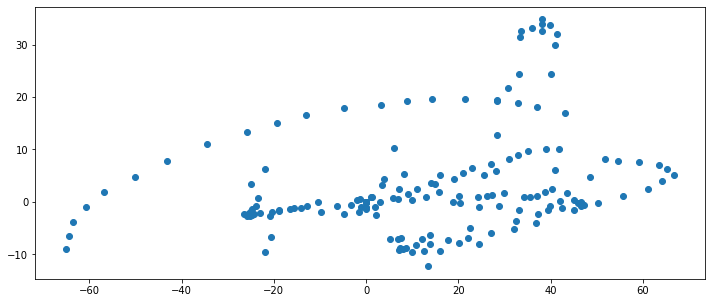

(533, 1)
(533, 1)


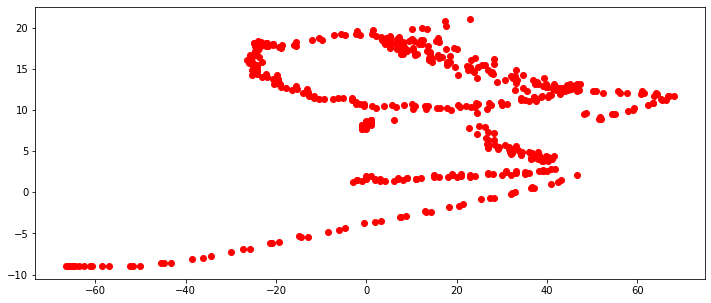

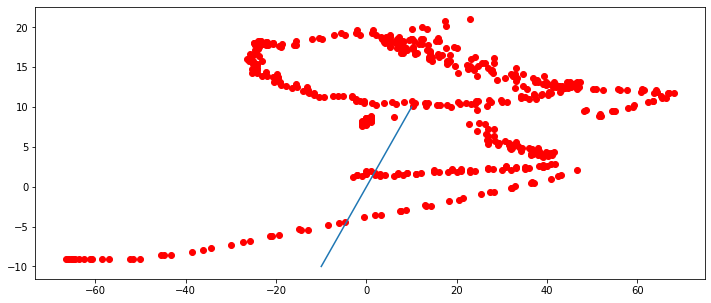

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
145.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  116.6896745462791
most távolsagra van az alsó faltól =  16.689674546279093
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

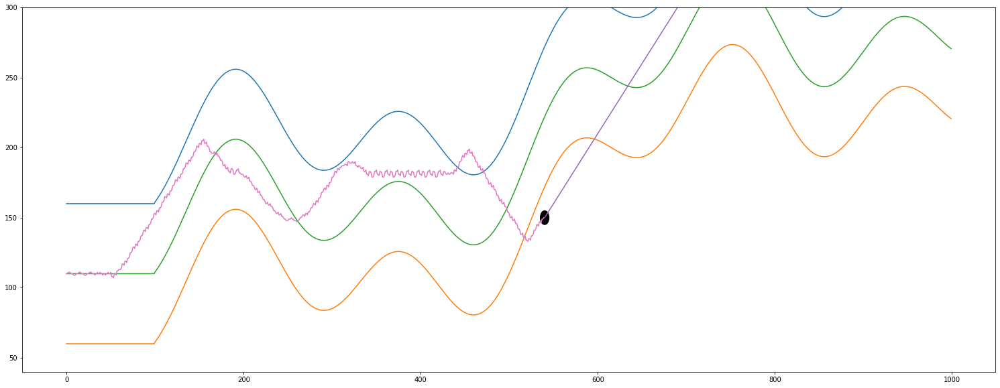

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  540
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (541, 3)
y.shape =  (541, 1)
i       =  540
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  540
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.97770367 -1.44417818]]
		 regression_left.intercept_ =  [0.82756712]
		 ------------------------------- valyon mennyire jó 

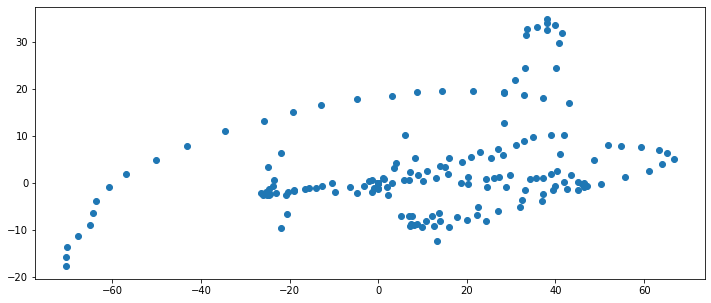

(545, 1)
(545, 1)


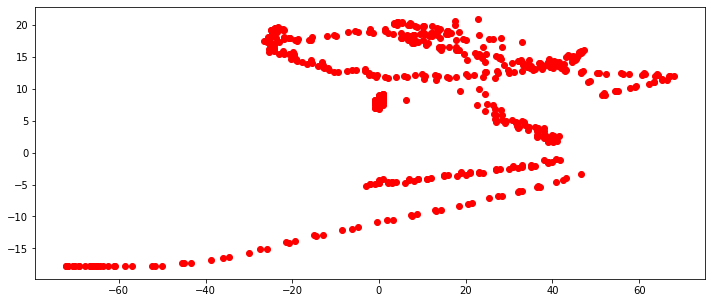

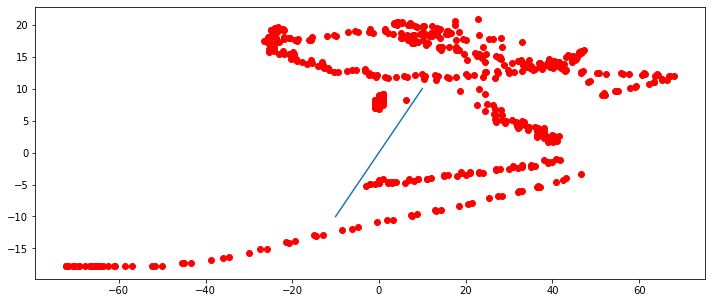

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
157.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  121.89620862557285
most távolsagra van az alsó faltól =  21.896208625572825
ccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

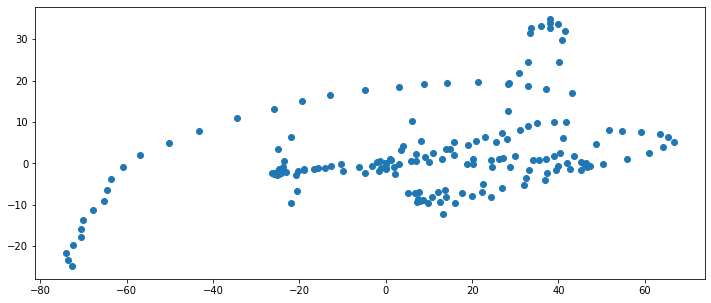

(557, 1)
(557, 1)


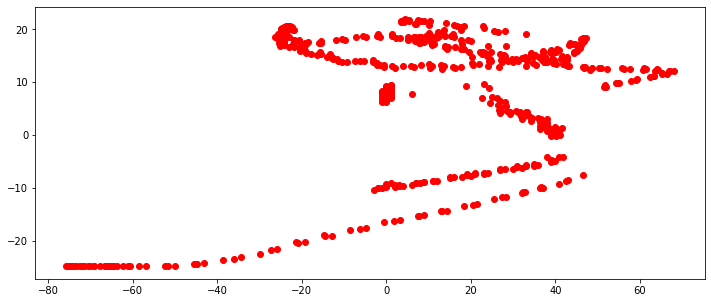

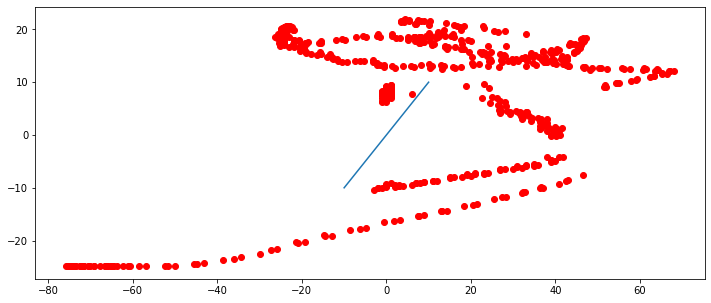

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
169.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  123.61367447491602
most távolsagra van az alsó faltól =  23.613674474916053
ccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

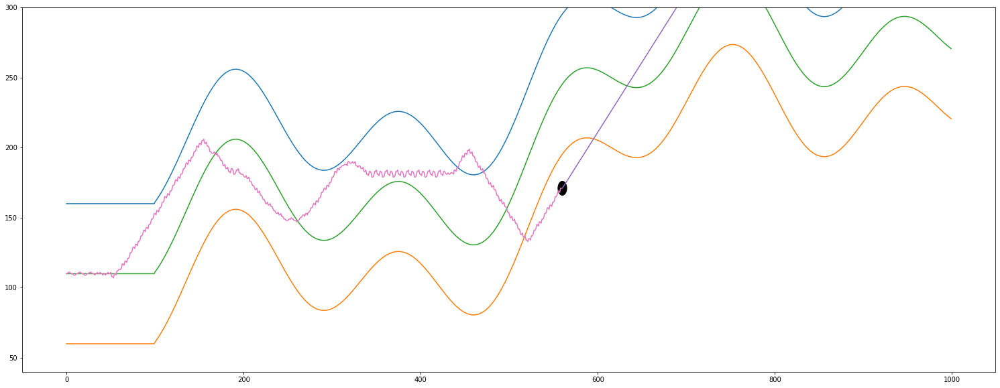

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  560
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  125.36770790234834
most távolsagra van az alsó faltól =  25.36770790234837
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  560
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -75.36770790234834
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -75.36770790234834
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  561
			 len(self.sensor_left)   =  561
			 len(self.sensor_center) =  561
			 len(self.sensor_right)  =

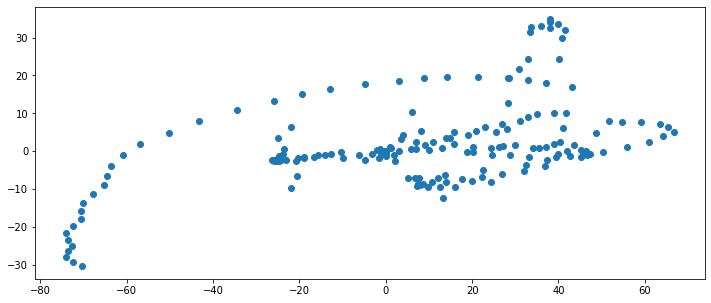

(569, 1)
(569, 1)


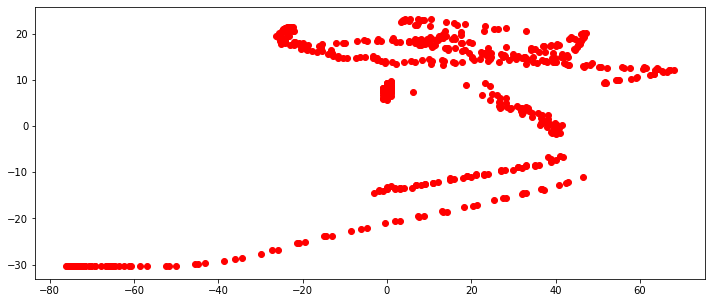

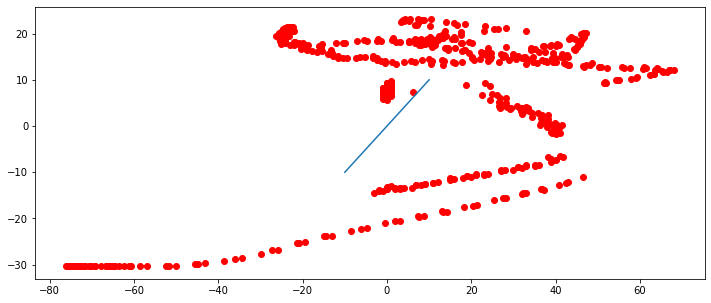

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
181.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  120.86034463046775
most távolsagra van az alsó faltól =  20.86034463046775
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

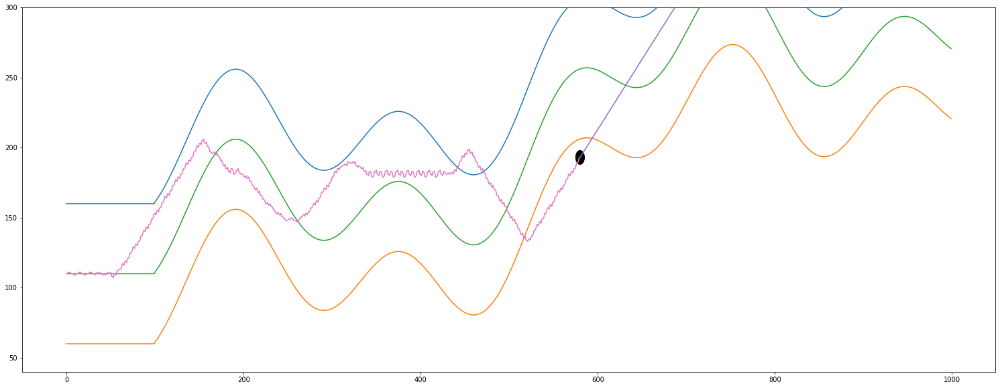

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  580
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[154   1   1]]
actual predicted =  [[-34.3261387]]
actual self.y_distance[-1] =  -63.16911779645295
len(self.y_distance_real)      =  187
len(self.y_distance_predicted) =  187


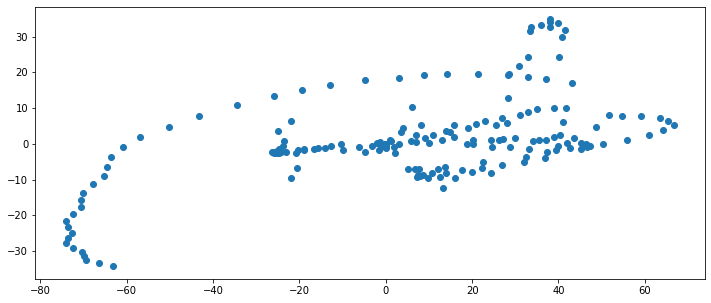

(581, 1)
(581, 1)


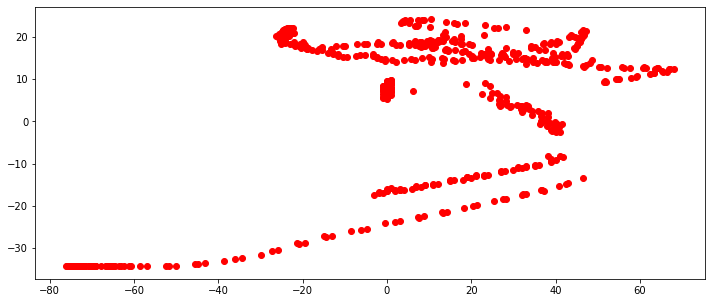

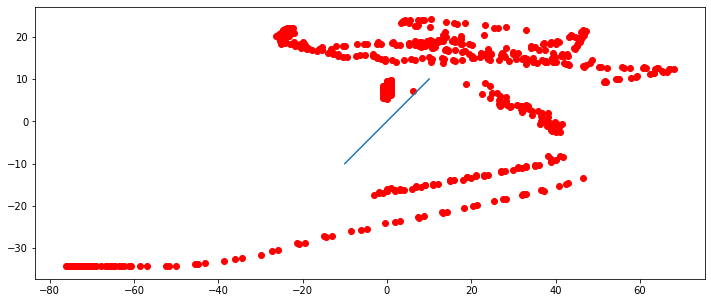

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
193.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  113.37107862999528
most távolsagra van az alsó faltól =  13.37107862999531
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

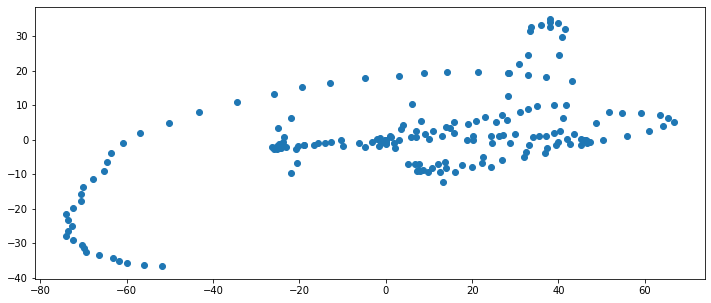

(593, 1)
(593, 1)


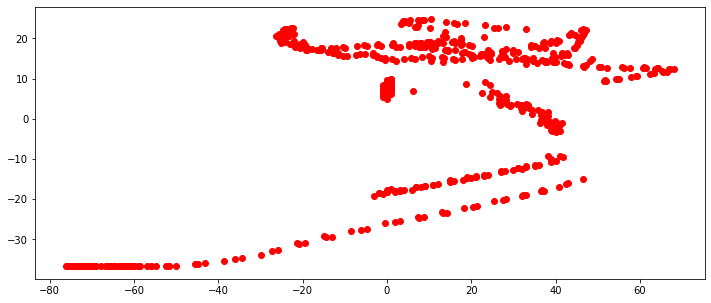

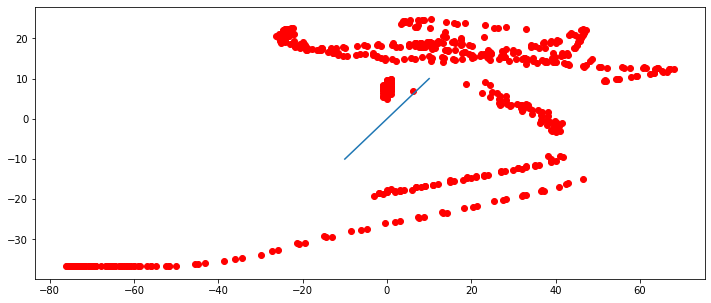

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
205.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  1
Sensor from right wall =  1
most távolsagra van a felső faltól =  101.6239814459982
most távolsagra van az alsó faltól =  1.6239814459981972
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

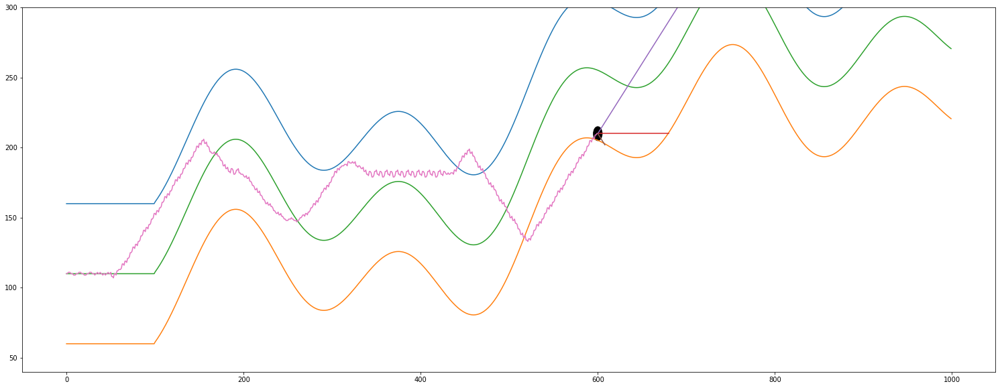

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  600
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (601, 3)
y.shape =  (601, 1)
i       =  600
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  600
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.98588373 -1.30168268]]
		 regression_left.intercept_ =  [0.52935295]
		 ------------------------------- valyon mennyire jó 

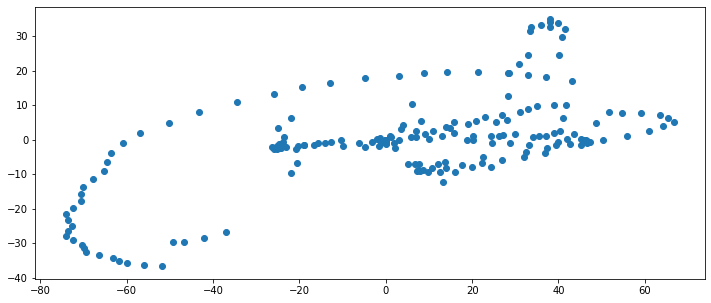

(605, 1)
(605, 1)


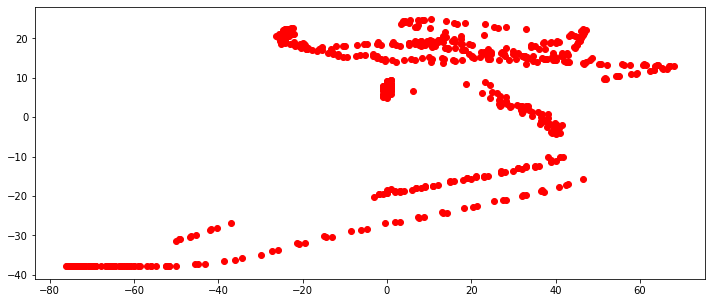

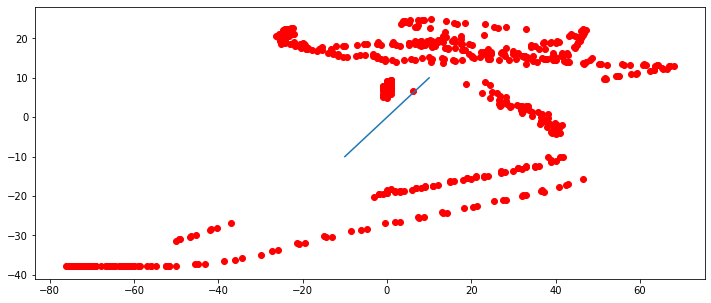

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
217.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  83
Sensor from right wall =  23
most távolsagra van a felső faltól =  86.74980419744304
most távolsagra van az alsó faltól =  13.250195802556988
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccc

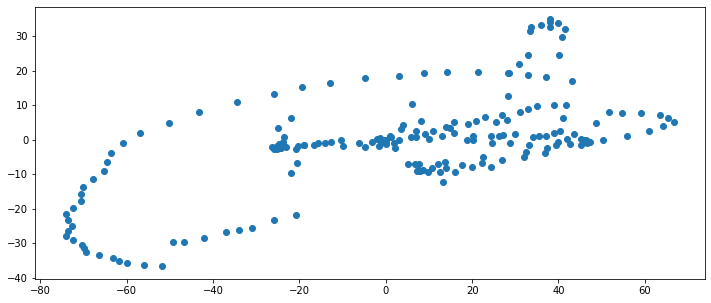

(617, 1)
(617, 1)


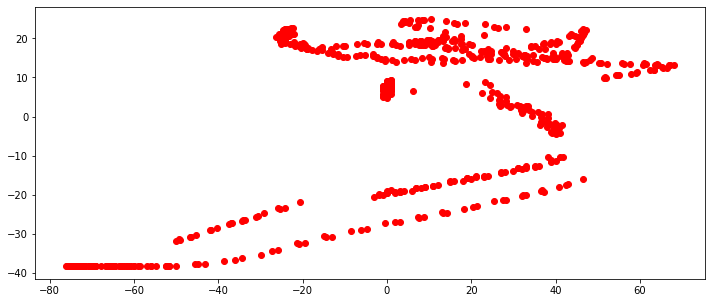

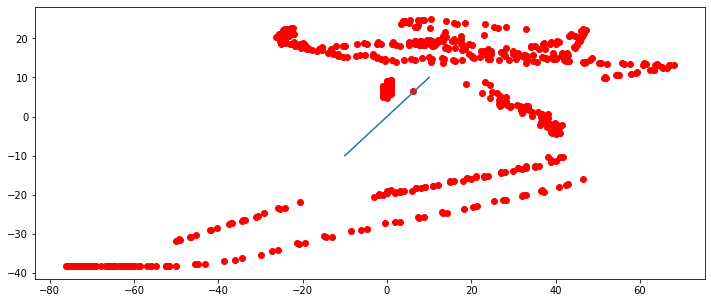

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
229.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  81
Sensor from left wall =  144
Sensor from right wall =  37
most távolsagra van a felső faltól =  70.33867724069188
most távolsagra van az alsó faltól =  29.66132275930812
cccccccccccccccccccccccccccccc

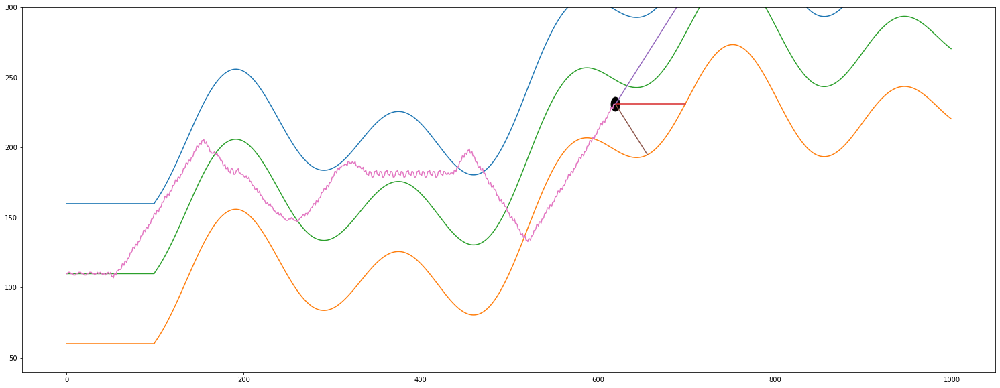

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  620
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  79
Sensor from left wall =  142
Sensor from right wall =  37
most távolsagra van a felső faltól =  68.20479057381601
most távolsagra van az alsó faltól =  31.79520942618396
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  620
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -18.204790573816013
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -18.204790573816013
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  621
			 len(self.sensor_left)   =  621
			 len(self.sensor_center) =  6

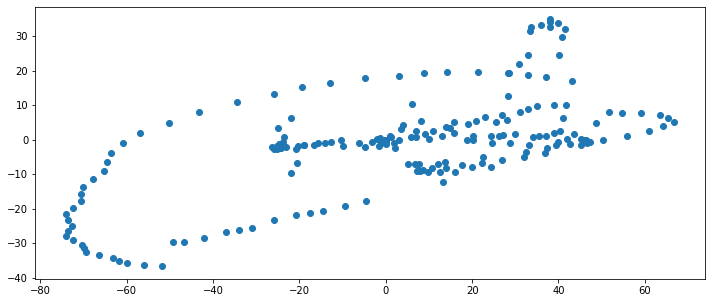

(629, 1)
(629, 1)


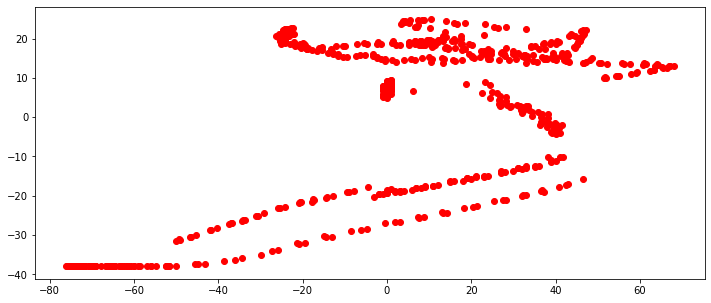

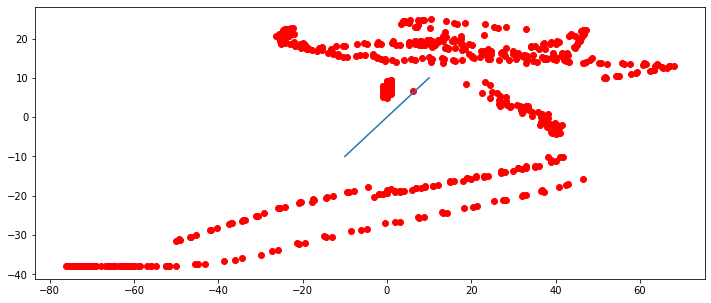

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
241.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  79
Sensor from left wall =  132
Sensor from right wall =  41
most távolsagra van a felső faltól =  54.174968012766215
most távolsagra van az alsó faltól =  45.825031987233785
cccccccccccccccccccccccccccc

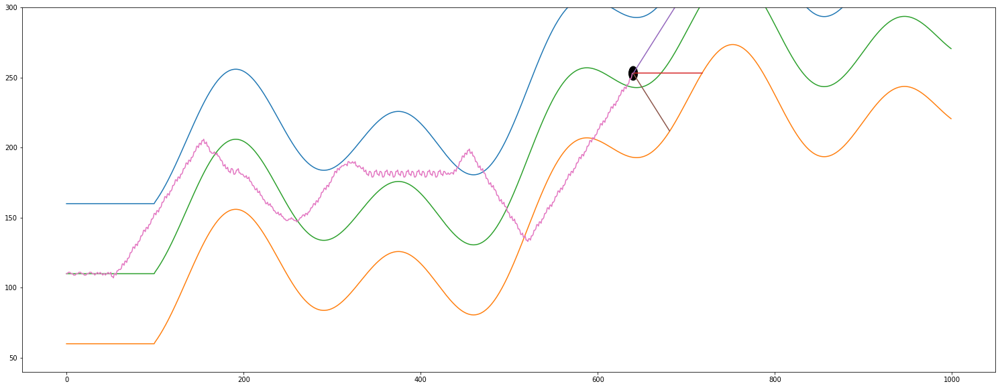

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  640
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[120  79  42]]
actual predicted =  [[-14.12517312]]
actual self.y_distance[-1] =  9.980617161887722
len(self.y_distance_real)      =  207
len(self.y_distance_predicted) =  207


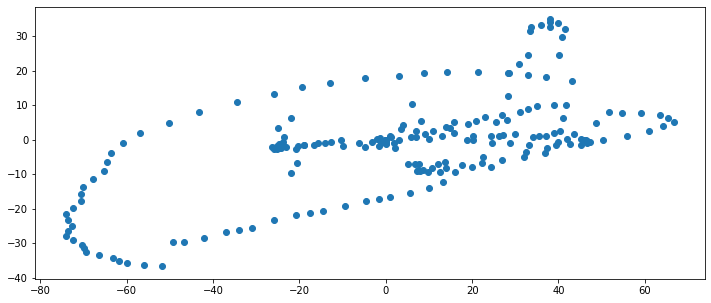

(641, 1)
(641, 1)


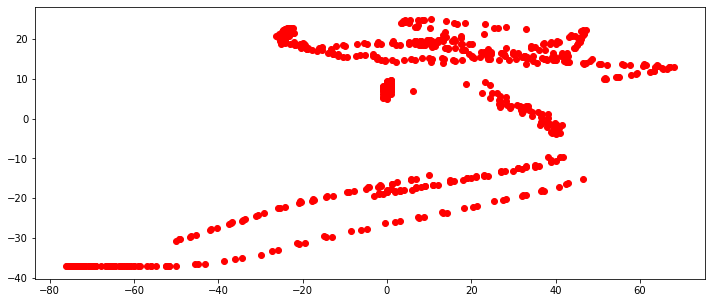

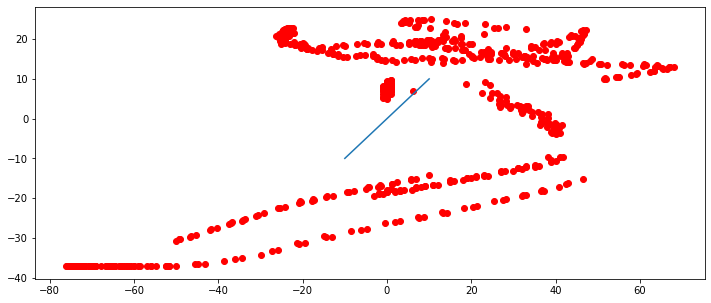

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
253.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  78
Sensor from left wall =  120
Sensor from right wall =  42
most távolsagra van a felső faltól =  39.942391787511156
most távolsagra van az alsó faltól =  60.057608212488844
cccccccccccccccccccccccccccc

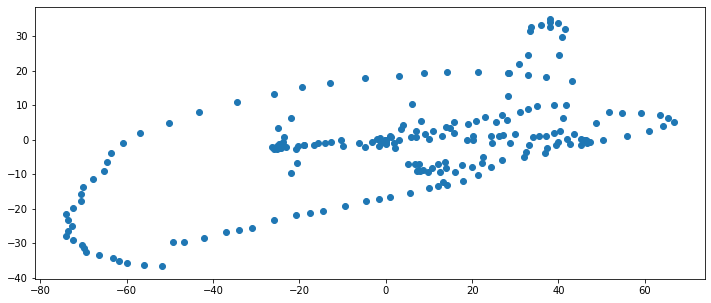

(653, 1)
(653, 1)


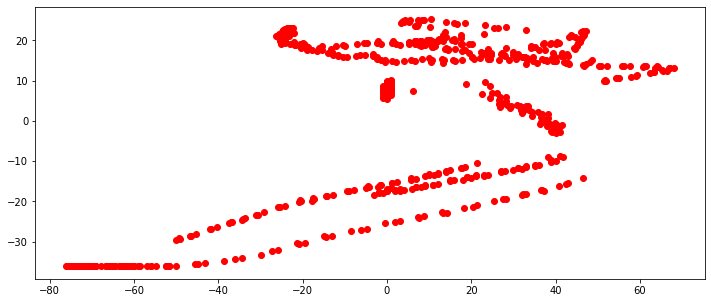

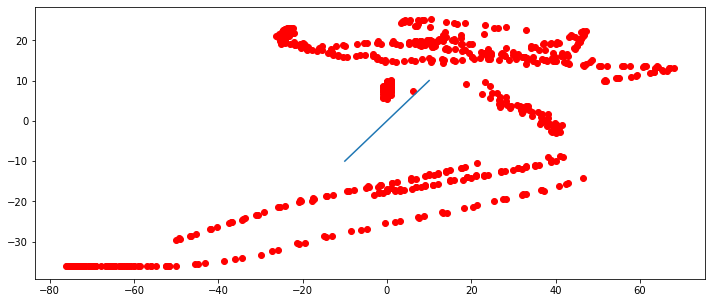

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
265.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  79
Sensor from left wall =  108
Sensor from right wall =  41
most távolsagra van a felső faltól =  28.946183345030192
most távolsagra van az alsó faltól =  71.05381665496981
ccccccccccccccccccccccccccccc

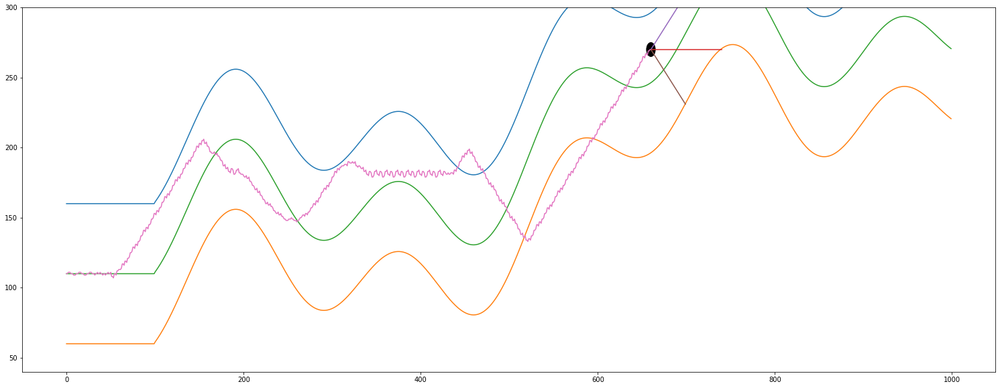

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  660
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (661, 3)
y.shape =  (661, 1)
i       =  660
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  660
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.98838973 -1.22019412]]
		 regression_left.intercept_ =  [0.4637057]
		 ------------------------------- valyon mennyire jó e

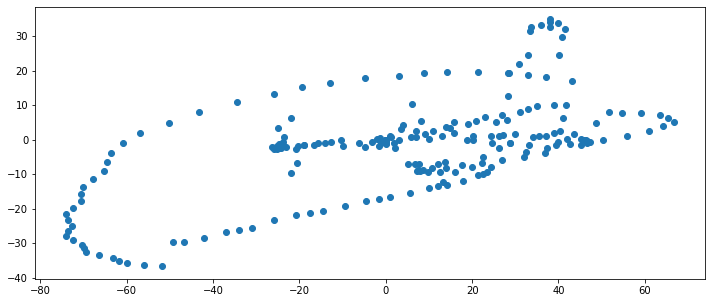

(665, 1)
(665, 1)


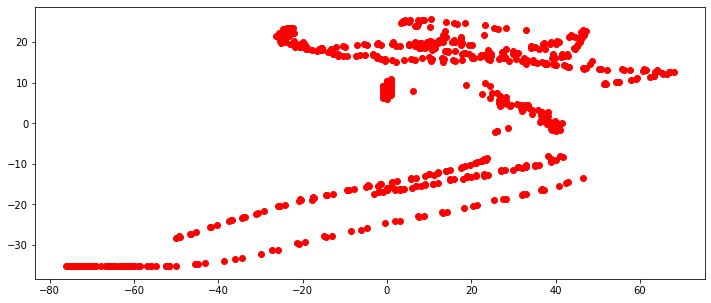

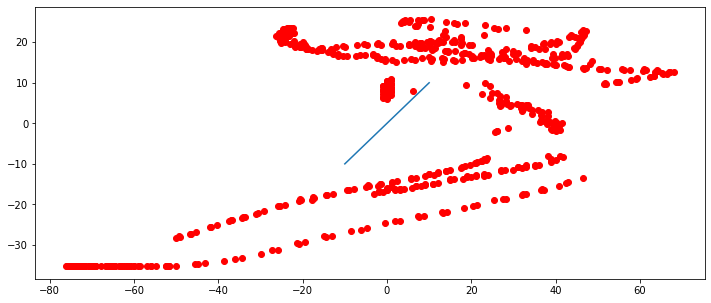

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
277.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  96
Sensor from right wall =  40
most távolsagra van a felső faltól =  21.896422898478818
most távolsagra van az alsó faltól =  78.10357710152121
cccccccccccccccccccccccccccccccccccccccccccccccccc

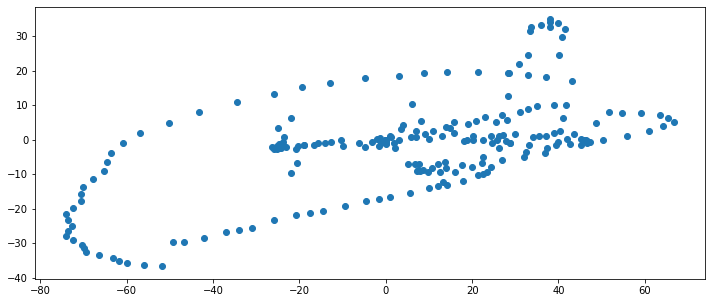

(677, 1)
(677, 1)


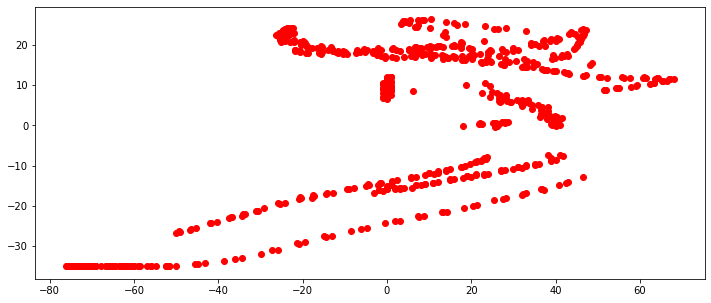

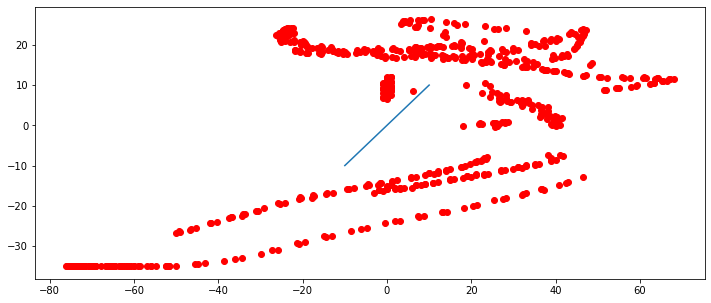

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
275.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  93
Sensor from right wall =  33
most távolsagra van a felső faltól =  32.786929430785335
most távolsagra van az alsó faltól =  67.21307056921466
cccccccccccccccccccccccccccccccccccccccccccccccccc

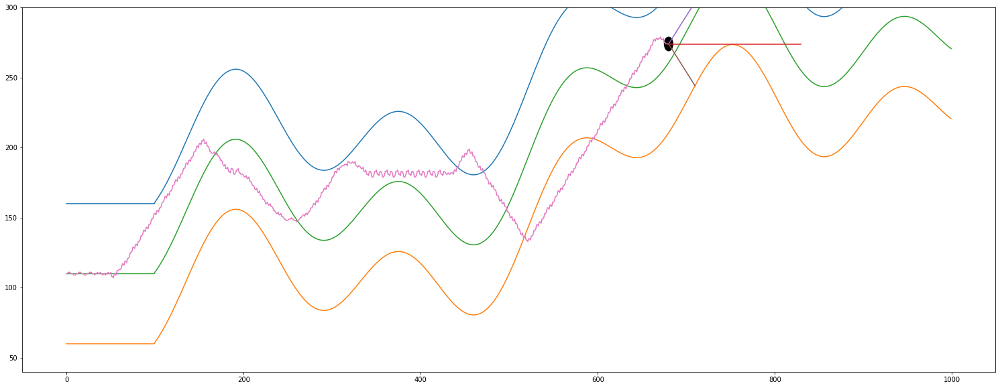

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  680
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  93
Sensor from right wall =  30
most távolsagra van a felső faltól =  37.554592567596956
most távolsagra van az alsó faltól =  62.445407432403044
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  680
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  12.445407432403044
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  12.445407432403044
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  681
			 len(self.sensor_left)   =  681
			 len(self.sensor_center) =  681
			 len(self.senso

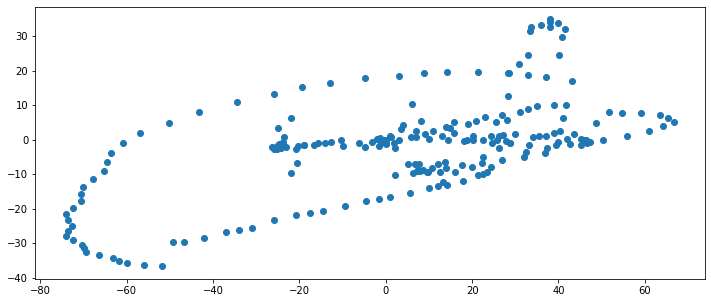

(689, 1)
(689, 1)


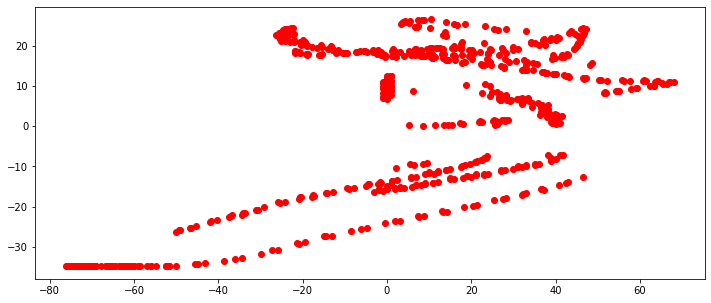

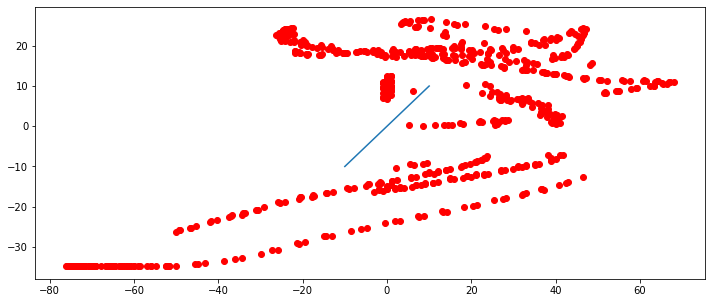

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
271.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  55
Sensor from left wall =  90
Sensor from right wall =  25
most távolsagra van a felső faltól =  48.88901760708359
most távolsagra van az alsó faltól =  51.11098239291641
ccccccccccccccccccccccccccccccc

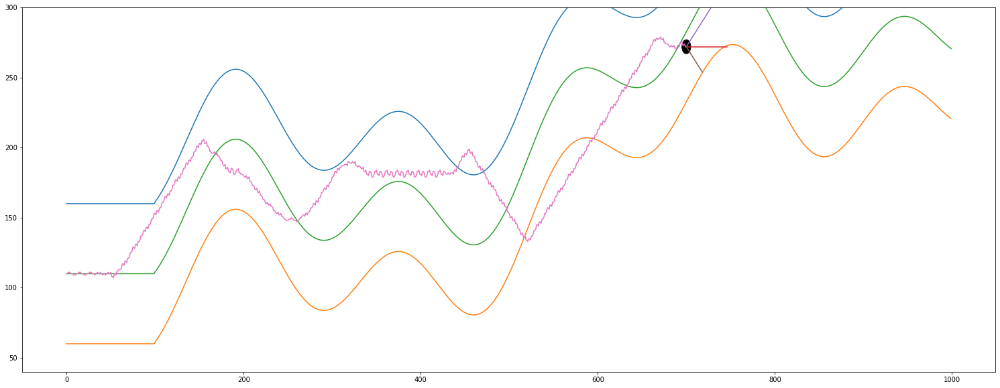

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  700
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[85 47 19]]
actual predicted =  [[-10.97309568]]
actual self.y_distance[-1] =  -10.666392798718505
len(self.y_distance_real)      =  227
len(self.y_distance_predicted) =  227


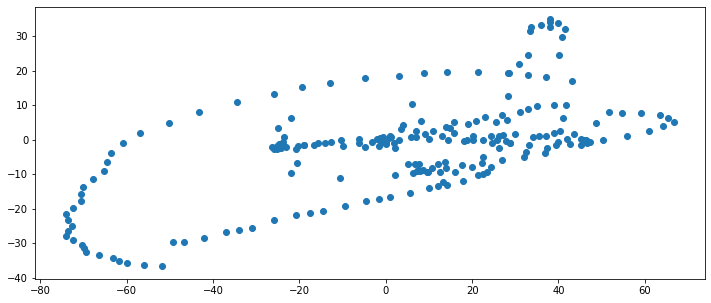

(701, 1)
(701, 1)


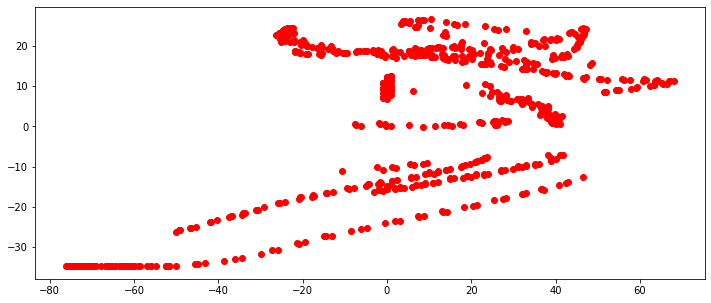

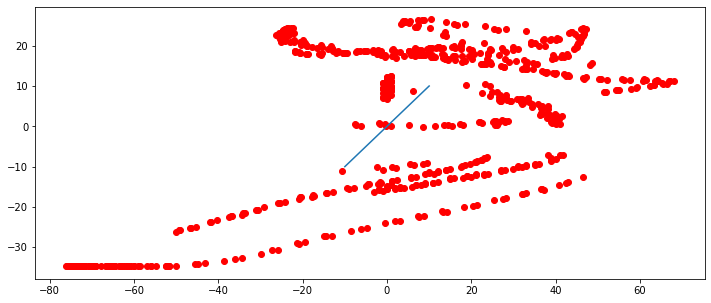

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
272.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  46
Sensor from left wall =  84
Sensor from right wall =  19
most távolsagra van a felső faltól =  61.86124780330624
most távolsagra van az alsó faltól =  38.13875219669376
ccccccccccccccccccccccccccccccc

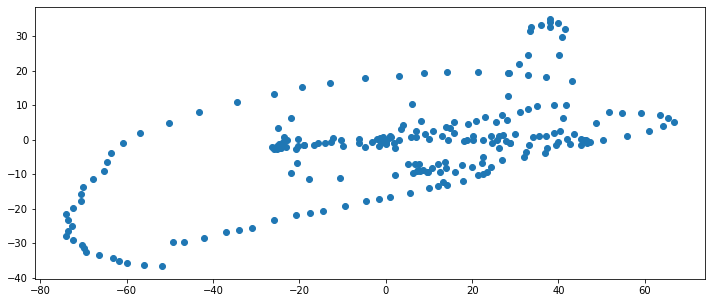

(713, 1)
(713, 1)


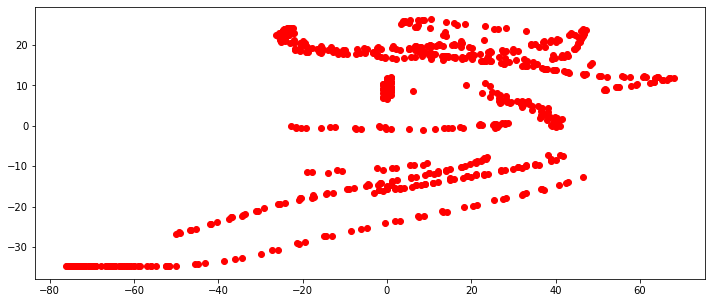

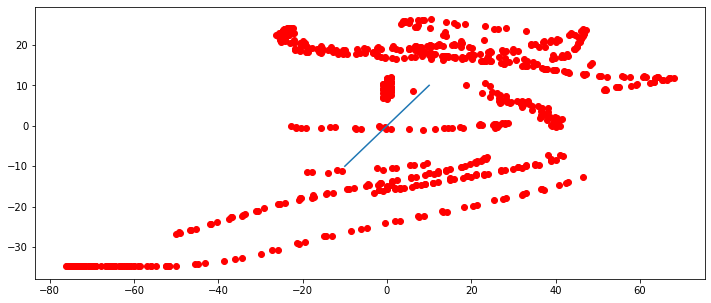

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
274.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  77
Sensor from right wall =  14
most távolsagra van a felső faltól =  73.95795121215224
most távolsagra van az alsó faltól =  26.04204878784779
ccccccccccccccccccccccccccccccccccccccccccccccccccc

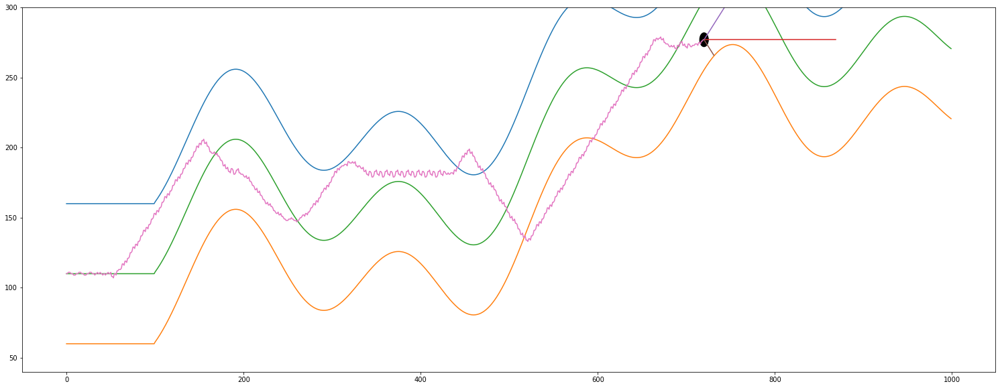

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  720
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (721, 3)
y.shape =  (721, 1)
i       =  720
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  720
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.98863924 -1.1642525 ]]
		 regression_left.intercept_ =  [0.4865741]
		 ------------------------------- valyon mennyire jó e

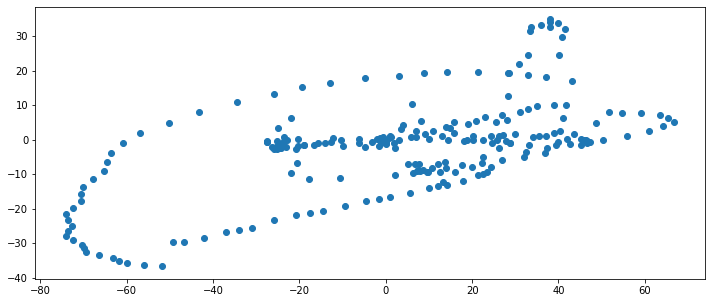

(725, 1)
(725, 1)


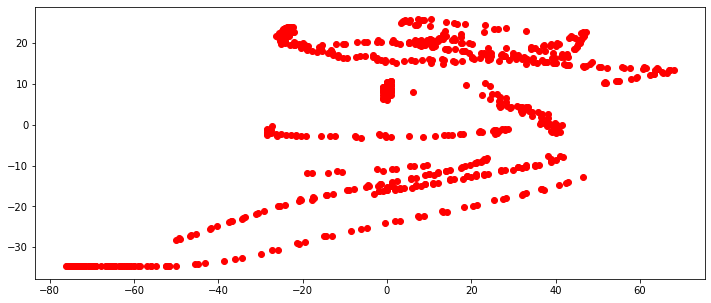

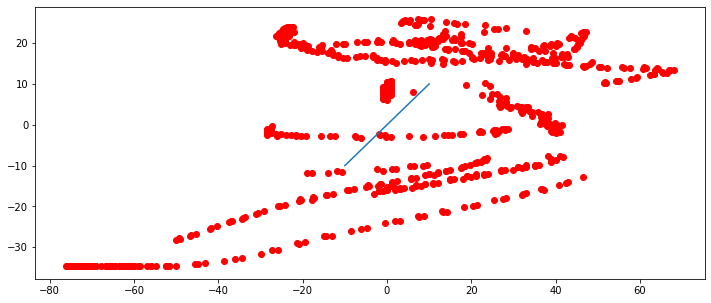

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
282.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  67
Sensor from right wall =  14
most távolsagra van a felső faltól =  78.30368075471506
most távolsagra van az alsó faltól =  21.69631924528494
ccccccccccccccccccccccccccccccccccccccccccccccccccc

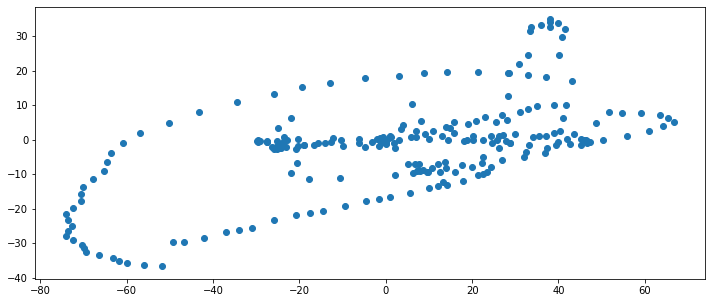

(737, 1)
(737, 1)


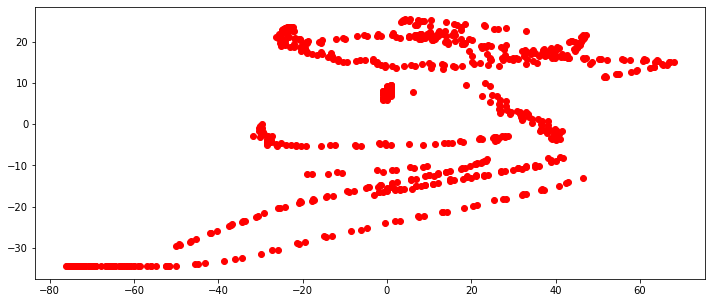

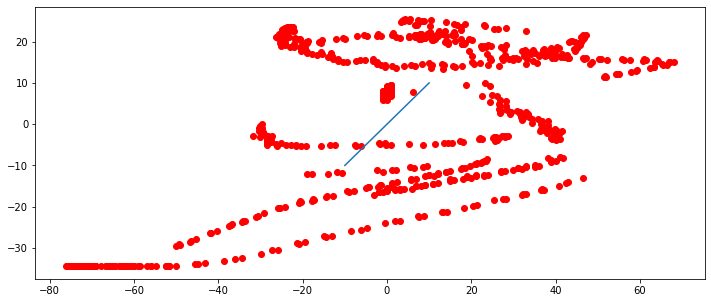

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
289.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  57
Sensor from right wall =  17
most távolsagra van a felső faltól =  80.19029212414466
most távolsagra van az alsó faltól =  19.809707875855338
cccccccccccccccccccccccccccccccccccccccccccccccccc

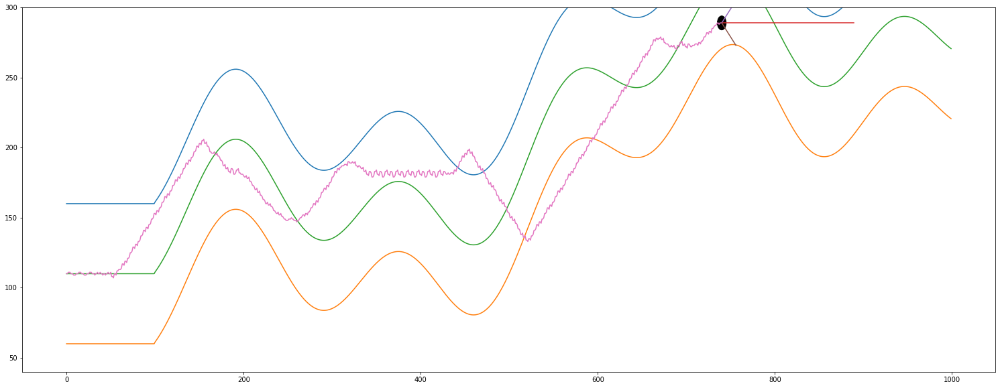

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  740
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  56
Sensor from right wall =  16
most távolsagra van a felső faltól =  82.70988032158562
most távolsagra van az alsó faltól =  17.290119678414385
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  740
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -32.709880321585615
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -32.709880321585615
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  741
			 len(self.sensor_left)   =  741
			 len(self.sensor_center) =  741
			 len(self.sens

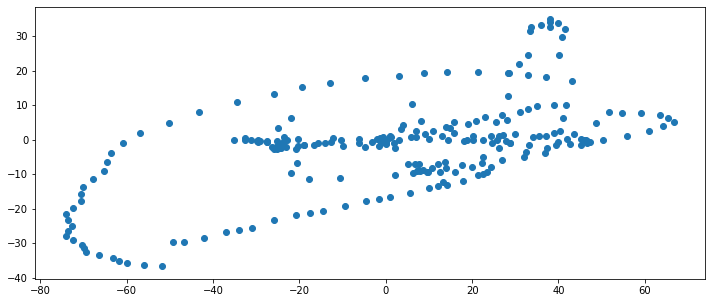

(749, 1)
(749, 1)


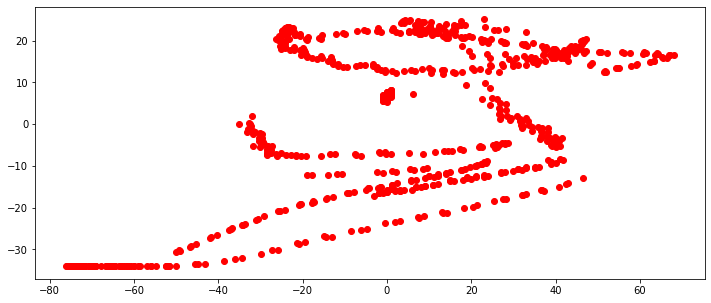

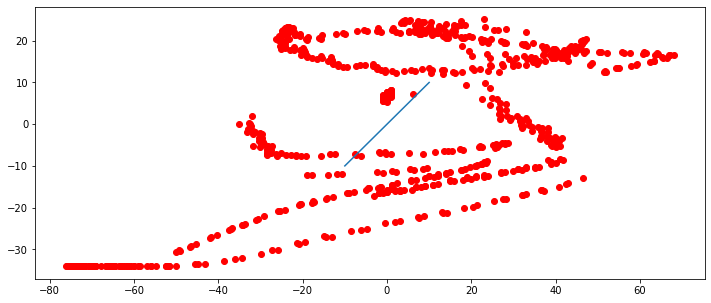

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
288.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  22
most távolsagra van a felső faltól =  85.3497476549062
most távolsagra van az alsó faltól =  14.650252345093804
ccccccccccccccccccccccccccccccccccccccccccccccccccc

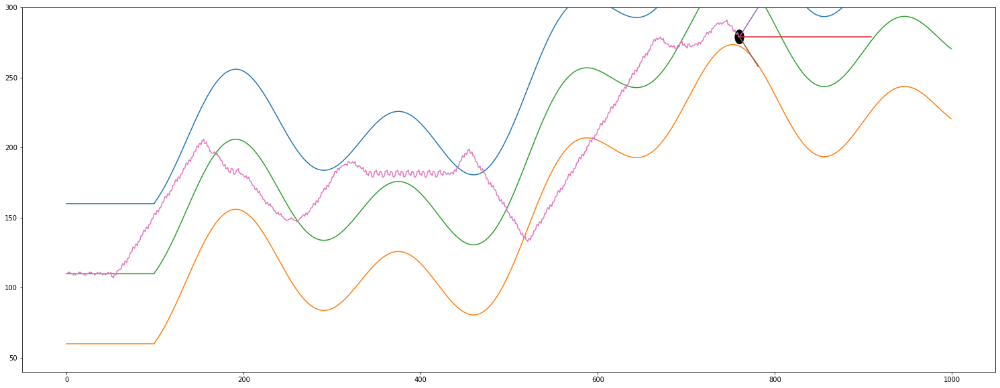

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  760
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 49 150  22]]
actual predicted =  [[-1.23468685]]
actual self.y_distance[-1] =  -43.4649872421914
len(self.y_distance_real)      =  247
len(self.y_distance_predicted) =  247


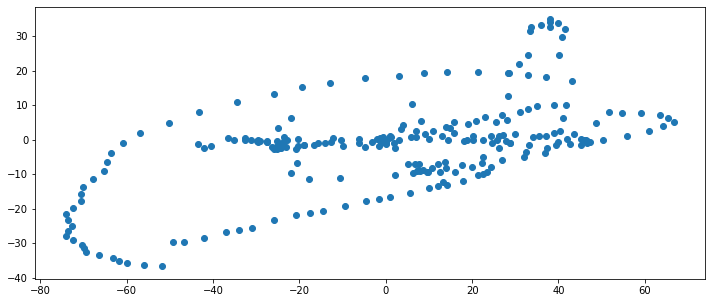

(761, 1)
(761, 1)


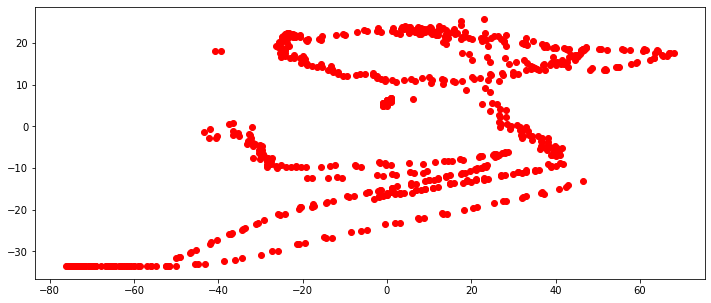

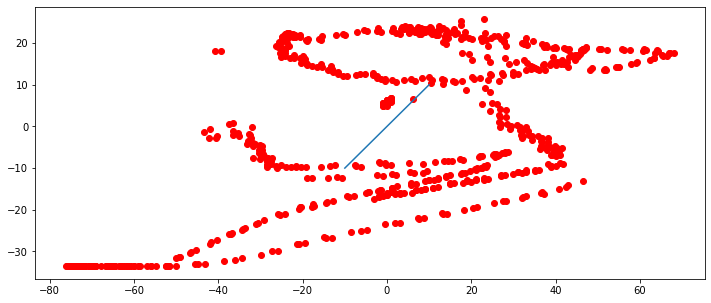

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
279.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  48
Sensor from right wall =  85
most távolsagra van a felső faltól =  93.15952973790377
most távolsagra van az alsó faltól =  6.8404702620962325
cccccccccccccccccccccccccccccccccccccccccccccccccc

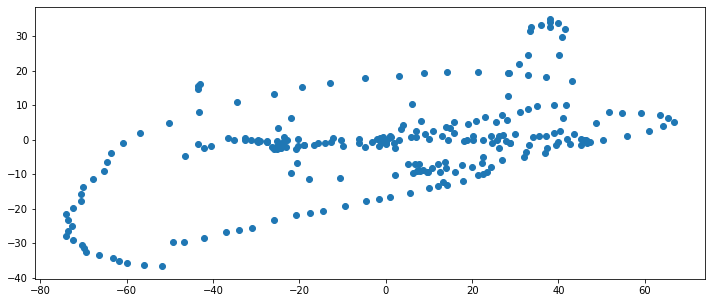

(773, 1)
(773, 1)


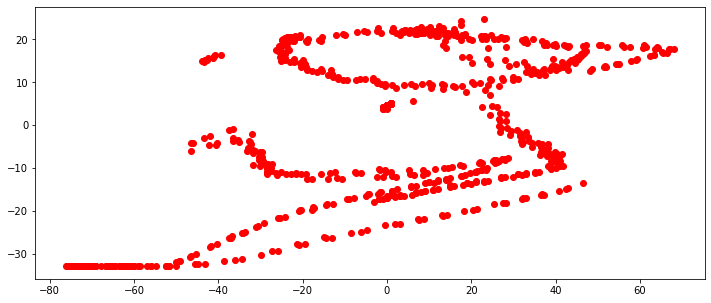

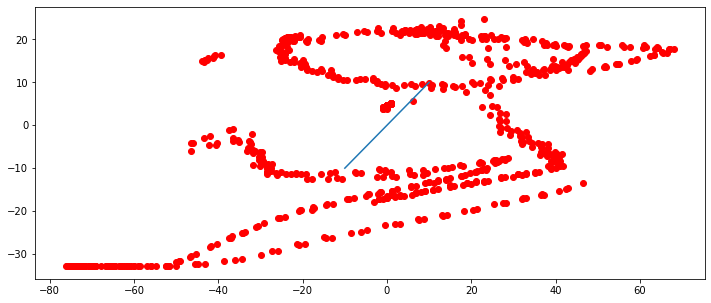

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
273.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  45
Sensor from right wall =  81
most távolsagra van a felső faltól =  92.74815188734436
most távolsagra van az alsó faltól =  7.251848112655637
ccccccccccccccccccccccccccccccccccccccccccccccccccc

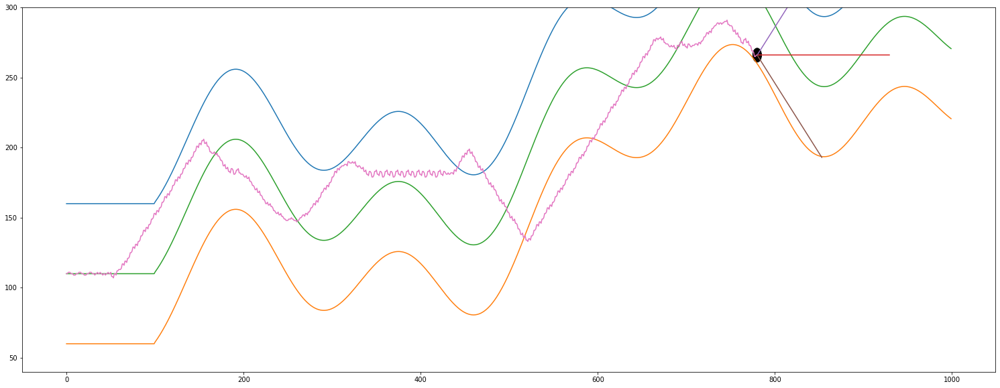

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  780
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (781, 3)
y.shape =  (781, 1)
i       =  780
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  780
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.98864058 -1.10922289]]
		 regression_left.intercept_ =  [0.48408749]
		 ------------------------------- valyon mennyire jó 

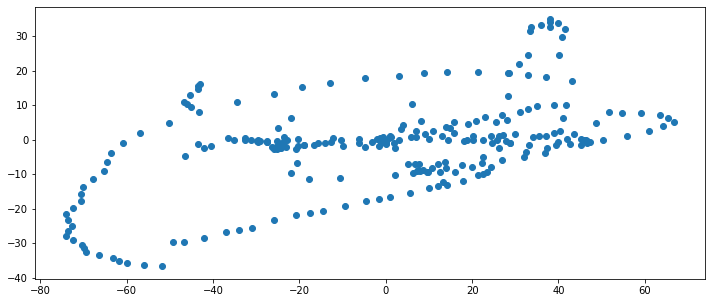

(785, 1)
(785, 1)


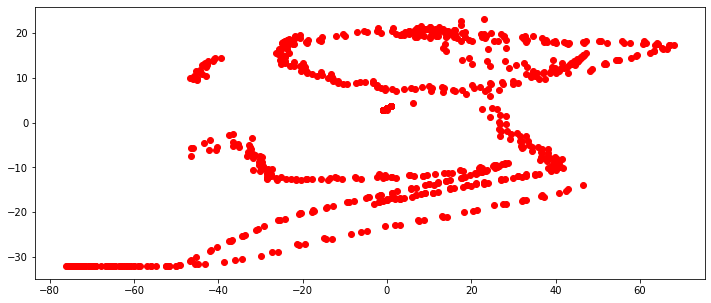

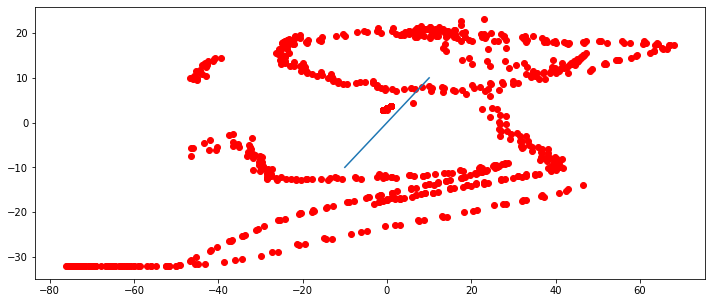

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
261.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  45
Sensor from right wall =  69
most távolsagra van a felső faltól =  93.98399126427194
most távolsagra van az alsó faltól =  6.016008735728036
ccccccccccccccccccccccccccccccccccccccccccccccccccc

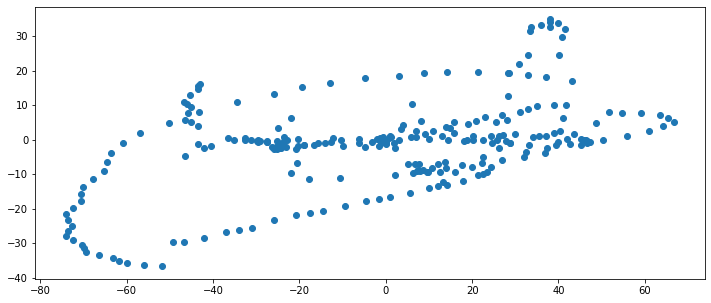

(797, 1)
(797, 1)


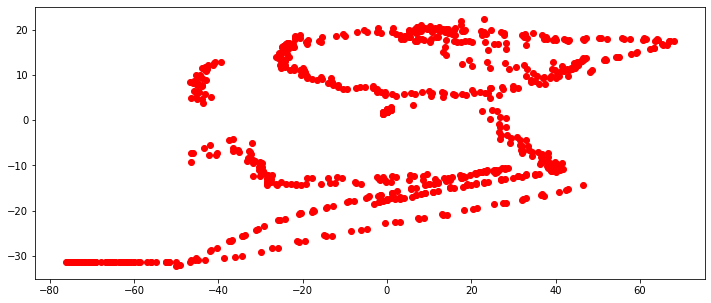

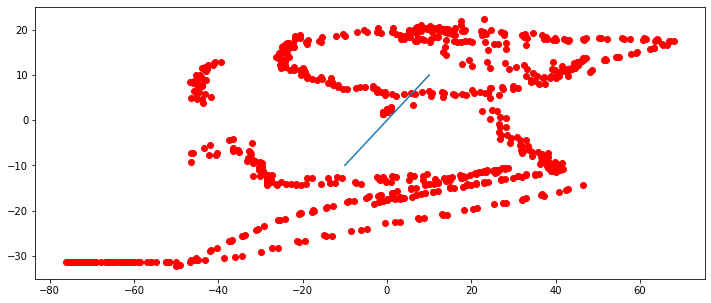

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
249.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  47
Sensor from right wall =  57
most távolsagra van a felső faltól =  92.34905280891064
most távolsagra van az alsó faltól =  7.650947191089358
ccccccccccccccccccccccccccccccccccccccccccccccccccc

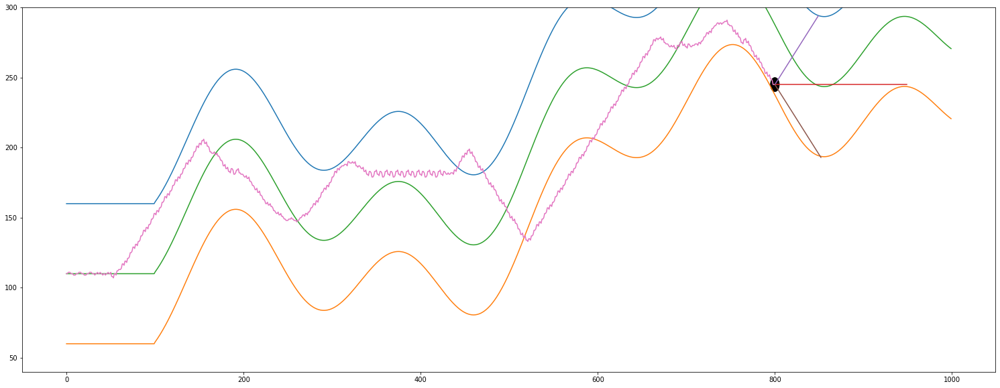

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  800
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  51
Sensor from right wall =  52
most távolsagra van a felső faltól =  93.70664647533977
most távolsagra van az alsó faltól =  6.293353524660262
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  800
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -43.70664647533977
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -43.70664647533977
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  801
			 len(self.sensor_left)   =  801
			 len(self.sensor_center) =  801
			 len(self.sensor_

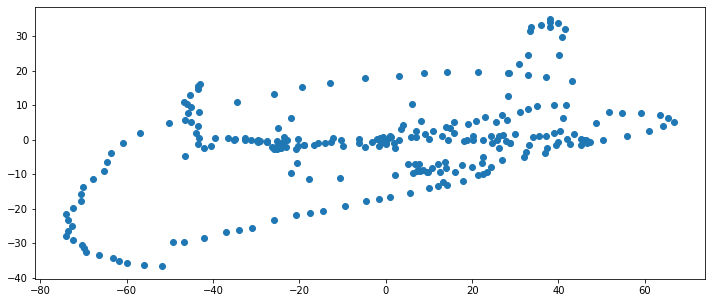

(809, 1)
(809, 1)


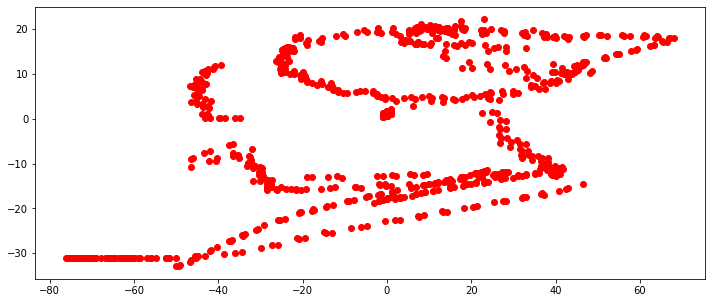

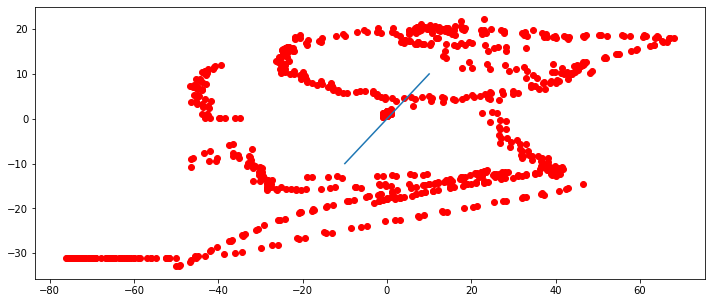

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
243.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  83.71740994867548
most távolsagra van az alsó faltól =  16.28259005132449
ccccccccccccccccccccccccccccccccccccccccccccccccccc

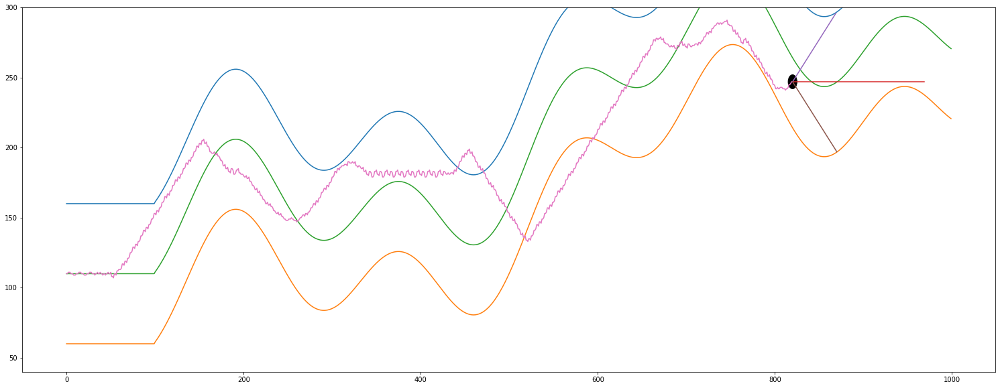

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  820
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 150  51]]
actual predicted =  [[-0.33507846]]
actual self.y_distance[-1] =  -17.126235451319417
len(self.y_distance_real)      =  267
len(self.y_distance_predicted) =  267


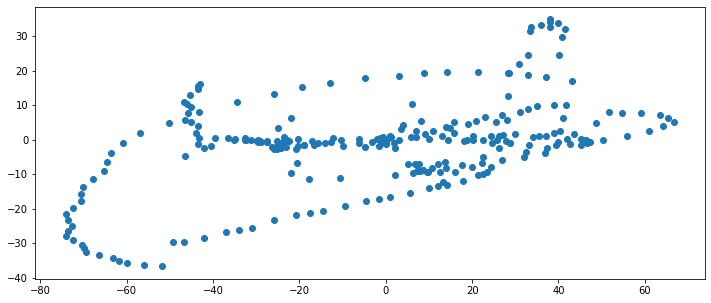

(821, 1)
(821, 1)


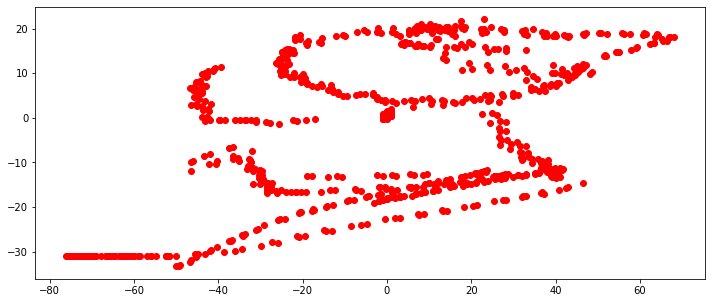

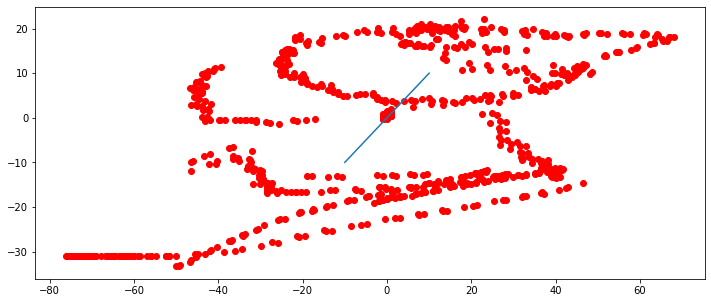

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
247.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  66.07308761442158
most távolsagra van az alsó faltól =  33.92691238557842
ccccccccccccccccccccccccccccccccccccccccccccccccccc

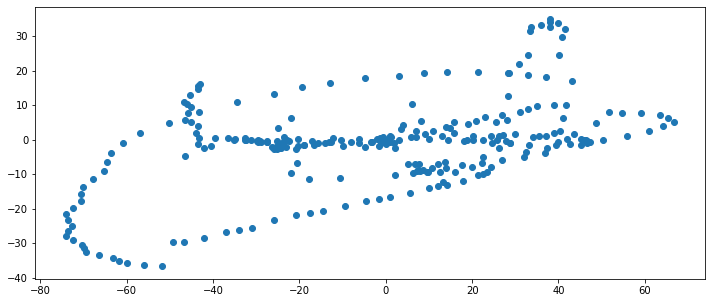

(833, 1)
(833, 1)


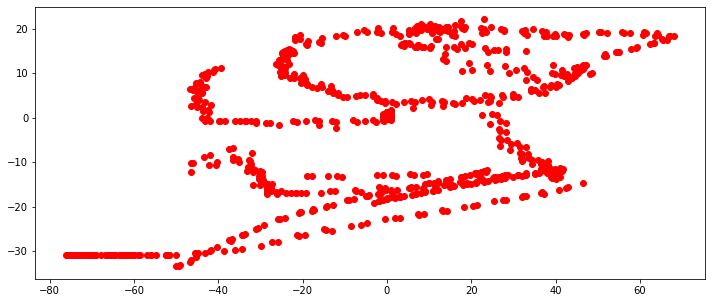

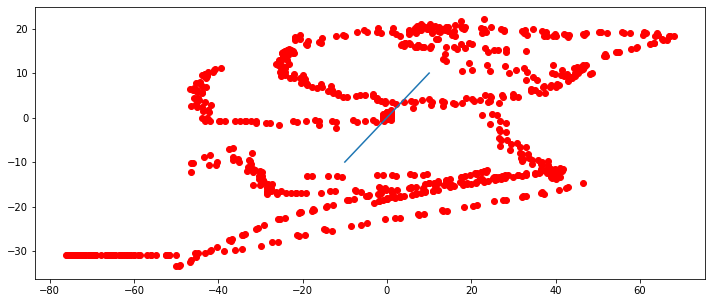

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
254.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  53
Sensor from right wall =  51
most távolsagra van a felső faltól =  48.211689080088604
most távolsagra van az alsó faltól =  51.788310919911424
ccccccccccccccccccccccccccccccccccccccccccccccccc

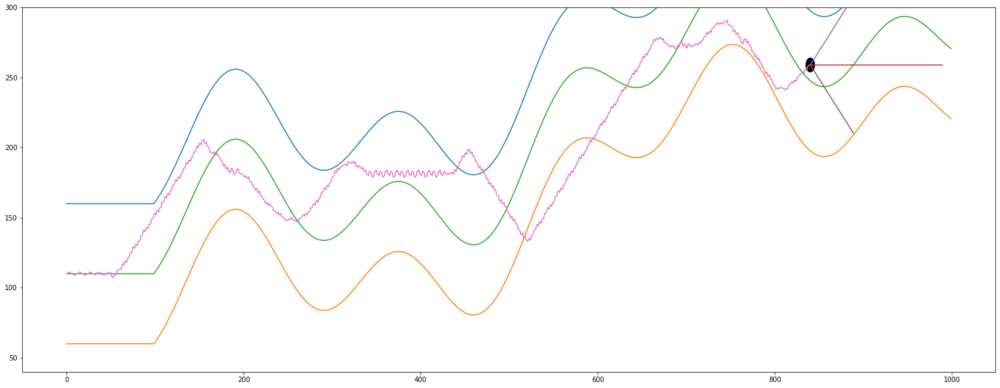

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  840
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (841, 3)
y.shape =  (841, 1)
i       =  840
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  840
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 0.98853648 -1.18313499]]
		 regression_left.intercept_ =  [0.50177521]
		 ------------------------------- valyon mennyire jó 

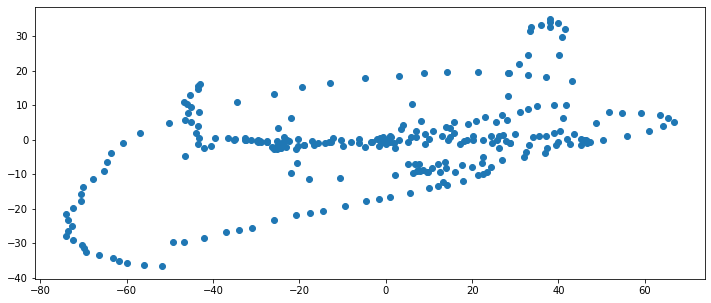

(845, 1)
(845, 1)


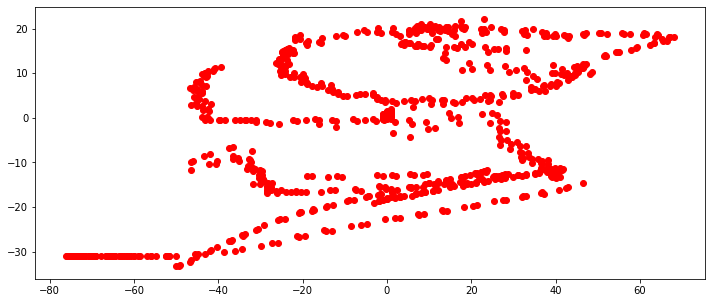

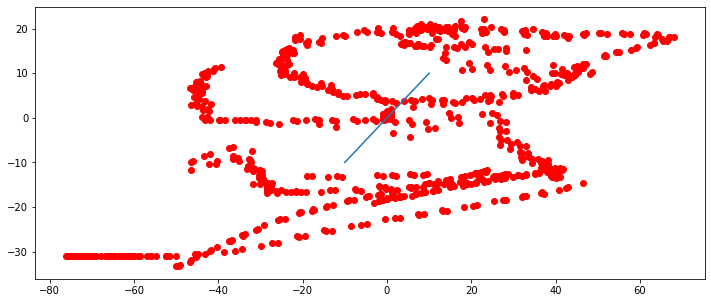

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
263.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  60
Sensor from right wall =  50
most távolsagra van a felső faltól =  32.47261389781022
most távolsagra van az alsó faltól =  67.52738610218975
ccccccccccccccccccccccccccccccccccccccccccccccccccc

IndexError: ignored

In [56]:
auto.run()

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>

Scikit-learn - MLPRegressor API
<br>
https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html

